### __TFM Código Serie temporal Office Supplies__ ###

## __Análisis exploratorio__ ##


Se busca un dataset en la página de Kaggle, en la que vamos a realizar series temporales para varias categorías de producto y aplicado a retail.

Enlace:

https://www.kaggle.com/datasets/rohitsahoo/sales-forecasting/code

In [316]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
# Para la descomposición y las funciones de ACF/PACF
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Ajustes para que las gráficas se vean bien en el notebook
%matplotlib inline
plt.style.use('ggplot')
sns.set_style('whitegrid')

print("Entorno de trabajo configurado.")

Entorno de trabajo configurado.


Cargamos el dataset en formato pandas.DataFrame comprobaremos dicho formato con .info().

In [317]:
#data_continuous_url = "https://colab.research.google.com/content/raw_sales.csv/raw_sales.csv"
#try:
#    df_sales = pd.read_csv(data_continuous_url, parse_dates=["timestamp"], index_col="timestamp")

df_sales = pd.read_csv(r"KaggleSalesdataset.csv")


Vamos a explorar el Dataframe con head(), info() y dtypes para conocer con exactitud cómo está compuesto nuestra serie temporal de Kaggle.

In [318]:
print(df_sales.head())

   Row ID        Order ID  Order Date   Ship Date       Ship Mode Customer ID  \
0       1  CA-2017-152156  08/11/2017  11/11/2017    Second Class    CG-12520   
1       2  CA-2017-152156  08/11/2017  11/11/2017    Second Class    CG-12520   
2       3  CA-2017-138688  12/06/2017  16/06/2017    Second Class    DV-13045   
3       4  US-2016-108966  11/10/2016  18/10/2016  Standard Class    SO-20335   
4       5  US-2016-108966  11/10/2016  18/10/2016  Standard Class    SO-20335   

     Customer Name    Segment        Country             City       State  \
0      Claire Gute   Consumer  United States        Henderson    Kentucky   
1      Claire Gute   Consumer  United States        Henderson    Kentucky   
2  Darrin Van Huff  Corporate  United States      Los Angeles  California   
3   Sean O'Donnell   Consumer  United States  Fort Lauderdale     Florida   
4   Sean O'Donnell   Consumer  United States  Fort Lauderdale     Florida   

   Postal Code Region       Product ID         Cat

Observamos que en el conjunto de datos descrito, vemos todas las variables de nuestro dataset y describimos cada una de ellas para conocer en profundidad nuestro conjunto de datos:

- __Row ID.__ Sería la fila de cada compra realizada en un momento determinado.

- __Order ID.__ Sería el número de pedido.

- __Order Date.__ Sería la fecha en la que se realiza el pedido.

- __Ship Date.__ Fecha de envío de dicho de pedido.

- __Ship Mode.__ La forma de envío de dicho pedido.

- __Customer ID.__ Identificador del cliente.

- __Customer Name.__ Nombre del cliente.

- __Segment.__ Tipo de segmentación de cliente.

- __Country.__ País de la operación de venta.

- __City.__ Ciudad de la operación de venta.

- __State.__ Estado del país.

- __PostalCode.__ Código postal del país.

- __Region.__ Región del país, coordenadas.

- __Product ID.__ Identificador del producto vendido.

- __Category.__ Categoría de producto.

- __Subcategory.__ Subcategoría de producto.

- __Product Name.__ Nombre del producto.

- __Sales.__ Variable numérica de venta.



In [319]:
print(df_sales.dtypes)

Row ID             int64
Order ID          object
Order Date        object
Ship Date         object
Ship Mode         object
Customer ID       object
Customer Name     object
Segment           object
Country           object
City              object
State             object
Postal Code      float64
Region            object
Product ID        object
Category          object
Sub-Category      object
Product Name      object
Sales            float64
dtype: object


Observamos la naturaleza del conjunto de variables de nuestro dataset. Por un lado, tenemos que variables numéricas como son los códigos postales y la venta, principalmente nos interesa tener ese formato en la venta, ya que será la variable a proyectar.

Por otro lado, tenemos la variable Ship Date que está en formato datetime64, en la que hemos tenido que transformar para poder trabajar correctamente la series temporales.

Por otro lado, se han creado las variables pedido_d, pedido_m y pedido_y, para evaluar en distintos periodos la evolución de las ventas realizas en distintos formatos de tiempo y de esa manera poder representar las series temporales de manera correcta.

El resto de variables tienen el formato objects, al ser variables en forma categóricas.

Este dataset por su composición después del análisis permite segmentar la información por múltiples maneras, ya que se pueden segmentar los clientes, se puede segmentar por categorías, subproductos y productos.


In [320]:
print(df_sales.columns)

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales'],
      dtype='object')


Hacemos una exploración rápida del número de columnas del .csv y vemos qué columnas tenemos.

In [321]:
df_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Row ID         9800 non-null   int64  
 1   Order ID       9800 non-null   object 
 2   Order Date     9800 non-null   object 
 3   Ship Date      9800 non-null   object 
 4   Ship Mode      9800 non-null   object 
 5   Customer ID    9800 non-null   object 
 6   Customer Name  9800 non-null   object 
 7   Segment        9800 non-null   object 
 8   Country        9800 non-null   object 
 9   City           9800 non-null   object 
 10  State          9800 non-null   object 
 11  Postal Code    9789 non-null   float64
 12  Region         9800 non-null   object 
 13  Product ID     9800 non-null   object 
 14  Category       9800 non-null   object 
 15  Sub-Category   9800 non-null   object 
 16  Product Name   9800 non-null   object 
 17  Sales          9800 non-null   float64
dtypes: float

Con el comando .info valoramos que nuestro dataset tiene formato de Dataframe y está en el formato de biblioteca de pandas utilizada para la manipulación y análisis de datos. Pandas es muy útil para el manejo de limpieza de datos del dataset, posteriormente haremos un análisis con boxplot para ver posible outliers y ver qué posibles tratamiento de datos.

Además vemos que tenemos 18 columnas y 9800 observaciones en fila, esto será fundamental a la hora de realizar un pretratamiento de los datos correctamente.

#### __Estadísticas descriptivas (.describe()).__

In [322]:
#Realizamos un describe para analizar correctamente el Dataframe y analizamos las variables numéricas.
df_sales.describe()

,Row ID,Postal Code,Sales
count,9800.000000,9789.000000,9800.000000
mean,4900.500000,55273.322403,230.769059
std,2829.160653,32041.223413,626.651875
min,1.000000,1040.000000,0.444000
25%,2450.750000,23223.000000,17.248000
50%,4900.500000,58103.000000,54.490000
75%,7350.250000,90008.000000,210.605000
max,9800.000000,99301.000000,22638.480000


En el dataset utilizamos .describe() para realizar un análisis básico de estadística descriptiva:

Focalizamos el análisis en la variable Sales, ya que el código postal aunque sea numérica no tiene sentido hacer un análisis exploratorio de estadística decriptiva.

Principalmente vemos la media de la venta de todos los productos que sería de un 230,76 unidades monetarias en dólares, el número de observaciones que tiene que son 9800, tantas observaciones como filas tiene el dataset, las desviaciones estándar es de 626,65 nos mide la dispersión respecto de la media de cada observación. La desviación estándar es tan grande debido principalmente a los mínimos de 0,44 y máximos de 22638,48, al haber dentro del dataset numerosos tipologías de producto como muebles, tecnología y productos de oficina, los precios medios de ventas deben tener una diferencias muy grandes y deberíamos realizar el análisis por categoría de producto para evitar problemas. Lo último que quedaría sería estudiar los rangos intercuartiles del dataset en los que vemos que la van desde 17,24 en el percentil 25 hasta 210,60 en el percentil 75. Esto quiere decir que tenemos que estudiar la dispersión de dicho dataset correctamente.

In [323]:
# Exploramos las cantidades que tenemos por categoría
df_sales['Category'].value_counts()

Office Supplies    5909
Furniture          2078
Technology         1813
Name: Category, dtype: int64

Se observa la composición de observaciones de cada una de las categorías

In [324]:
#Realizamos un describe por categoría para analizar correctamente el Dataframe y analizamos las variables numéricas.
df_sales.groupby("Category")["Sales"].describe()

,count,mean,std,min,25%,50%,75%,max
Category,,,,,,,,
Furniture,2078.0,350.653790,501.489219,1.892,47.19,182.610,435.237,4416.174
Office Supplies,5909.0,119.381001,383.761427,0.444,11.76,27.360,79.470,9892.740
Technology,1813.0,456.401474,1116.818701,0.990,67.98,167.944,453.576,22638.480


En este análisis vemos que en general hay una desviación estándar muy alta para todas las categorías, vemos que los valores máximos están muy por encima de los percentiles 75%. Habrá que analizar con un boxplot toda la parte de atípicos.

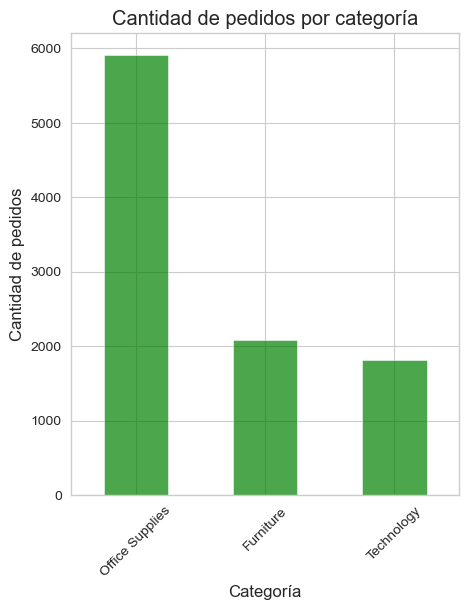

In [325]:
# Contar la cantidad de pedidos por categoría
category_counts = df_sales["Category"].value_counts()

# Graficar correctamente con un gráfico de barras
plt.figure(figsize=(5, 6))
category_counts.plot(kind="bar", color="g", alpha=0.7)
plt.title("Cantidad de pedidos por categoría")
plt.ylabel("Cantidad de pedidos")
plt.xlabel("Categoría")
plt.xticks(rotation=45)
plt.show()

En el histograma vemos que el conjunto de observaciones hay un desbalanceo en cada categoría, ya que la cantidad de pedidos emitidos son mayores en la parte de office Supplies

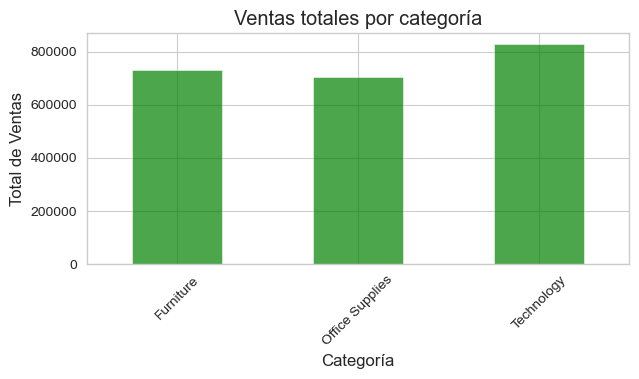

In [326]:
# Agrupar y sumar las ventas por categoría
category_sales = df_sales.groupby("Category")["Sales"].sum()

# Graficar correctamente con un gráfico de barras
plt.figure(figsize=(7, 3))
category_sales.plot(kind="bar", color="g", alpha=0.7)
plt.title("Ventas totales por categoría")
plt.ylabel("Total de Ventas")
plt.xlabel("Categoría")
plt.xticks(rotation=45)
plt.show()

Vemos que en términos de facturación sería la categoría de tecnología la más importante, posteriormente Furniture y luego office supplies. Aunque vemos que en el gráfico anterior el número de operaciones es muy superior la de office Supplies, por lo que se infiere que la categoría de office supplies, vende productos con un un ticket mediode venta inferior que el resto de categorías.

#### __Visualizar la columna principal (o columnas) en un gráfico de líneas.__

In [327]:
df_sales["Order Date"] = pd.to_datetime(df_sales["Order Date"], format = "%d/%m/%Y")
df_sales["Ship Date"] = pd.to_datetime(df_sales["Ship Date"], format = "%d/%m/%Y")

df_sales['pedido_d'] = df_sales['Order Date'].dt.to_period('D')

df_sales['pedido_m'] = df_sales['Order Date'].dt.to_period('M')

df_sales['pedido_y'] = df_sales['Order Date'].dt.to_period('Y')

Cambiamos el formato a varias variables y creamos 3 de pedidos diarios, pedidos mensuales y pedidos en el año. Para realizar un graficado por días, meses y años y veremos la mejor forma de visualizar los datos.

In [328]:
print(df_sales.columns)  # Verifica las columnas disponibles
print(df_sales[["pedido_m", "Category", "Sales"]].head())  # Muestra las primeras filas
print(df_sales.dtypes)  # Verifica los tipos de datos

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'pedido_d', 'pedido_m', 'pedido_y'],
      dtype='object')
  pedido_m         Category     Sales
0  2017-11        Furniture  261.9600
1  2017-11        Furniture  731.9400
2  2017-06  Office Supplies   14.6200
3  2016-10        Furniture  957.5775
4  2016-10  Office Supplies   22.3680
Row ID                    int64
Order ID                 object
Order Date       datetime64[ns]
Ship Date        datetime64[ns]
Ship Mode                object
Customer ID              object
Customer Name            object
Segment                  object
Country                  object
City                     object
State                    object
Postal Code             float64
Region                   object
Product ID               object
Category    

<Figure size 1000x500 with 0 Axes>

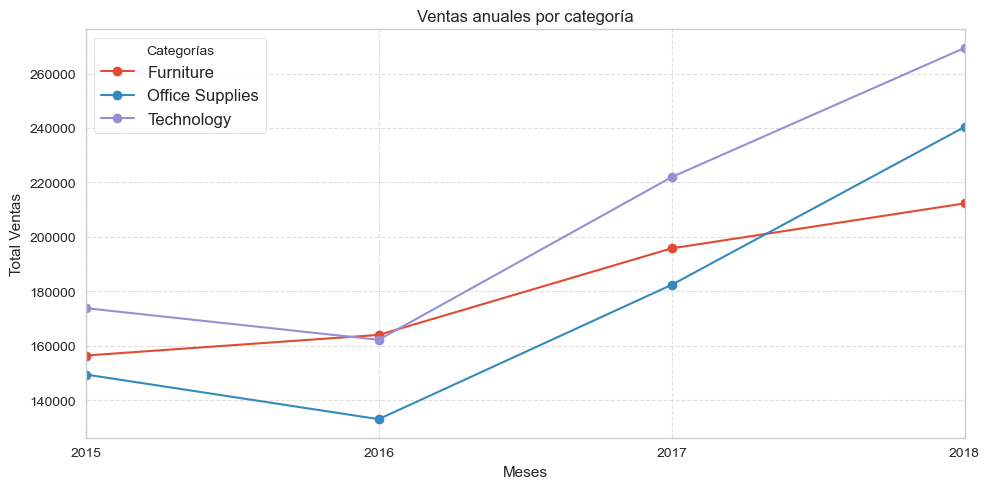

In [329]:
ventasanuales = df_sales.groupby(["pedido_y", "Category"])["Sales"].sum().unstack()

plt.figure(figsize=(10, 5))
ventasanuales.plot(kind="line", marker="o", figsize=(10, 5))
plt.title("Ventas anuales por categoría", fontsize=12)
plt.xlabel("Meses", fontsize=11)
plt.ylabel("Total Ventas", fontsize=11)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Categorías", fontsize=12)
plt.tight_layout()
plt.show()

Si representamos las curvas anuales, vemos para la categoría de tecnología y office supplies, una ligera caída en el año 2016 y posteriormente una evolución muy positiva tanto para el año 2017 y 2018.

En cambio para la categoría Furniture, ha tenido un crecimiento positivo cada año.

In [330]:
ventasanuales = df_sales.groupby(["pedido_y", "Category"])["Sales"].sum().unstack()
print(ventasanuales)

Category    Furniture  Office Supplies  Technology
pedido_y                                          
2015      156477.8811       149512.820  173865.507
2016      164053.8674       133124.407  162257.731
2017      195813.0400       182417.566  221961.944
2018      212313.7872       240367.541  269370.691


In [331]:
ventasanuales = df_sales.groupby(["Category", "pedido_y"])["Sales"].sum().unstack()
print(ventasanuales)

pedido_y                2015         2016        2017         2018
Category                                                          
Furniture        156477.8811  164053.8674  195813.040  212313.7872
Office Supplies  149512.8200  133124.4070  182417.566  240367.5410
Technology       173865.5070  162257.7310  221961.944  269370.6910


<Figure size 1000x500 with 0 Axes>

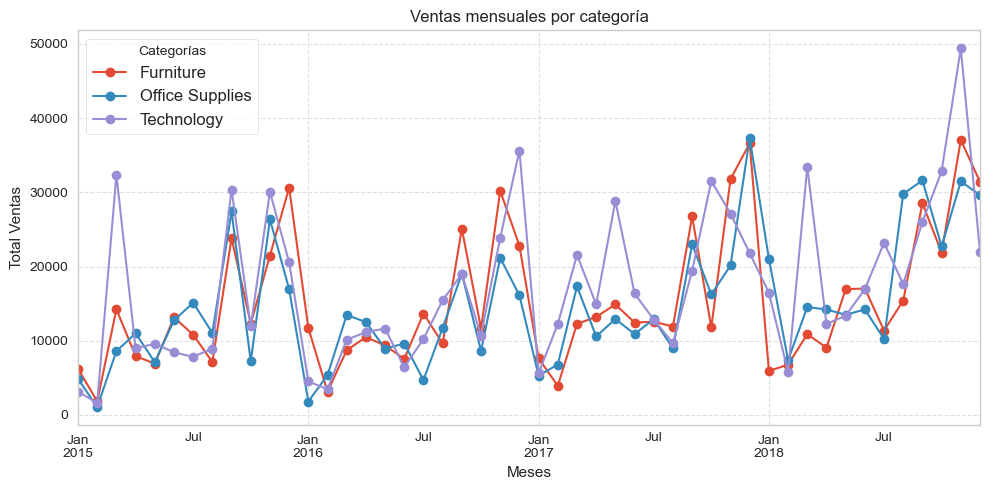

In [332]:
ventasmensuales = df_sales.groupby(["pedido_m", "Category"])["Sales"].sum().unstack()

plt.figure(figsize=(10, 5))
ventasmensuales.plot(kind="line", marker="o", figsize=(10, 5))
plt.title("Ventas mensuales por categoría", fontsize=12)
plt.xlabel("Meses", fontsize=11)
plt.ylabel("Total Ventas", fontsize=11)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Categorías", fontsize=12)
plt.tight_layout()
plt.show()

Observamos claramente tres series temporales:

Para la serie de la categoría __Technology__, vemos que hay determinados picos de venta que se repiten cada año y con una tendencia positiva para el periodo estudiado.

Para la serie de la categoría __Office supplies__, vemos ciclos de venta muy pronunciados y una caída en el año 2016 con una recuperación en el año 2017.

Para la serie de la categoría __Furniture__, vemos una tendencia positiva en toda la serie temporal, vemos al igual que para el resto de categoría una componente de ciclo.

Se ve claramente una correlación muy clara entre las tres series temporales.

__Debemos realizar un estudio de correlación por meses y una descomposición de la serie temporal.__

__Estudio de correlación en la serie temporal por categoría y la variable de ventas.__

In [333]:
# Agrupar ventas por mes y categoría
ventas_por_categoria = df_sales.groupby(["pedido_m", "Category"])["Sales"].sum().unstack()

# Calcular la matriz de correlación
correlacion_categorias = ventas_por_categoria.corr()

# Mostrar la matriz de correlación
print(correlacion_categorias)

Category         Furniture  Office Supplies  Technology
Category                                               
Furniture         1.000000         0.796641    0.673879
Office Supplies   0.796641         1.000000    0.657323
Technology        0.673879         0.657323    1.000000


Se observa en la matriz de correlaciones que la categoría de Furniture y Office Supplies tienen una correlación fuerte, ya que por encima del 0,75 así se considera.

Por otro lado la correlación entre Technology y Office supplies es de 0,65, es una correlación positiva y moderada, correlaciones por encima de 0,5 y 0,75.

La última correlación por analizar sería Technology y Furniture es de 0,67, es una correlación positiva y moderada.

En general podemos decir que las correlaciones son moderadas y fuertes entre las distintas categorías para las series temporales estudiadas. De fondo podría haber un calendario comercial que habría que estudiar, ya que las campañas de marketing y los flujos de compra en el mundo del retail afectan a la hora de realizar las compras y de ahí que veamos esos ciclos tan regulares. Deberemos realizar la descomposición de la serie temporal para ver dichos efectos.

In [334]:
ventasmensuales = df_sales.groupby(["pedido_m", "Category"])["Sales"].sum().unstack()
print(ventasmensuales.head(10))


Category   Furniture  Office Supplies  Technology
pedido_m                                         
2015-01    6217.2770         4845.140    3143.290
2015-02    1839.6580         1071.724    1608.510
2015-03   14243.3680         8602.455   32359.974
2015-04    7944.8370        10988.874    8973.144
2015-05    6912.7870         7131.640    9599.876
2015-06   13144.5816        12742.389    8435.965
2015-07   10821.0510        15121.208    7839.284
2015-08    7125.2105        11055.276    8937.050
2015-09   23816.4808        27423.298   30383.748
2015-10   12304.2470         7211.128   11938.018


Agrupamos las variables de fecha de pedidos realizados por meses y categoría de productos para revisar las ventas mensuales, vemos que hay distintas evoluciones de las ventas mensuales, nos ayuda a entender el ciclo comercial de venta y ciclo de vida de la mercancía.

<Figure size 1000x500 with 0 Axes>

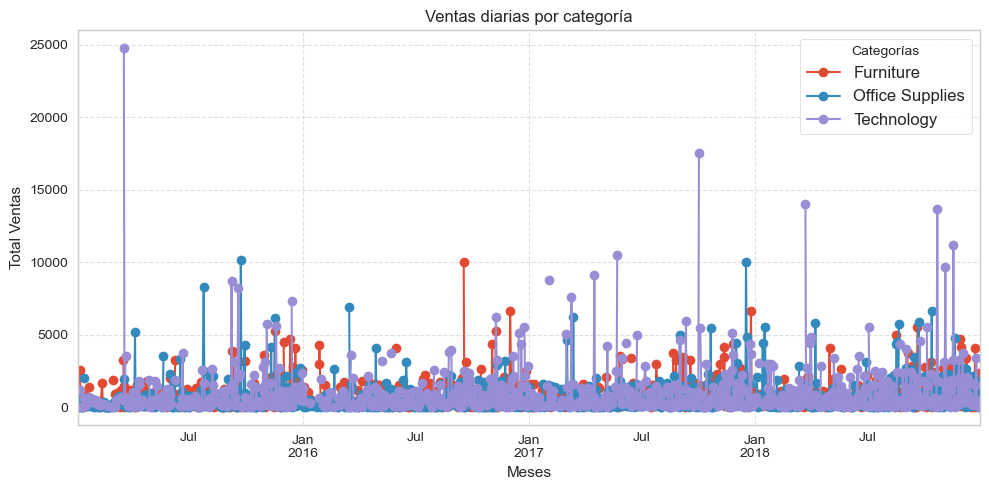

In [335]:
ventasdiarias = df_sales.groupby(["pedido_d", "Category"])["Sales"].sum().unstack()

plt.figure(figsize=(10, 5))
ventasdiarias.plot(kind="line", marker="o", figsize=(10, 5))
plt.title("Ventas diarias por categoría", fontsize=12)
plt.xlabel("Meses", fontsize=11)
plt.ylabel("Total Ventas", fontsize=11)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Categorías", fontsize=12)
plt.tight_layout()
plt.show()

La gráfica diaria no nos da ninguna tendencia y es difícil visualizar una tendencia, pero lo que si podemos observar que tenemos bastantes outliers que tendremos que tratar.

#### __Interpretar si hay tendencia o estacionalidad aparente.__

##### __Resumen de lo analizado:__
__A. Gráfica de ventas anuales.__

En la representación de la gráfica anual de ventas, vemos para la categoría de tecnología y office supplies, una ligera caída en el año 2016 y posteriormente una evolución muy positiva tanto para el año 2017 y 2018. En cambio para la categoría Furniture, ha tenido un crecimiento positivo cada año.

__B. Gráfica de ventas mensuales.__

Para la serie de la categoría Technology, vemos que hay determinados picos de venta que se repiten cada año y con una tendencia positiva para el periodo estudiado.

Para la serie de la categoría Office supplies, vemos ciclos de venta muy pronunciados y una caída en el año 2016 con una recuperación en el año 2017.

Para la serie de la categoría Furniture, vemos una tendencia positiva en toda la serie temporal, vemos al igual que para el resto de categoría una componente de ciclo.

Se ve claramente una correlación muy clara entre las tres series temporales.

__C. Gráfica de ventas diarias.__

La gráfica diaria no nos da ninguna tendencia y es difícil visualizar una tendencia, pero lo que si podemos observar que tenemos bastantes outliers que tendremos que tratar.

Conclusión: Antes de realizar el análisis de descomposición de la serie temporal, vemos que hay ciertos ciclos en la series temporales, se observa una tendencia positiva en las ventas para las diferentes categorías de producto.


__Resampleo diario, semanal y mensual para comparar.__

Después del análisis exploratorio realizado, vamos a realizar un resampleo mensual para realizar la descomposición mensual.

Intentamos realizar un resample por meses para realizar la descomposición de la series temporales.

In [336]:
print(ventasdiarias.index)

PeriodIndex(['2015-01-03', '2015-01-04', '2015-01-05', '2015-01-06',
             '2015-01-07', '2015-01-09', '2015-01-10', '2015-01-11',
             '2015-01-13', '2015-01-14',
             ...
             '2018-12-21', '2018-12-22', '2018-12-23', '2018-12-24',
             '2018-12-25', '2018-12-26', '2018-12-27', '2018-12-28',
             '2018-12-29', '2018-12-30'],
            dtype='period[D]', name='pedido_d', length=1230)


Nos aseguramos la variable ventasdiarias tiene formato PeriodIndex para realizar el resampleo.

Ajustamos la ventas diarias a través del resampleo de las ventas diarias, por lo que creamos la variables df_ventas_resample_mensual.

In [337]:
# Verificar que el índice es DatetimeIndex (ya lo es, pero sin frecuencia)
print(type(ventasdiarias.index))

# Asignar la frecuencia correcta (diaria)
ventasdiarias = ventasdiarias.asfreq("D")

# Ahora podemos hacer el resample a mensual sin errores
df_ventas_resample_mensual = ventasdiarias.resample("M").sum()
df_ventas_resample_mensual.dropna(inplace=True)

# Verificar que ahora tiene frecuencia asignada
print(df_ventas_resample_mensual.index.freq)  # Debe mostrar "M"

<class 'pandas.core.indexes.period.PeriodIndex'>
<MonthEnd>


In [338]:

# Ahora sí se puede hacer el resampleo sin problemas
df_ventas_resample_semanal = ventasdiarias.resample("W").sum()

print(df_ventas_resample_semanal.head())  # Verifica que los datos estén correctos


Category               Furniture  Office Supplies  Technology
pedido_d                                                     
2014-12-29/2015-01-04      0.000          304.508        0.00
2015-01-05/2015-01-11   2712.428          727.540     1179.14
2015-01-12/2015-01-18   1069.003         2140.640      920.89
2015-01-19/2015-01-25   1594.980          797.634      699.93
2015-01-26/2015-02-01    840.866          874.818      812.23


In [339]:
df_ventas_resample_mensual.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 48 entries, 2015-01 to 2018-12
Freq: M
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Furniture        48 non-null     float64
 1   Office Supplies  48 non-null     float64
 2   Technology       48 non-null     float64
dtypes: float64(3)
memory usage: 1.5 KB


In [340]:
print(df_ventas_resample_mensual)

Category   Furniture  Office Supplies  Technology
pedido_d                                         
2015-01    6217.2770         4845.140    3143.290
2015-02    1839.6580         1071.724    1608.510
2015-03   14243.3680         8602.455   32359.974
2015-04    7944.8370        10988.874    8973.144
2015-05    6912.7870         7131.640    9599.876
2015-06   13144.5816        12742.389    8435.965
2015-07   10821.0510        15121.208    7839.284
2015-08    7125.2105        11055.276    8937.050
2015-09   23816.4808        27423.298   30383.748
2015-10   12304.2470         7211.128   11938.018
2015-11   21471.0407        26363.196   30073.424
2015-12   30637.3425        16956.492   20573.224
2016-01   11739.9416         1808.780    4518.236
2016-02    3134.3740         5368.067    3448.970
2016-03    8722.6374        13472.739   10143.942
2016-04   10475.6985        12517.818   11160.952
2016-05    9374.9505         8941.580   11643.000
2016-06    7540.9710         9623.037    6435.366


Realizamos una exploración mensual de los datos que hemos resampleado

In [341]:
print(df_ventas_resample_mensual.index)  # Verifica el índice
print(df_ventas_resample_mensual.index.freq)  # Verifica la frecuencia

PeriodIndex(['2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06',
             '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12',
             '2016-01', '2016-02', '2016-03', '2016-04', '2016-05', '2016-06',
             '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12',
             '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06',
             '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',
             '2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06',
             '2018-07', '2018-08', '2018-09', '2018-10', '2018-11', '2018-12'],
            dtype='period[M]', name='pedido_d')
<MonthEnd>


##### __Aplicar descomposición estacional y comentar los hallazgos.__

Realizamos la descomposición de la serie temporal para cada categoría estudiada.

__Descomposición de la serie temporal para la categoría Furniture.__

In [342]:
print(type(df_ventas_resample_semanal.index))
print(df_ventas_resample_semanal.index[:5])  # Muestra las primeras fechas
if isinstance(df_ventas_resample_semanal.index, pd.PeriodIndex):
    df_ventas_resample_semanal.index = df_ventas_resample_semanal.index.to_timestamp()
df_ventas_resample_semanal.index = pd.to_datetime(df_ventas_resample_semanal.index)

<class 'pandas.core.indexes.period.PeriodIndex'>
PeriodIndex(['2014-12-29/2015-01-04', '2015-01-05/2015-01-11',
             '2015-01-12/2015-01-18', '2015-01-19/2015-01-25',
             '2015-01-26/2015-02-01'],
            dtype='period[W-SUN]', name='pedido_d')


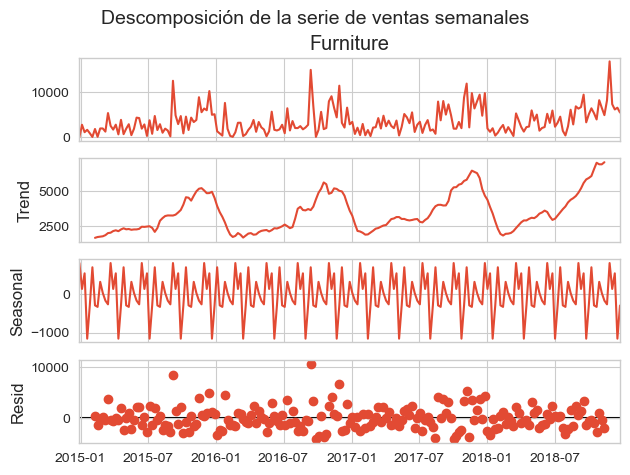

In [343]:
decomposition_ventas = sm.tsa.seasonal_decompose(
    df_ventas_resample_semanal["Furniture"], 
    model="additive", 
    period=12  # Asegúrate de que el periodo sea correcto para datos mensuales
)

# Graficar
decomposition_ventas.plot()
plt.tight_layout()  
plt.subplots_adjust(top=0.88)  
plt.suptitle("Descomposición de la serie de ventas semanales", fontsize=14)
plt.show()

A la hora de interpretar la descomposición de la serie temporal de furniture, vemos en el primer gráfico una evolución clara de la serie temporal dentro del ciclo de retail.

Dentro del mundo retail normalmente se descompone en dos tipos de campañas (PV y OI), por lo que vemos claramente dichas compomentes en el gráfico con ciertos picos en los periodos de rebajas tanto de PV como de OI. Además se ven ciertos picos en ciertos puntos de la serie temporal que sugiere picos en ciertas promociones como las rebajas y en el Black Friday justo a finales de noviembre.

En el segundo gráfico de "Trend" vemos una tendencia positiva dentro de los ciclos de retail anteriormente expuestos.

Vemos que tenemos un patrón en la gráfica de "seasonal" y vemos que hay una estacionalidad clara.

En la parte de residuos vemos que están dichos puntos sin un patrón claro y cercanos a cero.

##### __Intentamos realizar una descomposición multiplicativa para la serie temporal de la categoría de Furniture__ #####

In [344]:
try:
    decomposition_ventas = sm.tsa.seasonal_decompose(df_ventas_resample_semanal["Furniture"], model="multiplicative", period=12)
    decomposition_ventas.plot()
    plt.suptitle("Descomposición de la serie de ventas semanales")
    plt.subplots_adjust(top=0.88)  
    plt.show()
except ValueError as e:
    print("Error en la descomposición:", e)

Error en la descomposición: Multiplicative seasonality is not appropriate for zero and negative values


Intentamos realizar un modelo multiplicativo pero no tiene sentido para valores negativos, en este caso si quisiéramos forzar tendríamos que pasar a escala logarítmica de la serie temporal y sumar una constante. No obstante, como es una serie de retail, vamos a optar para el resto de series siempre utilizar un modelo aditivo.

__Descomposición de la serie temporal para la categoría Office Supplies.__

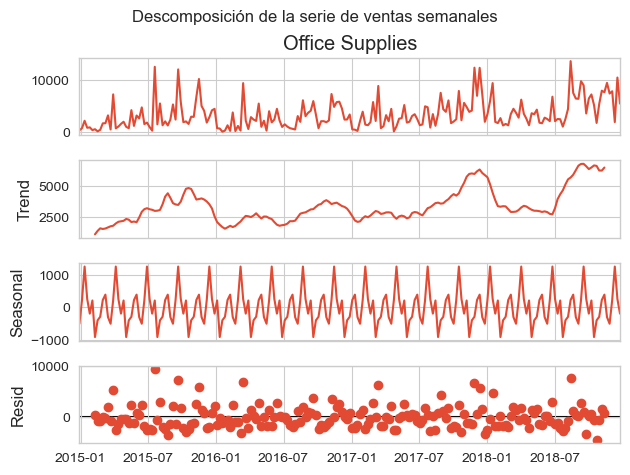

In [345]:
try:
    decomposition_ventas = sm.tsa.seasonal_decompose(df_ventas_resample_semanal["Office Supplies"], model="additive", period=12)
    decomposition_ventas.plot()
    plt.subplots_adjust(top=0.88)  
    plt.suptitle("Descomposición de la serie de ventas semanales")
    plt.show()
except ValueError as e:
    print("Error en la descomposición:", e)

En la serie temporal de Office Supplies vemos que tiene bastantes más picos que la serie temporal de Furniture, vemos que el ciclo de retail es parecido, ya que vemos picos significativos en los periodos de rebajas tanto de PV como de OI. Se ven ciertos picos en los arranques de las campañas de OI que suelen ser en septiembre, vemos que está influenciado por la vuelta de vacaciones de verano y vemos que a hay picos de venta y de pedidos en dichos momentos del año.

La tendencia que observamos es positiva.

Vemos que la hay estacionalidad en los datos en los patrones que vemos de las gráficas.

En los residuos no vemos ningún patrón claro y se puede observar que están cercanos a cero.

__Descomposición de la serie temporal para la categoría Technology.__

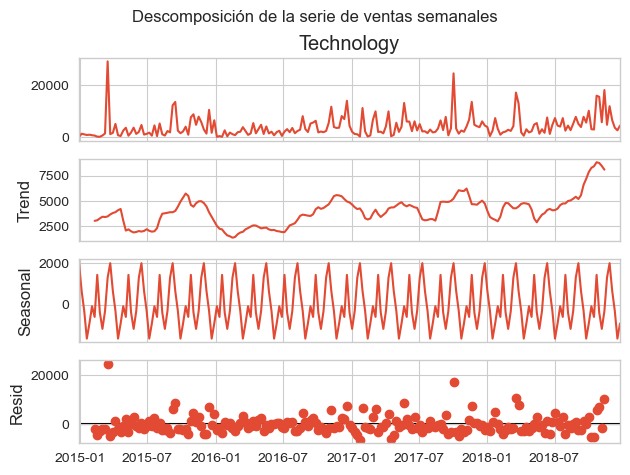

In [346]:
try:
    decomposition_ventas = sm.tsa.seasonal_decompose(df_ventas_resample_semanal["Technology"], model="additive", period=12)
    decomposition_ventas.plot()
    plt.subplots_adjust(top=0.88)  
    plt.suptitle("Descomposición de la serie de ventas semanales")
    plt.show()
except ValueError as e:
    print("Error en la descomposición:", e)


__Exploramos el Dataframe final df_sales, con todas las variables modificadas para aplicar todas los algoritmos.__

En la serie temporal observamos que para la serie temporal de la categoría de Technology, vemos que las ventas que tenemos son bastante lineales durante todo el ciclo de ventas, con picos significativos en los lanzamimientos de ciertos productos de tecnología, dificiles a la hora de realizar una previsión de venta. Vemos que tienen una tendencia positiva dentro de la serie, aunque vemos ciertas caídas durante 2016.

La tendencia en medio y largo plazo es positiva.

Se ven en el gráfico de seasonal el patrón claro de que tenemos una cierta estacionalidad.

Los residuos están todos a un nivel de cero y no vemos ningún patrón signitivo, unícamente vemos valores atípicos en los momentos de lanzamientos de productos de technología.

In [347]:
print(df_sales.info())  # Ahora "timestamp" debería ser el índice

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9800 entries, 0 to 9799
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9800 non-null   int64         
 1   Order ID       9800 non-null   object        
 2   Order Date     9800 non-null   datetime64[ns]
 3   Ship Date      9800 non-null   datetime64[ns]
 4   Ship Mode      9800 non-null   object        
 5   Customer ID    9800 non-null   object        
 6   Customer Name  9800 non-null   object        
 7   Segment        9800 non-null   object        
 8   Country        9800 non-null   object        
 9   City           9800 non-null   object        
 10  State          9800 non-null   object        
 11  Postal Code    9789 non-null   float64       
 12  Region         9800 non-null   object        
 13  Product ID     9800 non-null   object        
 14  Category       9800 non-null   object        
 15  Sub-Category   9800 n

##### __Media móvil con diferentes ventanas (7, 14, 30).__ #####

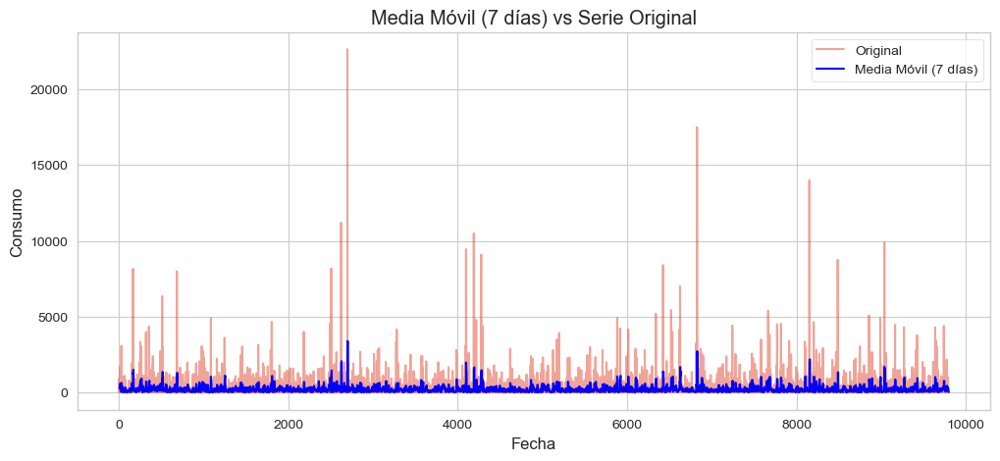

In [348]:
df_sales['MA_7'] = df_sales['Sales'].rolling(window=7).mean()  # media móvil de 7 días

plt.figure(figsize=(12, 5))
plt.plot(df_sales['Sales'].index, df_sales['Sales'], label='Original', alpha=0.5)
plt.plot(df_sales.index, df_sales['MA_7'], label='Media Móvil (7 días)', color='blue')
plt.title('Media Móvil (7 días) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()


En la gráfica de ventas diarias, vemos que es difícil extraer una conclusión, porque en la venta diaria es difícil de graficar y a la hora de aplicar una media móvil de 7 días, vemos que no nos ajustamosa los picos de venta en el suavizado que hace en un día determinado. Por lo que vamos a optar por utilizar meses o semanas.

Se ha realizado pruebas a meses y a la hora de realizar pruebas de medias móviles con periodos más amplios quedaba el análisis raro por lo que utilizaremos el resampleo del dataframe a nivel semanal.

###### Realizamos media móvil a 7 semanas. ######

###### Media móvil Total Categorías ######

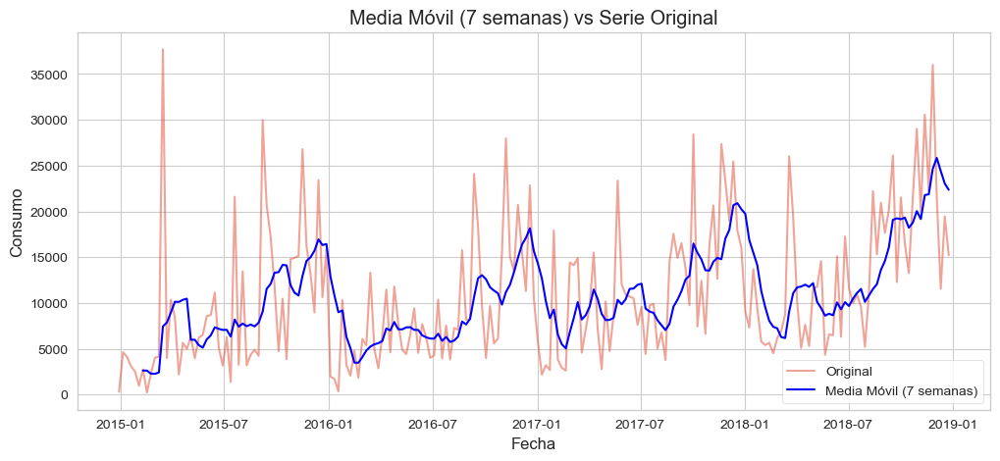

Category,Furniture,Office Supplies,Technology
pedido_d,,,
2015-01,6217.2770,4845.140,3143.290
2015-02,1839.6580,1071.724,1608.510
2015-03,14243.3680,8602.455,32359.974
2015-04,7944.8370,10988.874,8973.144
2015-05,6912.7870,7131.640,9599.876
2015-06,13144.5816,12742.389,8435.965
2015-07,10821.0510,15121.208,7839.284
2015-08,7125.2105,11055.276,8937.050
2015-09,23816.4808,27423.298,30383.748


In [349]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
df_ventas_resample_semanal['MA_7_Total'] = df_ventas_resample_semanal['Total_ventas'].rolling(window=7).mean()  # media móvil de 7 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Total_ventas'].index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_7_Total'], label='Media Móvil (7 semanas)', color='blue')
plt.title('Media Móvil (7 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_mensual

A la hora de realizar la media móvil de todas las categorías, vemos que el suavizado se aproxima bastante bien a la serie original. No se aproxima bien en el arranque de la serie temporal por un valor atípico que veremos en la categoría de Tecnología.

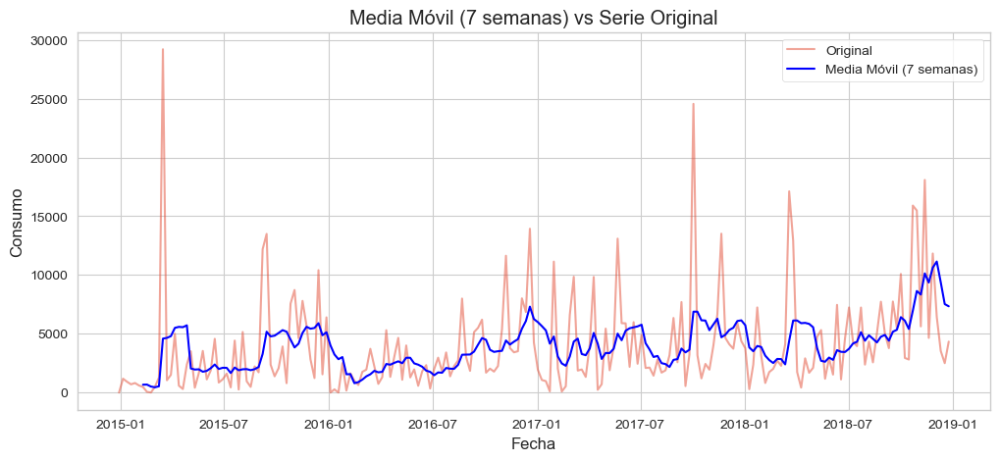

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology
pedido_d,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN
...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571


In [350]:
df_ventas_resample_semanal['MA_7_Technology'] = df_ventas_resample_semanal['Technology'].rolling(window=7).mean()  # media móvil de 7 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Technology'].index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_7_Technology'], label='Media Móvil (7 semanas)', color='blue')
plt.title('Media Móvil (7 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

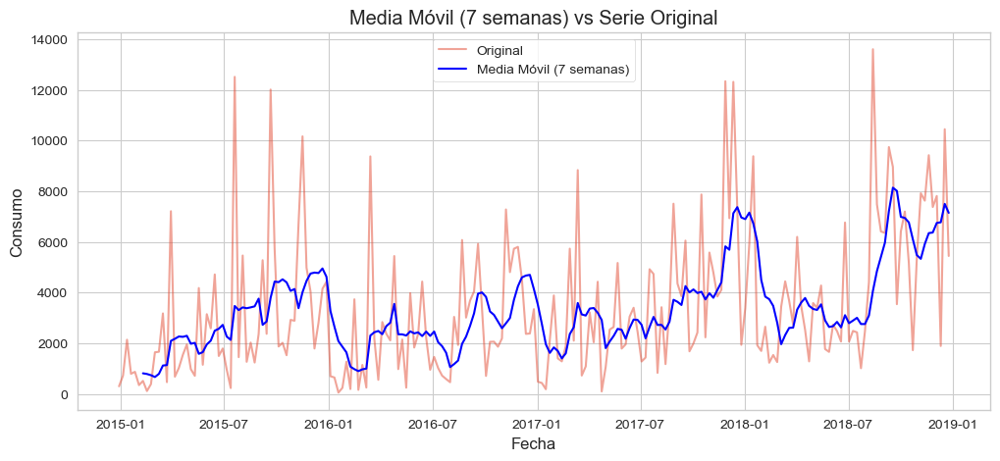

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies
pedido_d,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714


In [351]:
df_ventas_resample_semanal['MA_7_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].rolling(window=7).mean()  # media móvil de 7 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Office Supplies'].index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_7_Office Supplies'], label='Media Móvil (7 semanas)', color='blue')
plt.title('Media Móvil (7 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

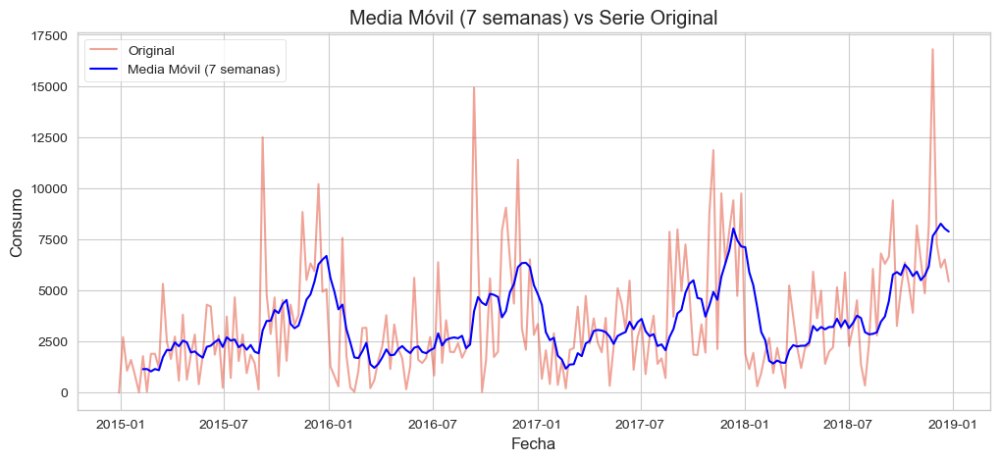

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture
pedido_d,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571


In [352]:
df_ventas_resample_semanal['MA_7_Furniture'] = df_ventas_resample_semanal['Furniture'].rolling(window=7).mean()  # media móvil de 7 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Furniture'].index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_7_Furniture'], label='Media Móvil (7 semanas)', color='blue')
plt.title('Media Móvil (7 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

Resumen de los gráficos de series temporales para una media móvil de 7 semanas, vemos que el suavizado en general se ajusta bastante bien en todas las series, salvo en los casos de valores atípicos donde vemos que el suavizado no funciona también.

En la serie temporal de Technología vemos en los picos que el suavizado no funciona tan bien, aunque en la fase de venta valle, se ajusta muy bien. En Furniture y Office Supplies se observa que se ajusta bien al ciclo de retail, aunque cuando se produce ese valor atípico de contexto de ciclo de retail en periodos promocionales, vemos que no ajusta tan bien el suavizado.

Realizamos un análisis de media móvil de 14 semanas.

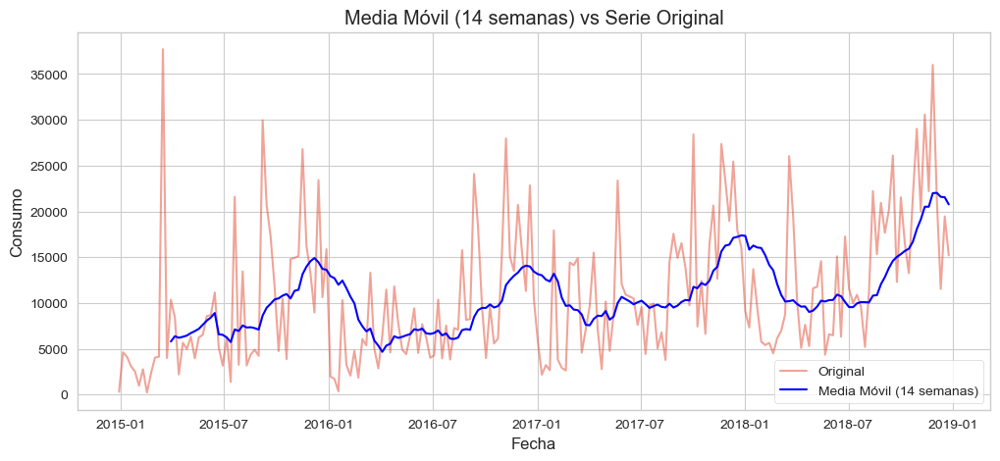

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total
pedido_d,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371


In [353]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
#df_ventas_resample_mensual['Total_ventas']=df_ventas_resample_mensual.sum(axis=1) Si quiero sumar todas las columnas
df_ventas_resample_semanal['MA_14_Total'] = df_ventas_resample_semanal['Total_ventas'].rolling(window=14).mean()  # media móvil de 14 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Total_ventas'].index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_14_Total'], label='Media Móvil (14 semanas)', color='blue')
plt.title('Media Móvil (14 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

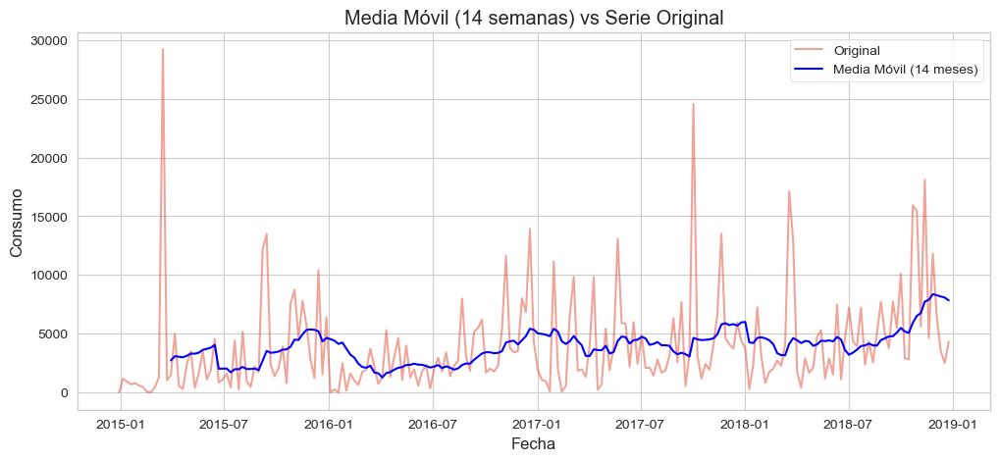

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology
pedido_d,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786


In [354]:
df_ventas_resample_semanal['MA_14_Technology'] = df_ventas_resample_semanal['Technology'].rolling(window=14).mean()  # media móvil de 14 semanal

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Technology'].index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_14_Technology'], label='Media Móvil (14 meses)', color='blue')
plt.title('Media Móvil (14 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

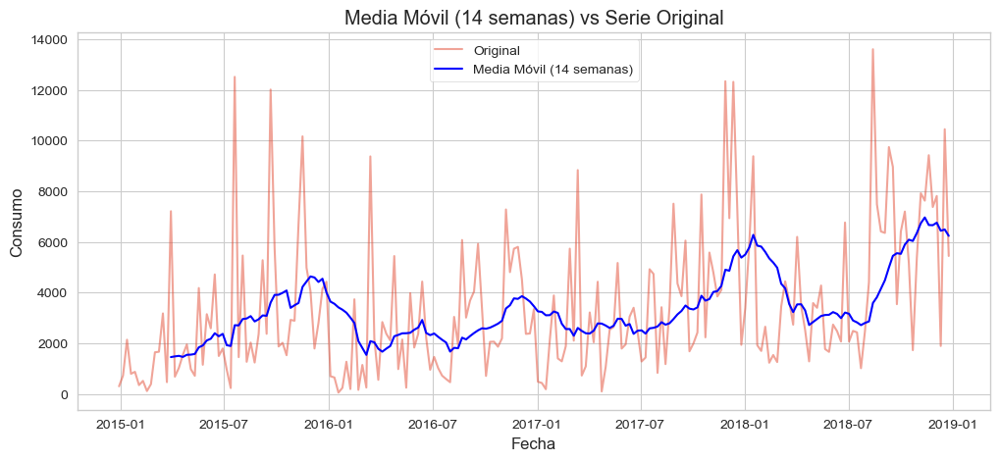

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies
pedido_d,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000


In [355]:
df_ventas_resample_semanal['MA_14_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].rolling(window=14).mean()  # media móvil de 14 semanas
plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Office Supplies'].index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_14_Office Supplies'], label='Media Móvil (14 semanas)', color='blue')
plt.title('Media Móvil (14 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

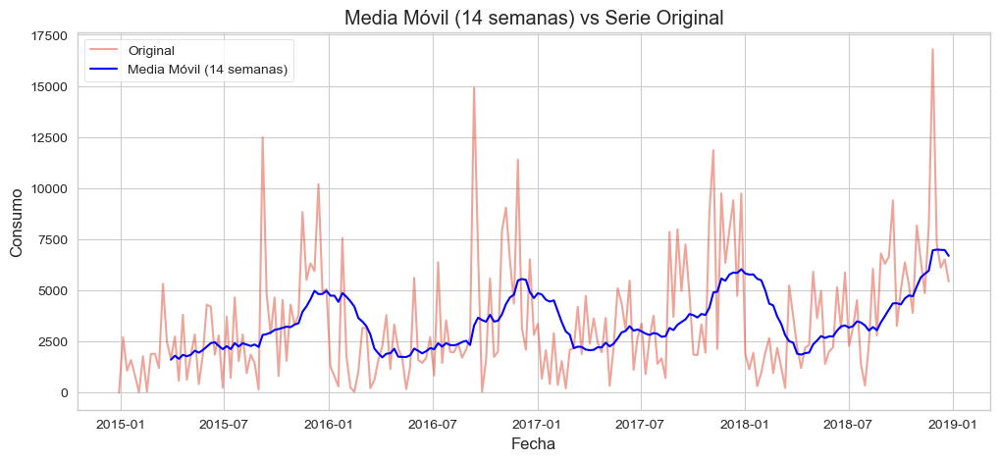

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture
pedido_d,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586


In [356]:
df_ventas_resample_semanal['MA_14_Furniture'] = df_ventas_resample_semanal['Furniture'].rolling(window=14).mean()  # media móvil de 14 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Furniture'].index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_14_Furniture'], label='Media Móvil (14 semanas)', color='blue')
plt.title('Media Móvil (14 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

Realizamos una prueba de medias móviles de 30 semanas.

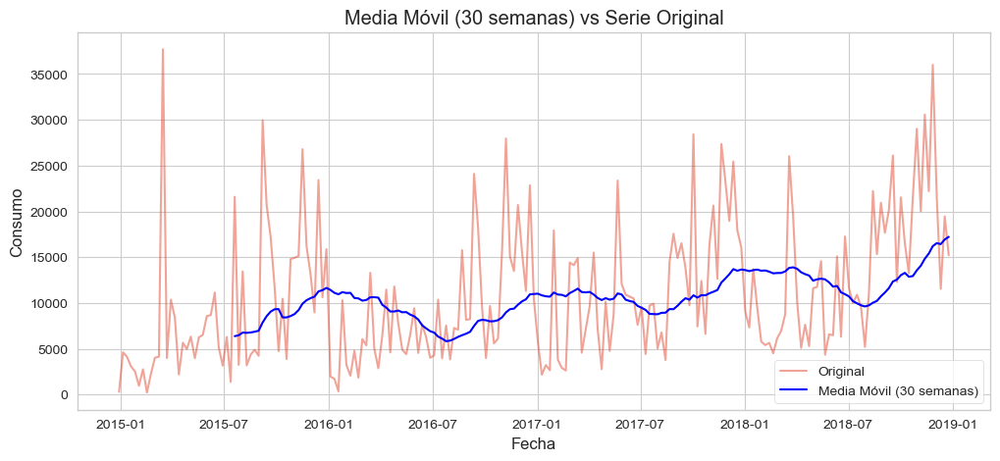

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total
pedido_d,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410


In [357]:
# Sección 3: Media Móvil
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
#df_ventas_resample_mensual['Total_ventas']=df_ventas_resample_mensual.sum(axis=1) Si quiero sumar todas las columnas
df_ventas_resample_semanal['MA_30_Total'] = df_ventas_resample_semanal['Total_ventas'].rolling(window=30).mean()  # media móvil de 30 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Total_ventas'].index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_30_Total'], label='Media Móvil (30 semanas)', color='blue')
plt.title('Media Móvil (30 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

Resumen interpretación de la serie temporal aplicando una media móvil de 14 semanas.

Vemos de manera general que el suavizado es más lineal que en la media movil de 7 semanas, se observa para las tres categoría que hay una ondulación de la sesonality y con una tendencia positiva debido al incremento de ventas en medio plazo. Vemos que el ajuste es algo peor.

Vamos a realizar la prueba ahora con 30 semanas.

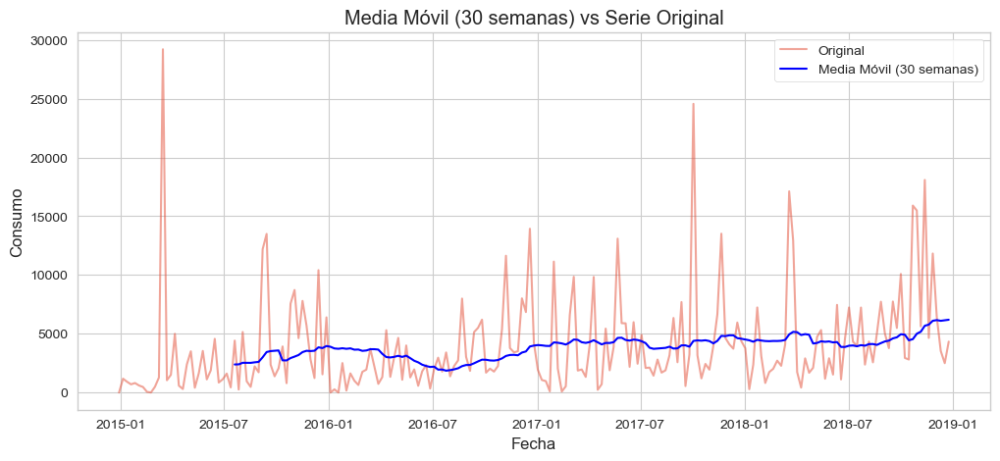

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology
pedido_d,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433


In [358]:
# Sección 3: Media Móvil

df_ventas_resample_semanal['MA_30_Technology'] = df_ventas_resample_semanal['Technology'].rolling(window=30).mean()  # media móvil de 3 semanas.

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Technology'].index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_30_Technology'], label='Media Móvil (30 semanas)', color='blue')
plt.title('Media Móvil (30 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

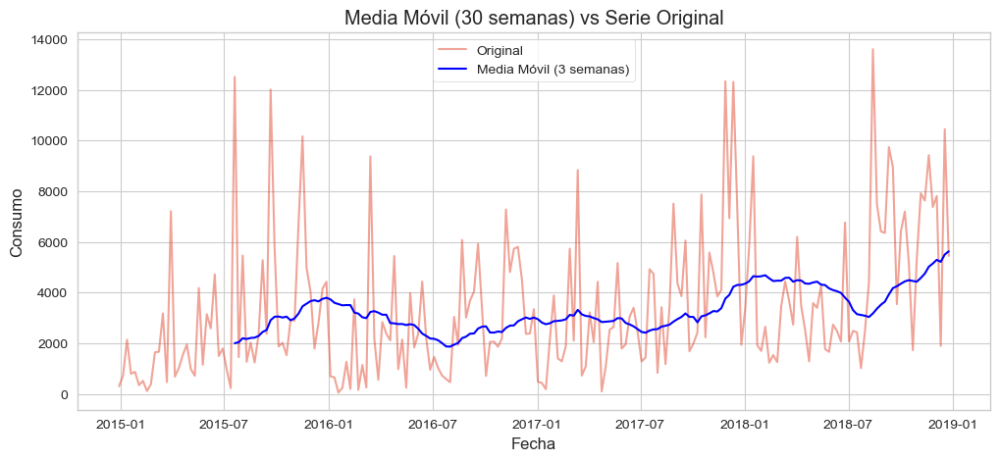

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology,MA_30_Office Supplies
pedido_d,,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433,5146.420833
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767,5293.517533
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433,5214.048500


In [359]:
# Sección 3: Media Móvil

df_ventas_resample_semanal['MA_30_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].rolling(window=30).mean()  # media móvil de 30 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Office Supplies'].index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_30_Office Supplies'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (30 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

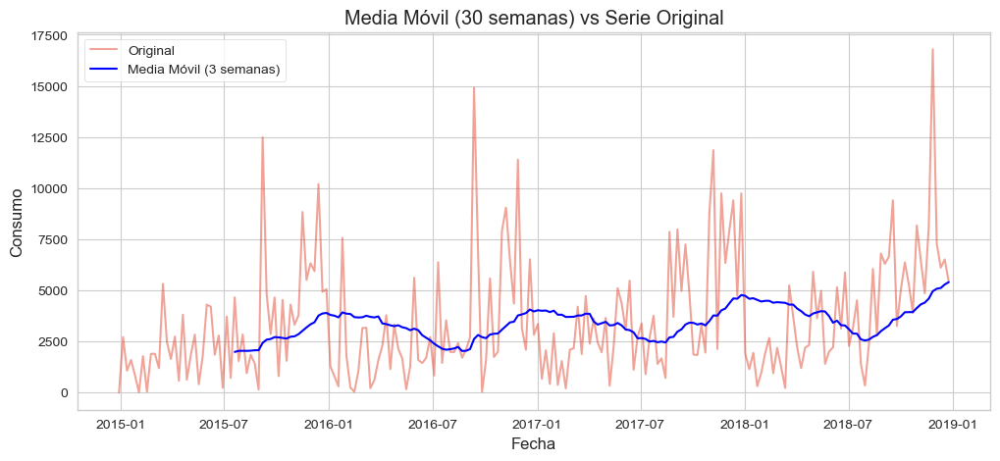

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology,MA_30_Office Supplies,MA_30_Furniture
pedido_d,,,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433,5146.420833,4957.014410
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767,5293.517533,5078.589577
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433,5214.048500,5116.515477


In [360]:
# Sección 3: Media Móvil

df_ventas_resample_semanal['MA_30_Furniture'] = df_ventas_resample_semanal['Furniture'].rolling(window=30).mean()  # media móvil de 3 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Furniture'].index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_30_Furniture'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (30 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

Se puede observar que para una media móvil de 30 semanas que la gráfica es más lineal ajustándose peor a la serie temporal original, para todas las series temporales.

Por lo que optamos por utilizar una media móvil de 3 semanas para analizar si el ajuste es mejor.

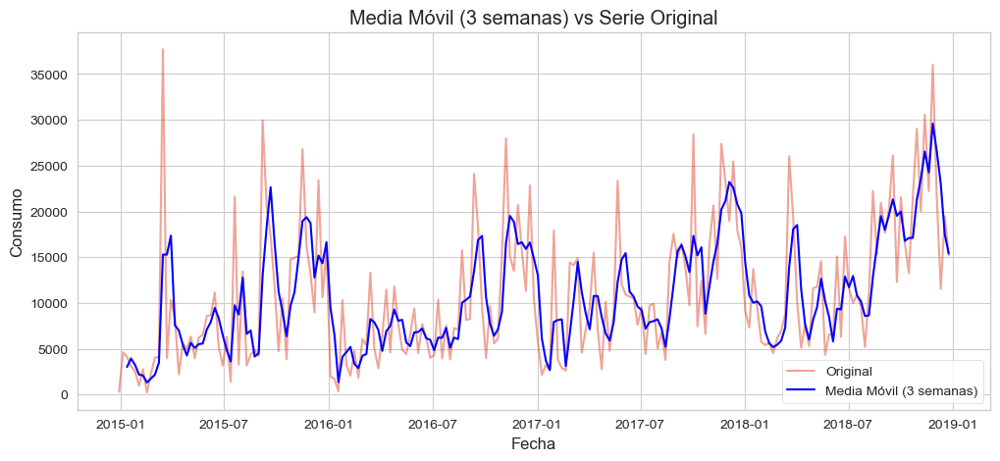

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology,MA_30_Office Supplies,MA_30_Furniture,MA_3_Total
pedido_d,,,,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3018.049667
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3947.395000
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3250.330333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433,5146.420833,4957.014410,29594.705333
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767,5293.517533,5078.589577,26582.970000
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433,5214.048500,5116.515477,23026.325000


In [361]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
df_ventas_resample_semanal['MA_3_Total'] = df_ventas_resample_semanal['Total_ventas'].rolling(window=3).mean()  # media móvil de 3 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Total_ventas'].index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_3_Total'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (3 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

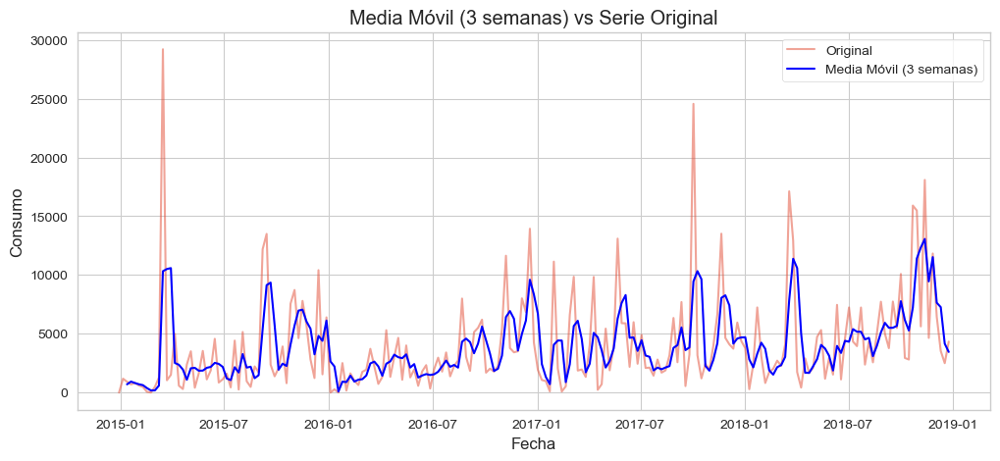

Category,Furniture,Office Supplies,Technology
pedido_d,,,
2015-01,6217.2770,4845.140,3143.290
2015-02,1839.6580,1071.724,1608.510
2015-03,14243.3680,8602.455,32359.974
2015-04,7944.8370,10988.874,8973.144
2015-05,6912.7870,7131.640,9599.876
2015-06,13144.5816,12742.389,8435.965
2015-07,10821.0510,15121.208,7839.284
2015-08,7125.2105,11055.276,8937.050
2015-09,23816.4808,27423.298,30383.748


In [362]:
# Sección 3: Media Móvil

df_ventas_resample_semanal['MA_3_Technology'] = df_ventas_resample_semanal['Technology'].rolling(window=3).mean()  # media móvil de 3 semanas

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Technology'].index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_3_Technology'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (3 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_mensual

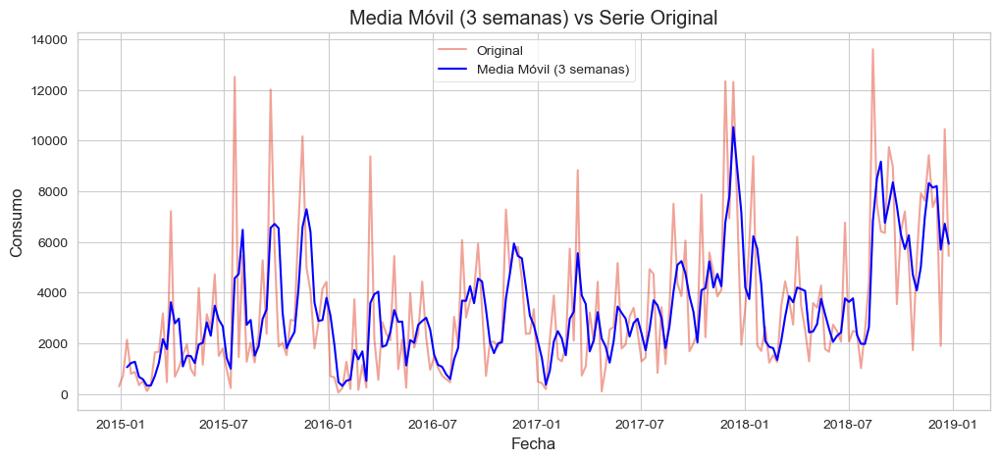

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology,MA_30_Office Supplies,MA_30_Furniture,MA_3_Total,MA_3_Technology,MA_3_Office Supplies
pedido_d,,,,,,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3018.049667,700.010000,1057.562667
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3947.395000,933.320000,1221.938000
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3250.330333,811.016667,1271.030667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433,5146.420833,4957.014410,29594.705333,11522.615000,8142.368000
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767,5293.517533,5078.589577,26582.970000,7639.621333,8203.891000
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433,5214.048500,5116.515477,23026.325000,7268.080667,5695.332667


In [363]:
df_ventas_resample_semanal['MA_3_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].rolling(window=3).mean()  # media móvil de 3 semanas.

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Office Supplies'].index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_3_Office Supplies'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (3 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

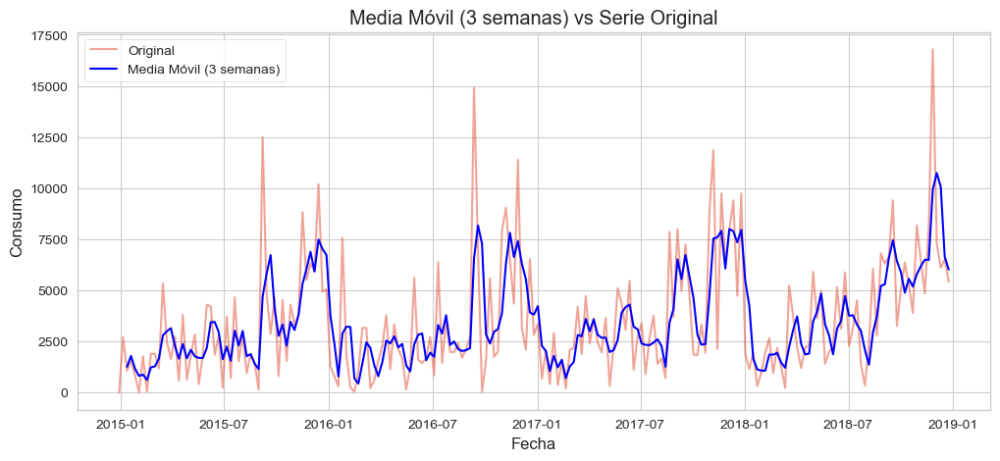

Category,Furniture,Office Supplies,Technology,Total_ventas,MA_7_Total,MA_7_Technology,MA_7_Office Supplies,MA_7_Furniture,MA_14_Total,MA_14_Technology,MA_14_Office Supplies,MA_14_Furniture,MA_30_Total,MA_30_Technology,MA_30_Office Supplies,MA_30_Furniture,MA_3_Total,MA_3_Technology,MA_3_Office Supplies,MA_3_Furniture
pedido_d,,,,,,,,,,,,,,,,,,,,
2014-12-29,0.0000,304.508,0.000,304.5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05,2712.4280,727.540,1179.140,4619.1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-12,1069.0030,2140.640,920.890,4130.5330,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3018.049667,700.010000,1057.562667,1260.477000
2015-01-19,1594.9800,797.634,699.930,3092.5440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3947.395000,933.320000,1221.938000,1792.137000
2015-01-26,840.8660,874.818,812.230,2527.9140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3250.330333,811.016667,1271.030667,1168.283000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-11-26,16791.9320,7377.448,11829.520,35998.9000,24660.460171,10629.375143,6372.417000,7658.668029,21989.571586,8371.517500,6659.456714,6958.597371,16209.486677,6106.051433,5146.420833,4957.014410,29594.705333,11522.615000,8142.368000,9929.722333
2018-12-03,7283.9800,7813.415,6439.846,21537.2410,25841.377714,11147.659857,6749.512429,7944.205429,22031.759371,8279.571357,6759.438500,6992.749514,16534.978877,6162.871767,5293.517533,5078.589577,26582.970000,7639.621333,8203.891000,10739.457667
2018-12-10,6112.8230,1895.135,3534.876,11542.8340,24413.886857,9379.853571,6773.308714,8260.724571,21593.958371,8173.576786,6440.795000,6979.586586,16434.019410,6103.455433,5214.048500,5116.515477,23026.325000,7268.080667,5695.332667,10062.911667


In [364]:
df_ventas_resample_semanal['MA_3_Furniture'] = df_ventas_resample_semanal['Furniture'].rolling(window=3).mean()  

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal['Furniture'].index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['MA_3_Furniture'], label='Media Móvil (3 semanas)', color='blue')
plt.title('Media Móvil (3 semanas) vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

df_ventas_resample_semanal

A la hora de analizar las series temporales con el suavizado de la medias móviles a 3 semanas, vemos que se ajustan más a la serie temporal y sería un modelo más ajustado a los datos reales. Es cierto que a medida que nos acercamos a 1 el ajuste es mayor, ya que nos aproximamos a la serie original. Aunque también apreciamos que a medida que aumentamos las medias móviles tampoco se ajustan a la realidad, por lo que hay que probar y analizar qué se va ajustando mejor a la serie temporal.

##### __Suavizado exponencial con distintos valores de alpha (0.1, 0.3, 0.8).__ #####

Suavizado Exponencial Simple (SES)

Concepto:

Este método se aplica a series temporales que no presentan tendencia ni estacionalidad pronunciada. La idea es generar una estimación (o "nivel") de la serie en cada instante, actualizándola con la observación más reciente.

Fórmula:

𝑆𝑡=𝛼𝑋𝑡+(1−𝛼)𝑆𝑡−1
donde:

St es el valor suavizado en el tiempo 𝑡.

𝑋𝑡 es la observación en el tiempo.

α es el factor de suavizado (entre 0 y 1).

Si α es alto (cercano a 1), el modelo da mayor peso a la observación actual, reaccionando rápidamente a los cambios en la serie.

Si α es bajo (cercano a 0), el modelo es más "suave" y se basa más en la tendencia histórica, haciendo el pronóstico menos sensible a cambios abruptos.

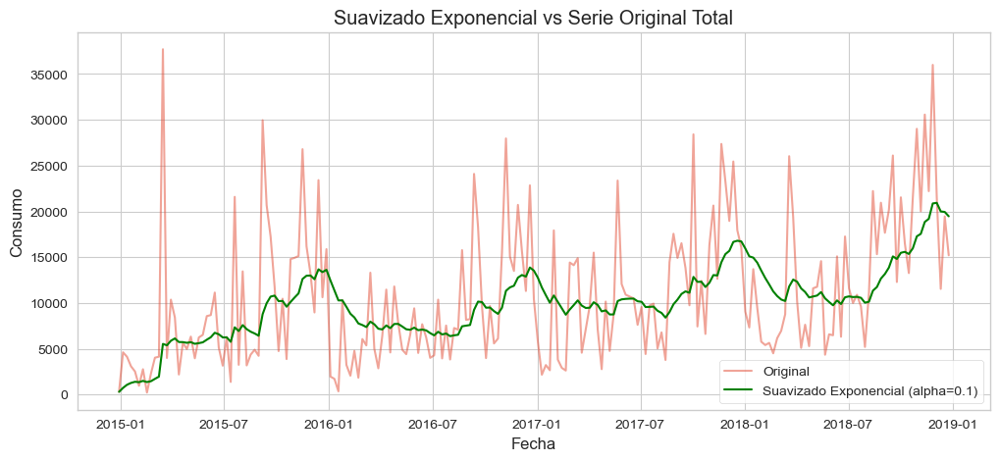

In [365]:

categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)

alpha = 0.1
df_ventas_resample_semanal['EWMA_0.1_Total'] = df_ventas_resample_semanal['Total_ventas'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Total'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Suavizado Exponencial vs Serie Original Total')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

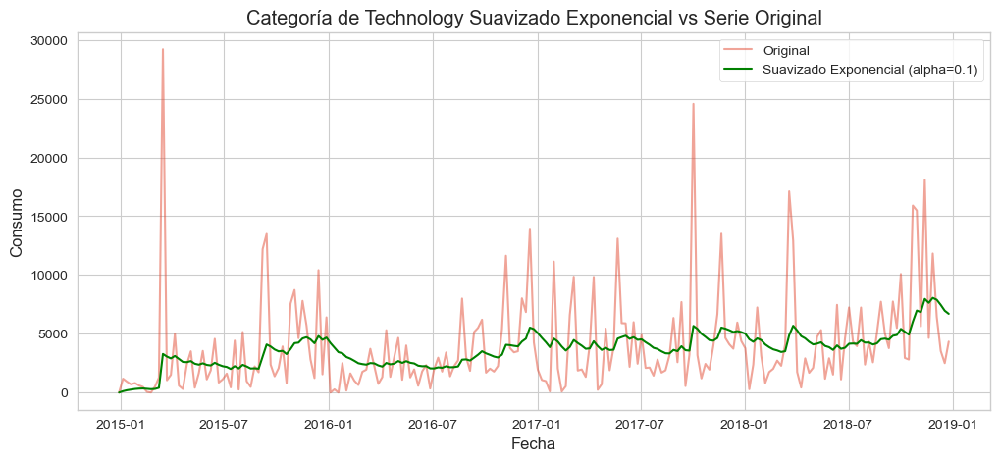

In [366]:
alpha = 0.1
df_ventas_resample_semanal['EWMA_0.1_Technology'] = df_ventas_resample_semanal['Technology'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Technology'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría de Technology Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

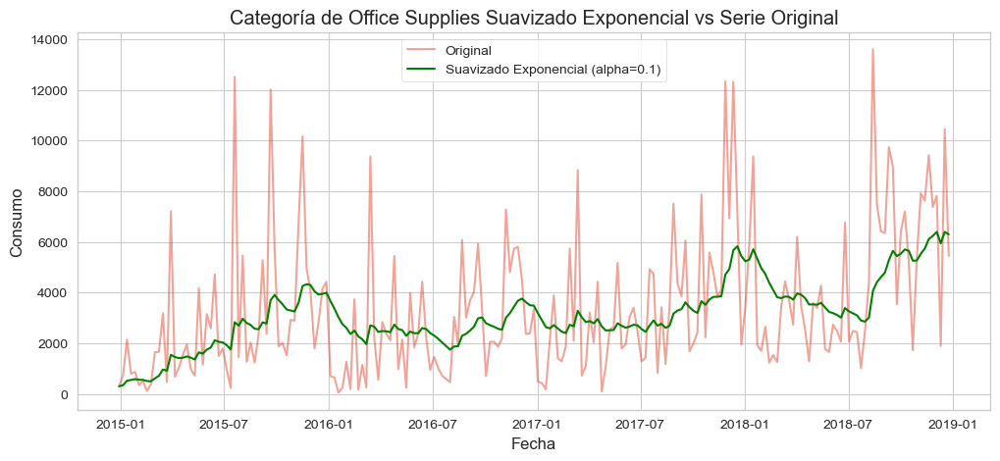

In [367]:
alpha = 0.1
df_ventas_resample_semanal['EWMA_0.1_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Office Supplies'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría de Office Supplies Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

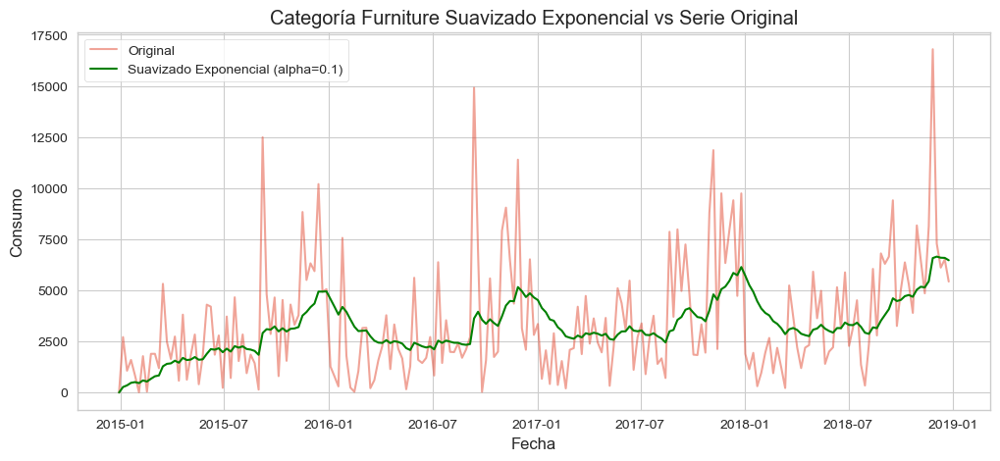

In [368]:
alpha = 0.1
df_ventas_resample_semanal['EWMA_0.1_Furniture'] = df_ventas_resample_semanal['Furniture'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Furniture'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Furniture Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

Para un α=0,1, vemos que se ajusta bastante mal a la serie, ya que no se ajusta a los picos de venta correctamente, vemos que el suavizado queda muy lineal.

Vamos a pasar a probar un suavizado de para un α=0,3.

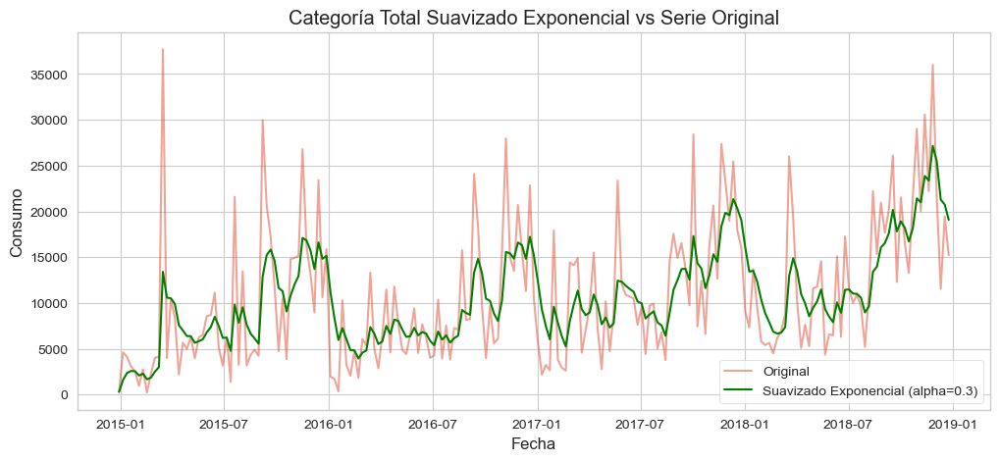

In [369]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
alpha = 0.3
df_ventas_resample_semanal['EWMA_0.3_Total'] = df_ventas_resample_semanal['Total_ventas'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.3_Total'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Total Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

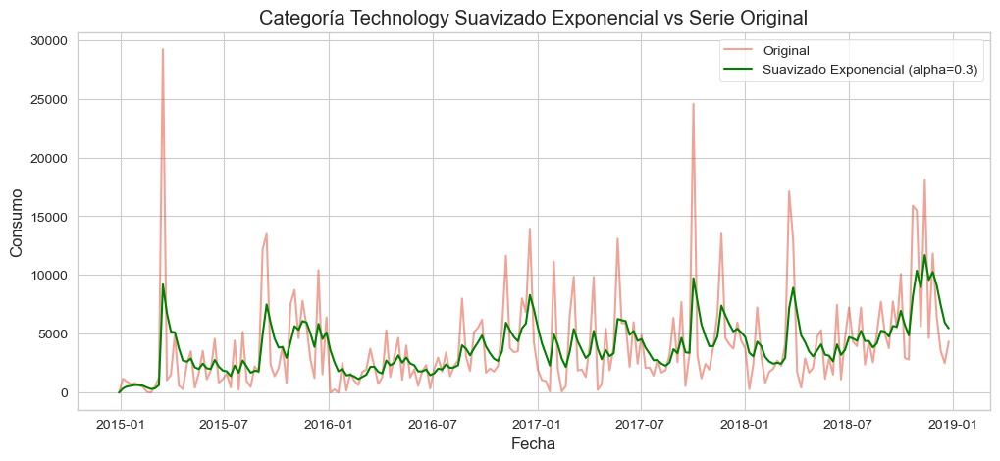

In [370]:
alpha = 0.3
df_ventas_resample_semanal['EWMA_0.1_Technology'] = df_ventas_resample_semanal['Technology'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Technology'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Technology Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

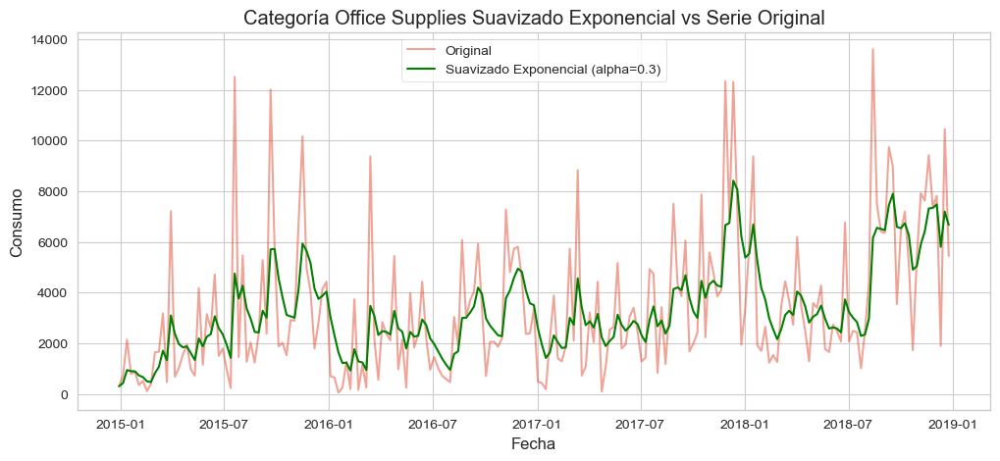

In [371]:
alpha = 0.3
df_ventas_resample_semanal['EWMA_0.1_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Office Supplies'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Office Supplies Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()


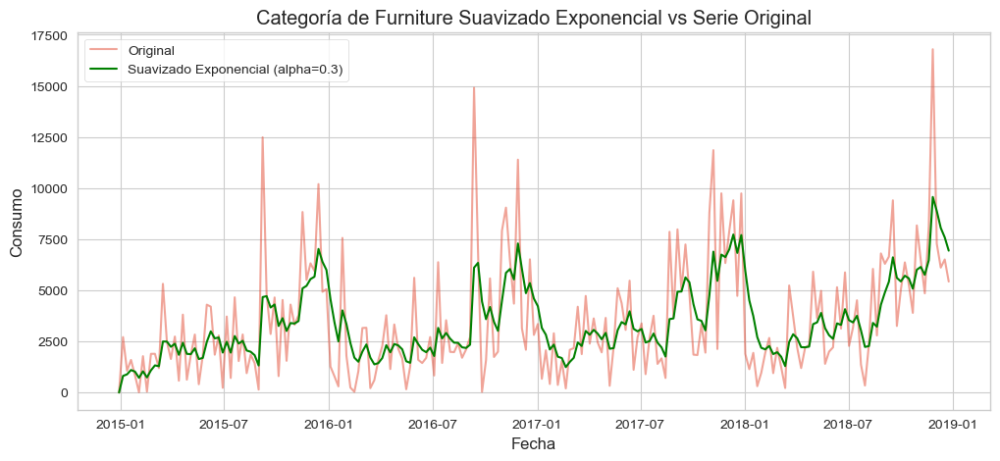

In [372]:
alpha = 0.3
df_ventas_resample_semanal['EWMA_0.1_Furniture'] = df_ventas_resample_semanal['Furniture'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Furniture'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría de Furniture Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

Para las series analizadas vemos que la curva del suavizado exponencial se ajusta mejor a la serie temporal para un alpha=0,3, aunque seguimos viendo que aunque recoge mejor los puntos atípicos y se ajusta mejor, deberíamos probar con un alpha más alto. Aunque este sería ya muy cercano a tener una estimación de venta por dicho método bastante razonable.

Vamos a probar a continuación con un alpha=0,8.

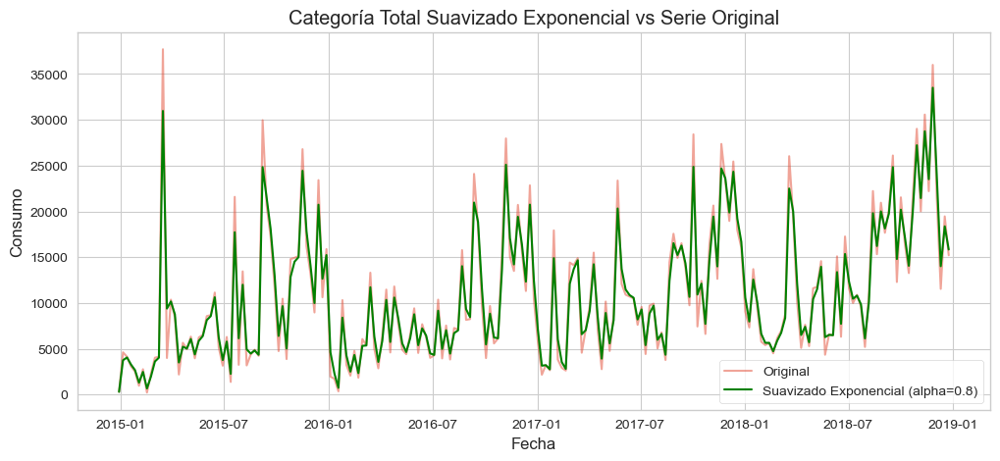

In [373]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)

alpha = 0.8
df_ventas_resample_semanal['EWMA_0.5_Total'] = df_ventas_resample_semanal['Total_ventas'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.5_Total'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Total Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

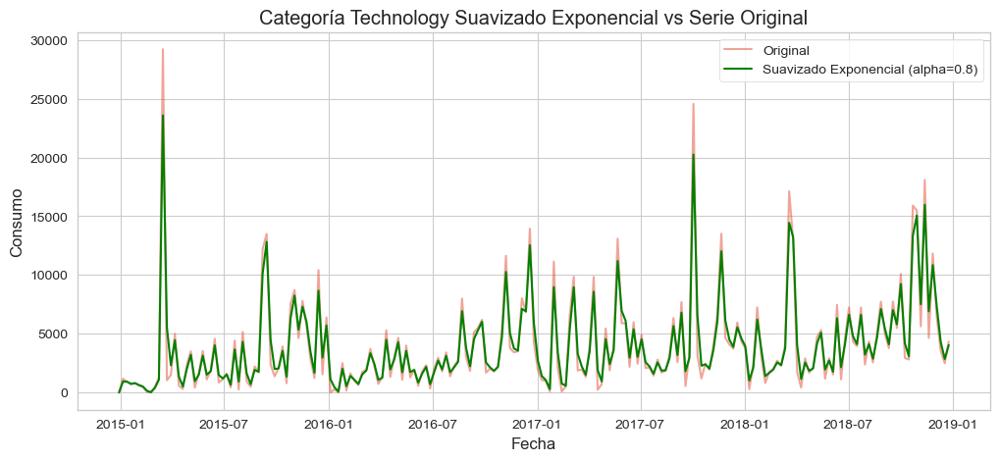

In [374]:
alpha = 0.8
df_ventas_resample_semanal['EWMA_0.1_Technology'] = df_ventas_resample_semanal['Technology'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Technology'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Technology Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

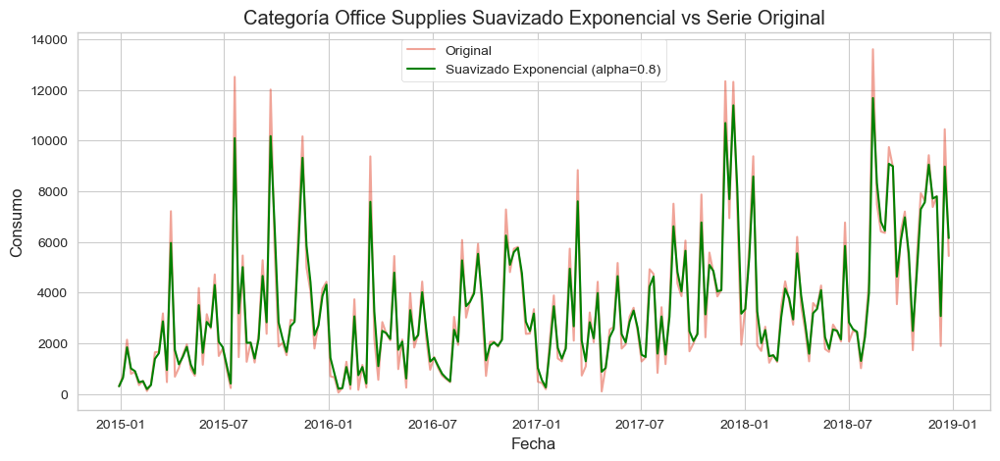

In [375]:
alpha = 0.8
df_ventas_resample_semanal['EWMA_0.1_Office Supplies'] = df_ventas_resample_semanal['Office Supplies'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Office Supplies'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Office Supplies Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

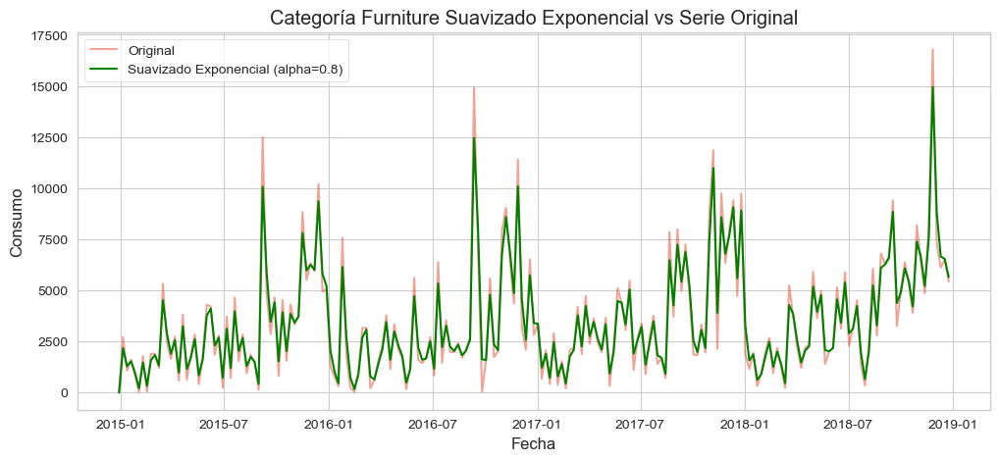

In [376]:
alpha = 0.8
df_ventas_resample_semanal['EWMA_0.1_Furniture'] = df_ventas_resample_semanal['Furniture'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Furniture'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.1_Furniture'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Furniture Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

Para un alpha=0,8 vemos que se sobreajusta mucho a la serie temporal, por lo que deberíamos optar por un alpha menor, ya que a la hora de realizar una estimación el modelo estaría muy ajustado a la serie de datos dando un peso muy importante a los valores más cercanos en el tiempo.

Vamos a realizar una última prueba para ver el ajuste casi perfecto con alpha=0,9 para todas las categorías.

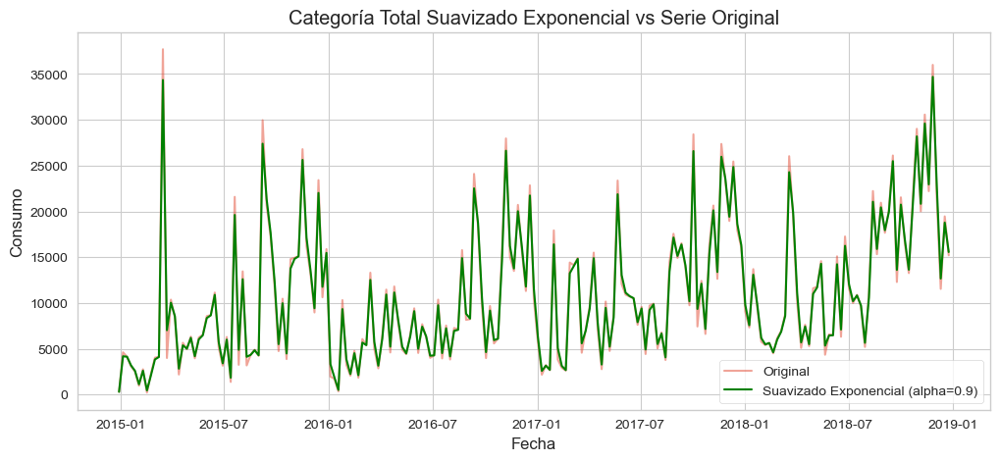

In [377]:
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)

alpha = 0.9
df_ventas_resample_semanal['EWMA_0.5_Total'] = df_ventas_resample_semanal['Total_ventas'].ewm(alpha=alpha, adjust=False).mean()

plt.figure(figsize=(12, 5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], label='Original', alpha=0.5)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['EWMA_0.5_Total'], label=f'Suavizado Exponencial (alpha={alpha})', color='green')
plt.title('Categoría Total Suavizado Exponencial vs Serie Original')
plt.xlabel('Fecha')
plt.ylabel('Consumo')
plt.legend()
plt.show()

__Suavizado método Holt y Holt-Winters__

A la hora de estudiar el suavizado podríamos estudiar el método holt y holt-winters.

__Método Holt__

El método holt se utiliza para modelar la tendencia de la serie. El parámetro smoothing_trend controla el grado en que el valor suavizado de la tendencia se actualiza con cada nueva observación.

In [378]:
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing

categorias_seleccionadas = ['Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)

holt_model = ExponentialSmoothing(
    df_ventas_resample_semanal['Total_ventas'],
    trend='add',         # Modelo con tendencia aditiva
    seasonal=None,       # No modelamos componente estacional
    initialization_method="estimated"
)
holt_fit = holt_model.fit(smoothing_level=0.8, smoothing_trend=0.2)
df_ventas_resample_semanal['Holt_Fit'] = holt_fit.fittedvalues

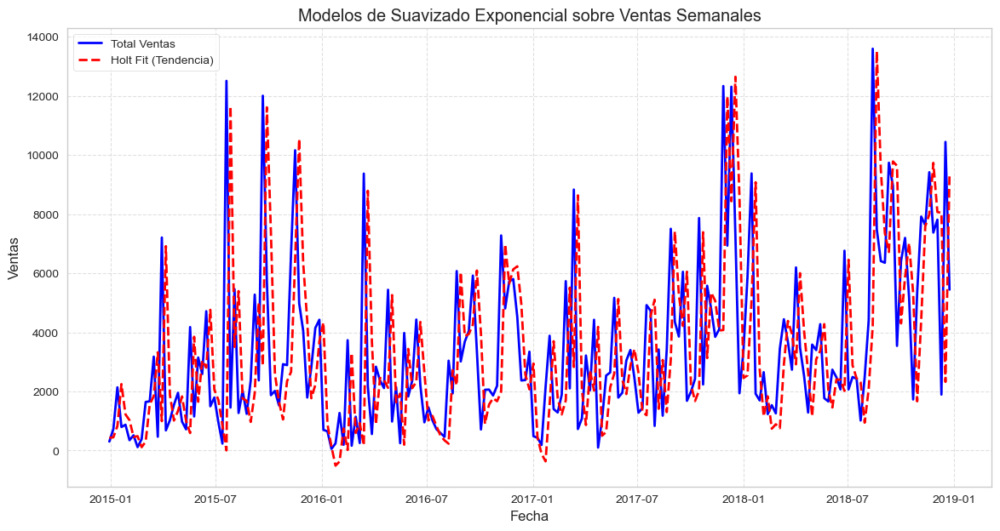

In [379]:
plt.figure(figsize=(14, 7))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], 
         label='Total Ventas', color='blue', linewidth=2)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Holt_Fit'], 
         label='Holt Fit (Tendencia)', color='red', linestyle='--', linewidth=2)
plt.title('Modelos de Suavizado Exponencial sobre Ventas Semanales')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

__Método Holt-Winters__

El método de Holt-Winters se utiliza para modelar tanto la tendencia como la estacionalidad. Aquí se define smoothing_trend para la tendencia y smoothing_seasonal para la componente estacional.

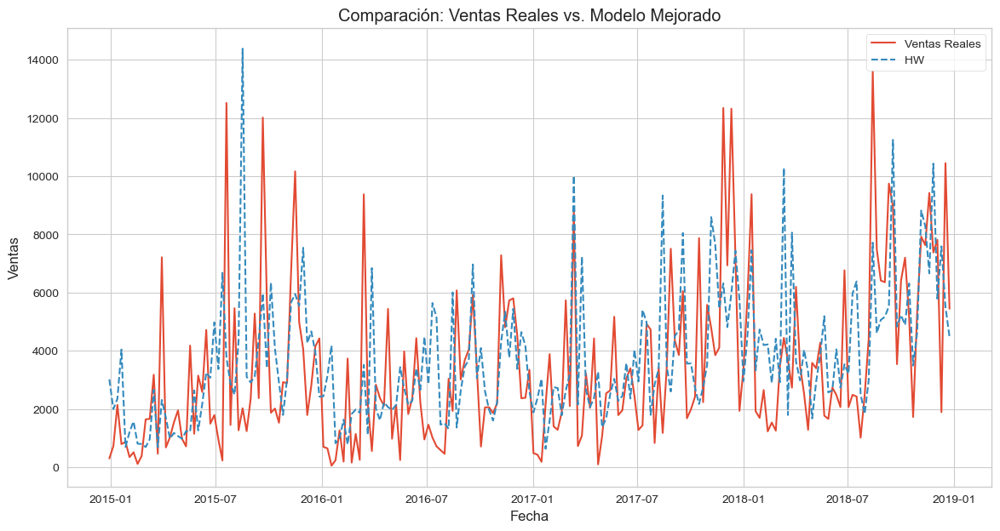

In [380]:
hw_model = ExponentialSmoothing(
    df_ventas_resample_semanal['Office Supplies'],
    trend='mul',
    seasonal='mul',
    seasonal_periods=52,
    damped_trend=True,
    initialization_method="estimated"
)
 
# Ajuste con parámetros optimizados
hw_fit = hw_model.fit(
    smoothing_level=0.2,
    smoothing_trend=0.05,
    smoothing_seasonal=0.15,
    damping_trend=0.98
)
 
# Predicciones y visualización
df_ventas_resample_semanal['HW_Pred'] = hw_fit.fittedvalues.clip(lower=0)
 
# Gráfico comparativo
plt.figure(figsize=(14, 7))
plt.plot(df_ventas_resample_semanal['Office Supplies'], label='Ventas Reales')
plt.plot(df_ventas_resample_semanal['HW_Pred'], label='HW ', ls='--')
plt.title('Comparación: Ventas Reales vs. Modelo Mejorado')
plt.ylabel('Ventas')
plt.xlabel('Fecha')
plt.legend()
plt.grid(True)
plt.show()

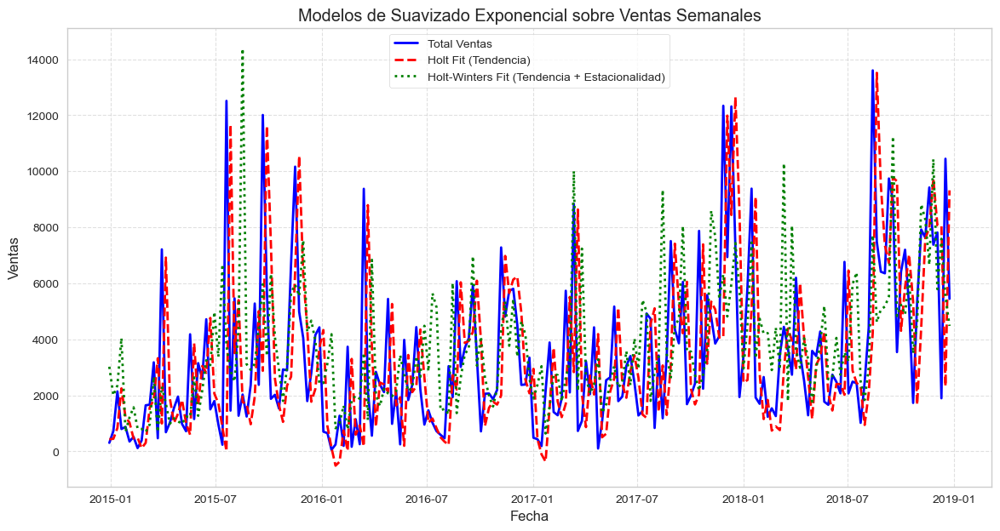

In [381]:
# Graficar la serie original y los ajustes de ambos modelos
plt.figure(figsize=(14, 7))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], 
         label='Total Ventas', color='blue', linewidth=2)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Holt_Fit'], 
         label='Holt Fit (Tendencia)', color='red', linestyle='--', linewidth=2)
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['HW_Pred'], 
         label='Holt-Winters Fit (Tendencia + Estacionalidad)', color='green', linestyle=':', linewidth=2)
plt.title('Modelos de Suavizado Exponencial sobre Ventas Semanales')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

__Genera los gráficos ACF y PACF de tu serie y describe si hay picos significativos.__

Análisis de Autocorrelación.

El gráfico ACF muestra cuánto se parece la serie a sí misma en distintos “rezagos” (lags). Un rezago de 1 significa comparar cada dato con el de la semana anterior, un rezago de 2 compara con dos semanas antes, etc.

El gráfico PACF muestra la correlación parcial, es decir, cuánta relación hay entre la serie y un rezago específico descontando la influencia de los rezagos intermedios.

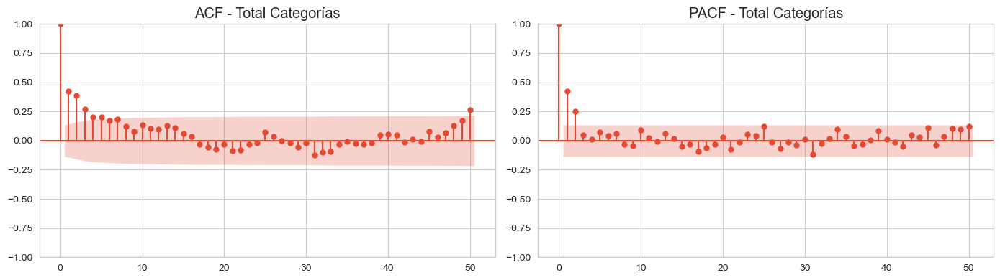

In [382]:
# Autocorrelación
categorias_seleccionadas = ['Technology', 'Furniture', 'Office Supplies']
df_ventas_resample_semanal['Total_ventas'] = df_ventas_resample_semanal[categorias_seleccionadas].sum(axis=1)
fig, ax = plt.subplots(1,2, figsize=(14, 4))

# ACF
plot_acf(df_ventas_resample_semanal['Total_ventas'], lags=50, ax=ax[0], title='ACF - Total Categorías')
# PACF
plot_pacf(df_ventas_resample_semanal['Total_ventas'], lags=50, ax=ax[1], title='PACF - Total Categorías', method='ywm')
# method='ywm' es un método recomendado para calculo de PACF

plt.tight_layout()
plt.show()

El gráfico ACF (función de autocorrelación) para el total de las categorías nos muestra que hay un primer lag que es 1, lo cuál es normal. 

Los picos altos fuera de la banda roja (zona de confianza), significa que hay correlación fuerte en ese rezago. Vemos que hay correlación alta en los dos/tres primeros rezagos y se ve que en rezago 50 vuelve a tener otra vez una cierta correlación fuerte. Aunque podría ser un efecto aleatorio, dados los datos del dataset, es posible que la curva ACF esté detectando la sesonality anual de 52 semanas.

Se atisba que para un modelo Arima pudiera utilizarse en suavizado de MA(1) o MA(2), aunque las correlaciones no son muy altas 0,48 lag 1 y 0,47 lag 2 y 0,25 lag 50.

El gráfico PACF (función de autocorrelación parcial), en el primer rezago vemos que la correlación será de 1. Se observa una correlación fuera de la zona de confianza para el lag 1 de 0,47 y para el lag 2 de 0,25, lo que quiere decir que no son correlaciones muy fuertes.

Se podría atisbar para un modelo Arima poder utilizar un modelo AR(1) o AR(2).

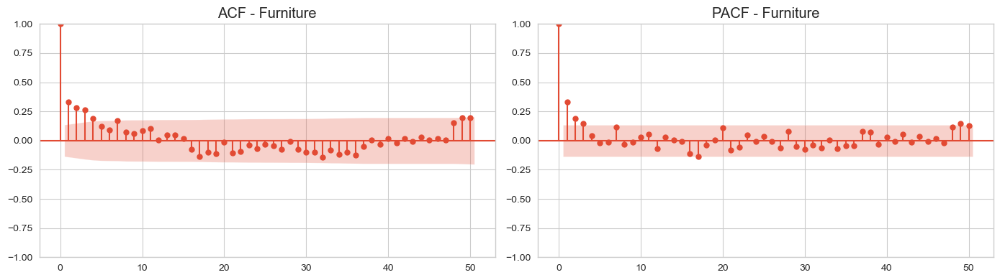

In [383]:
# Autocorrelación
fig, ax = plt.subplots(1,2, figsize=(14, 4))

# ACF
plot_acf(df_ventas_resample_semanal['Furniture'], lags=50, ax=ax[0], title='ACF - Furniture')
# PACF
plot_pacf(df_ventas_resample_semanal['Furniture'], lags=50, ax=ax[1], title='PACF - Furniture', method='ywm')
# method='ywm' es un método recomendado para calculo de PACF

plt.tight_layout()
plt.show()

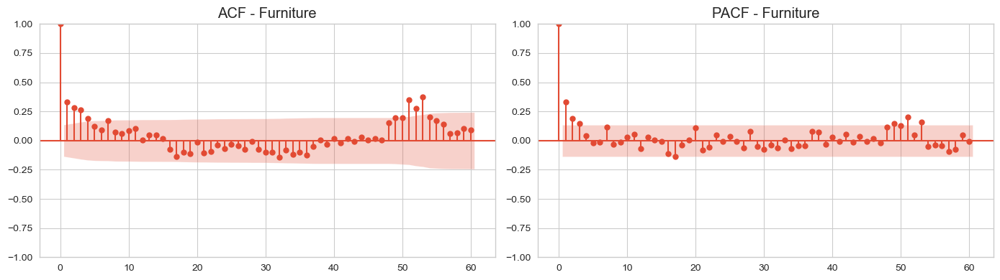

In [384]:
# Autocorrelación
fig, ax = plt.subplots(1,2, figsize=(14, 4))

# ACF
plot_acf(df_ventas_resample_semanal['Furniture'], lags=60, ax=ax[0], title='ACF - Furniture')
# PACF
plot_pacf(df_ventas_resample_semanal['Furniture'], lags=60, ax=ax[1], title='PACF - Furniture', method='ywm')
# method='ywm' es un método recomendado para calculo de PACF

plt.tight_layout()
plt.show()

Hemos graficado con dos lags distintos 50 y 60 para analizar con cierto detalle las curva de Furniture, que será la elegida para posteriormente modelar con el resto de modelos, principalmente por tener una estacionalidad bastante marcada y podemos observar que si dejaramos por defecto 50 lags nos perderíamos en el lag 50 unas correlaciones fuertes en la curva de ACF.

Podemos analizar que la curva ACF que la curva de autocorrelación parcial analiza que correlación existe con los rezagos pasados. Podemos observar que fuera de la zona de confianza en el lag 1 hay una correlación 0,3 no es grande y va disminuyendo hasta el lag 3 que se sitúa en 0,25, posteriormente entramos en la zona sombreada donde no hay correlación, se observa que aunque no hay correlación hay una correlación negativa muy baja desde lag 17 hasta lag 38, cambiando el signo de la misma hasta el lag 51 donde nos situamos en un nivel superior, esto quiere decir que puede haber una componente estacional de 52 semanas anuales que es como funciona el ciclo general de retail.

Para la gráfica de PACF vemos que en el lag 1 tenemos una cierta correlación lo que nos invitaría a utilizar un modelo AR(1) como mucho, es cierto que no es alta, pero habría que valorar si queremos o no darle una cierta autorrelación.

Los modelos propuestos son modelos desde un punto de vista gráfico, tenemos que utilizar criterio de AIC y BIC para determinar correctamente qué modelo utilizar posteriormente, donde dichos parámetros sean los menores.

Posteriormente utilizaremos esta categoría para realizar el modelado con ARIMA y SARIMA.

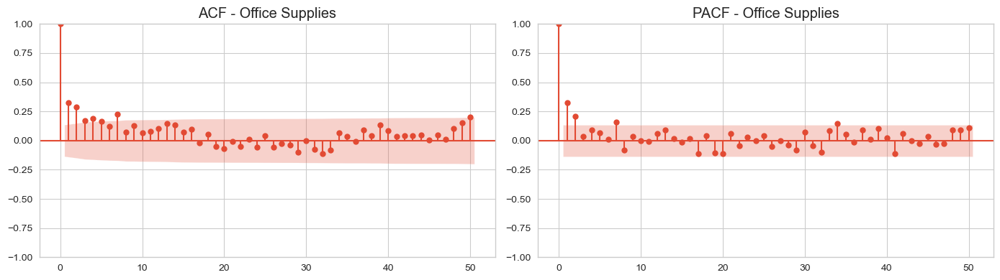

In [385]:
# Autocorrelación
fig, ax = plt.subplots(1,2, figsize=(14, 4))

# ACF
plot_acf(df_ventas_resample_semanal['Office Supplies'], lags=50, ax=ax[0], title='ACF - Office Supplies')
# PACF
plot_pacf(df_ventas_resample_semanal['Office Supplies'], lags=50, ax=ax[1], title='PACF - Office Supplies', method='ywm')
# method='ywm' es un método recomendado para calculo de PACF

plt.tight_layout()
plt.show()

Para la categoría de Office Supplies, observamos que tiene un comportamiento parecido a Furniture, pero sin un correlación tan marcada con la categoría de furniture.

Vemos que la curva de ACF hay una cierta correlación con el lag 1 de 0,3 y de 0,27 para el lag 2, para el resto de lags no vemos que tengamos mucha correlación. 

Para la curva de PACF vemos que las correlaciones son bajas, significativas las tenemos en el lag 1 de 0,3 y para el lag 2 de 0,23, aunque no son muy altas.

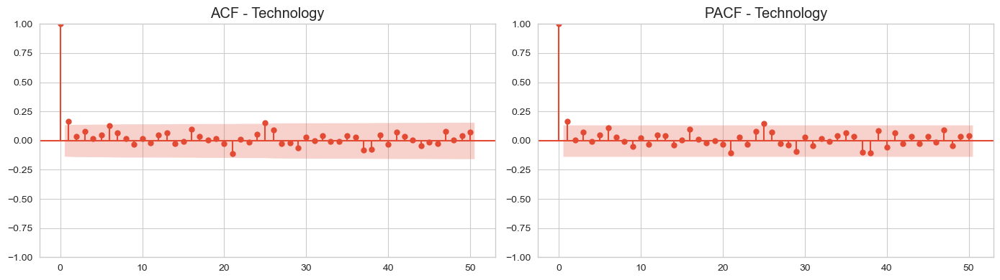

In [386]:
# Autocorrelación
fig, ax = plt.subplots(1,2, figsize=(14, 4))

# ACF
plot_acf(df_ventas_resample_semanal['Technology'], lags=50, ax=ax[0], title='ACF - Technology')
# PACF
plot_pacf(df_ventas_resample_semanal['Technology'], lags=50, ax=ax[1], title='PACF - Technology', method='ywm')
# method='ywm' es un método recomendado para calculo de PACF

plt.tight_layout()
plt.show()

Para la categoría de Technology, no vemos correlaciones significativas en sus lags ni para ACF ni para PACF.

### __Implementar detección de anomalías con z-score.__ ###

In [387]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_squared_error

%matplotlib inline
sns.set_style("whitegrid")

print("Entorno listo")


Entorno listo


__Cálculo de z-score__

El método z-score asume que la serie (o sus residuales) tienen una distribución aproximadamente normal. Si un punto excede cierto umbral (ej. z > 3), lo marcamos como anómalo.

In [388]:
print(len(df_ventas_resample_semanal['Total_ventas']))
print(len(zscore(df_ventas_resample_semanal['Total_ventas'])))

209
209


In [389]:
print(df_ventas_resample_semanal['Total_ventas'].isna().sum())

0


#### __Análisis total de Detección de anomalías__ ####

Número de anomalías detectadas (z-score): <bound method NDFrame._add_numeric_operations.<locals>.sum of pedido_d
2014-12-29    0
2015-01-05    0
2015-01-12    0
2015-01-19    0
2015-01-26    0
             ..
2018-11-26    1
2018-12-03    0
2018-12-10    0
2018-12-17    0
2018-12-24    0
Freq: W-MON, Name: anomaly_z, Length: 209, dtype: int32>


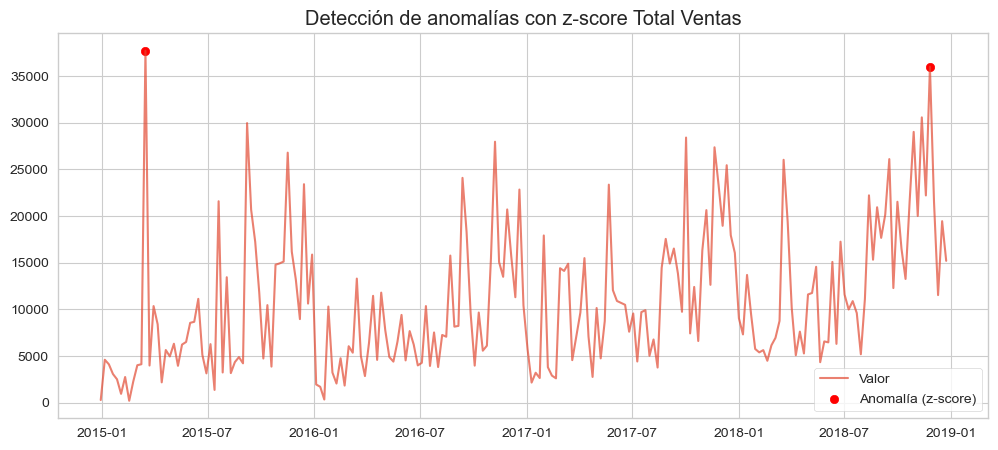


Observaciones con anomalías (z-score > 3):
Category    Furniture  Office Supplies  Technology  Total_ventas  \
pedido_d                                                           
2015-03-16   5318.368         3179.483   29205.814     37703.665   
2018-11-26  16791.932         7377.448   11829.520     35998.900   

Category      MA_7_Total  MA_7_Technology  MA_7_Office Supplies  \
pedido_d                                                          
2015-03-16   7446.876857      4588.566286           1123.775857   
2018-11-26  24660.460171     10629.375143           6372.417000   

Category    MA_7_Furniture   MA_14_Total  MA_14_Technology  ...  \
pedido_d                                                    ...   
2015-03-16     1734.534714           NaN               NaN  ...   
2018-11-26     7658.668029  21989.571586         8371.5175  ...   

Category    EWMA_0.1_Total  EWMA_0.1_Technology  EWMA_0.1_Office Supplies  \
pedido_d                                                            

In [390]:
df_ventas_resample_semanal['z_score'] = zscore(df_ventas_resample_semanal['Total_ventas'])
threshold = 3  # umbral típico
df_ventas_resample_semanal['anomaly_z'] = (df_ventas_resample_semanal['z_score'].abs() > threshold).astype(int)
print("Número de anomalías detectadas (z-score):", df_ventas_resample_semanal['anomaly_z'].sum)
      
# Visualizamos en un plot
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Total_ventas'], label='Valor', alpha=0.7)
plt.scatter(df_ventas_resample_semanal.index[df_ventas_resample_semanal['anomaly_z'] == 1],
            df_ventas_resample_semanal['Total_ventas'][df_ventas_resample_semanal['anomaly_z'] == 1],
            color='red', label='Anomalía (z-score)')
plt.title("Detección de anomalías con z-score Total Ventas")
plt.legend()
plt.show()
# Imprimir las observaciones que son anomalías
anomalias = df_ventas_resample_semanal[df_ventas_resample_semanal['anomaly_z'] == 1]
print("\nObservaciones con anomalías (z-score > {}):".format(threshold))
print(anomalias)

Es muy interesante analizar que para la serie total de ventas para las tres categorías de nuestros datasets, las fechas que se suponen una anomalía son 16/03/2016 que es el lanzamiento de productos de tecnología, ahora en marzo es el arranque de novedades de PV y por otro lado justo antes del black friday del año 2018. 

Lo que si podemos observar claramente son los ciclos de retail y vemos claramente los periodos de liquidación de Primavera-Verano y Otoño-Invierno, por lo que los picos que vemos suelen estar más asociados a valores atípicos por lanzamientos de productos de tecnología o bien a lanzamientos de productos

#### __Análisis de anomalía de Technology__ ####

Número de anomalías detectadas (z-score): <bound method NDFrame._add_numeric_operations.<locals>.sum of pedido_d
2014-12-29    0
2015-01-05    0
2015-01-12    0
2015-01-19    0
2015-01-26    0
             ..
2018-11-26    0
2018-12-03    0
2018-12-10    0
2018-12-17    0
2018-12-24    0
Freq: W-MON, Name: anomaly_z, Length: 209, dtype: int32>


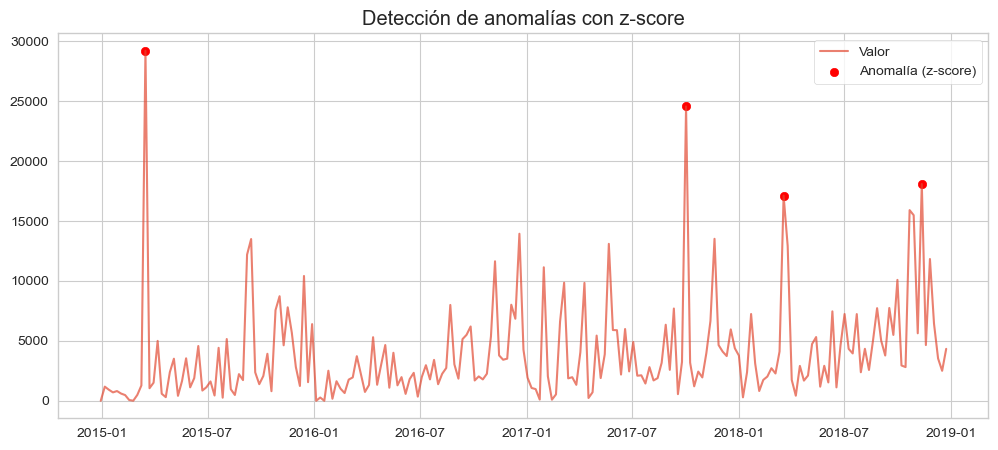


Observaciones con anomalías (z-score > 3):
Category    Furniture  Office Supplies  Technology  Total_ventas  \
pedido_d                                                           
2015-03-16   5318.368         3179.483   29205.814     37703.665   
2017-10-02   1855.160         1995.128   24561.810     28412.098   
2018-03-19   5236.990         3674.502   17118.412     26029.904   
2018-11-12   4854.774         7628.846   18088.827     30572.447   

Category      MA_7_Total  MA_7_Technology  MA_7_Office Supplies  \
pedido_d                                                          
2015-03-16   7446.876857      4588.566286           1123.775857   
2017-10-02  16497.425529      6880.976857           4125.489714   
2018-03-19   9072.306200      4400.281714           2607.770571   
2018-11-12  21779.568171     10137.321429           5917.077286   

Category    MA_7_Furniture   MA_14_Total  MA_14_Technology  ...  \
pedido_d                                                    ...   
2015-03-16

In [391]:
# Sección 2.1: z-score
df_ventas_resample_semanal['z_score'] = zscore(df_ventas_resample_semanal['Technology'])
threshold = 3  # umbral típico
df_ventas_resample_semanal['anomaly_z'] = (df_ventas_resample_semanal['z_score'].abs() > threshold).astype(int)
print("Número de anomalías detectadas (z-score):", df_ventas_resample_semanal['anomaly_z'].sum)
      
# Visualizamos en un plot
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Valor', alpha=0.7)
plt.scatter(df_ventas_resample_semanal.index[df_ventas_resample_semanal['anomaly_z'] == 1],
            df_ventas_resample_semanal['Technology'][df_ventas_resample_semanal['anomaly_z'] == 1],
            color='red', label='Anomalía (z-score)')
plt.title("Detección de anomalías con z-score")
plt.legend()
plt.show()

anomalias1 = df_ventas_resample_semanal[df_ventas_resample_semanal['anomaly_z'] == 1]
print("\nObservaciones con anomalías (z-score > {}):".format(threshold))
print(anomalias1)

Para la categoría de Technology vemos que los picos atípicos se producen en la misma época del año principalmente con marzo, arranque de todos los ejercicios y de novedades y posteriormente antes del periodo de navidad y antes del black friday, vemos que octubre y noviembre picos por lanzamientos de productos de tecnología.

#### __Análisis de anomalía de Furniture__ ####

Número de anomalías detectadas (z-score): <bound method NDFrame._add_numeric_operations.<locals>.sum of pedido_d
2014-12-29    0
2015-01-05    0
2015-01-12    0
2015-01-19    0
2015-01-26    0
             ..
2018-11-26    1
2018-12-03    0
2018-12-10    0
2018-12-17    0
2018-12-24    0
Freq: W-MON, Name: anomaly_z, Length: 209, dtype: int32>


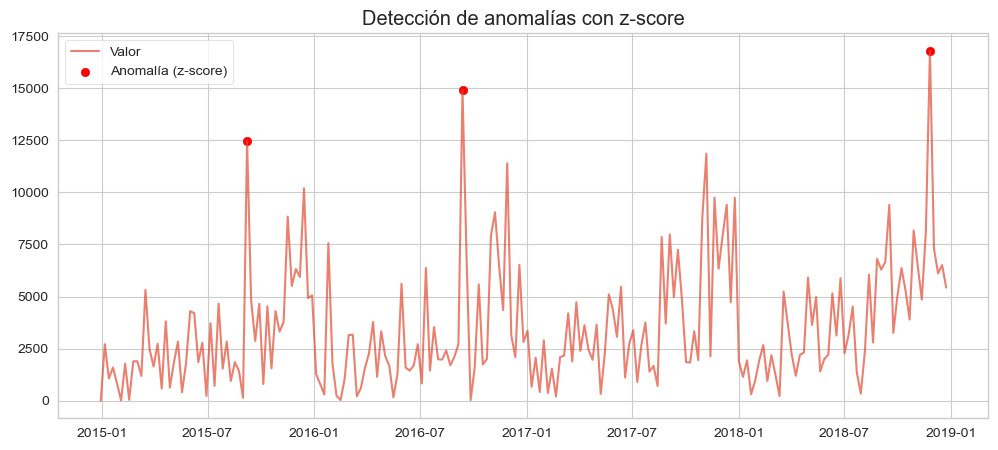


Observaciones con anomalías (z-score > 3):
Category    Furniture  Office Supplies  Technology  Total_ventas  \
pedido_d                                                           
2015-09-07  12484.109         5278.338   12196.690     29959.137   
2016-09-12  14906.546         4045.658    5143.756     24095.960   
2018-11-26  16791.932         7377.448   11829.520     35998.900   

Category      MA_7_Total  MA_7_Technology  MA_7_Office Supplies  \
pedido_d                                                          
2015-09-07   9051.436500      3286.338571           2729.152000   
2016-09-12  10638.855457      3485.247429           3180.690143   
2018-11-26  24660.460171     10629.375143           6372.417000   

Category    MA_7_Furniture   MA_14_Total  MA_14_Technology  ...  \
pedido_d                                                    ...   
2015-09-07     3035.945929   8625.252436       2708.551357  ...   
2016-09-12     3972.917886   8469.249086       2788.616000  ...   
2018-11-26 

In [392]:
df_ventas_resample_semanal['z_score'] = zscore(df_ventas_resample_semanal['Furniture'])
threshold = 3  # umbral típico
df_ventas_resample_semanal['anomaly_z'] = (df_ventas_resample_semanal['z_score'].abs() > threshold).astype(int)
print("Número de anomalías detectadas (z-score):", df_ventas_resample_semanal['anomaly_z'].sum)
      
# Visualizamos en un plot
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Furniture'], label='Valor', alpha=0.7)
plt.scatter(df_ventas_resample_semanal.index[df_ventas_resample_semanal['anomaly_z'] == 1],
            df_ventas_resample_semanal['Furniture'][df_ventas_resample_semanal['anomaly_z'] == 1],
            color='red', label='Anomalía (z-score)')
plt.title("Detección de anomalías con z-score")
plt.legend()
plt.show()

anomalias2 = df_ventas_resample_semanal[df_ventas_resample_semanal['anomaly_z'] == 1]
print("\nObservaciones con anomalías (z-score > {}):".format(threshold))
print(anomalias2)

Para la categoría de Furniture vemos que hay valores atípicos en septiembre de 2015 y 2016, tiene sentido, en plena campaña de Otoño-Invierno y en pleno Black Friday se pueden generar picos de ventas muy fuertes de ahí los valores atípicos. 

#### __Análisis de anomalía de Office Supplies__ ####

Número de anomalías detectadas (z-score): <bound method NDFrame._add_numeric_operations.<locals>.sum of pedido_d
2014-12-29    0
2015-01-05    0
2015-01-12    0
2015-01-19    0
2015-01-26    0
             ..
2018-11-26    0
2018-12-03    0
2018-12-10    0
2018-12-17    0
2018-12-24    0
Freq: W-MON, Name: anomaly_z, Length: 209, dtype: int32>


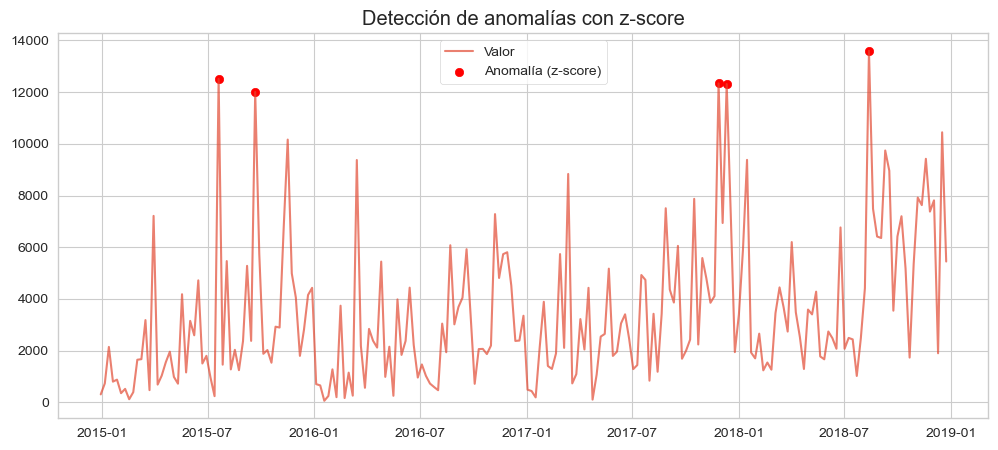


Observaciones con anomalías (z-score > 3):
Category    Furniture  Office Supplies  Technology  Total_ventas  \
pedido_d                                                           
2015-07-20  4658.9180        12512.158    4419.004    21590.0800   
2015-09-21  2865.8078        12010.052    2373.474    17249.3338   
2017-11-27  6336.1580        12338.674    4649.930    23324.7620   
2017-12-11  9404.2470        12314.177    3731.376    25449.8000   
2018-08-13  6048.4220        13601.262    2572.870    22222.5540   

Category      MA_7_Total  MA_7_Technology  MA_7_Office Supplies  \
pedido_d                                                          
2015-07-20   8199.068371      2130.764143           3472.667429   
2015-09-21  12083.640757      4780.293714           3795.932571   
2017-11-27  17048.128971      4915.960143           5824.914429   
2017-12-11  20672.383686      5514.739286           7131.115286   
2018-08-13  11522.940286      4578.272286           4072.129429   

Category 

In [393]:
df_ventas_resample_semanal['z_score'] = zscore(df_ventas_resample_semanal['Office Supplies'])
threshold = 3  # umbral típico
df_ventas_resample_semanal['anomaly_z'] = (df_ventas_resample_semanal['z_score'].abs() > threshold).astype(int)
print("Número de anomalías detectadas (z-score):", df_ventas_resample_semanal['anomaly_z'].sum)
      
# Visualizamos en un plot
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], label='Valor', alpha=0.7)
plt.scatter(df_ventas_resample_semanal.index[df_ventas_resample_semanal['anomaly_z'] == 1],
            df_ventas_resample_semanal['Office Supplies'][df_ventas_resample_semanal['anomaly_z'] == 1],
            color='red', label='Anomalía (z-score)')
plt.title("Detección de anomalías con z-score")
plt.legend()
plt.show()

anomalias3 = df_ventas_resample_semanal[df_ventas_resample_semanal['anomaly_z'] == 1]
print("\nObservaciones con anomalías (z-score > {}):".format(threshold))
print(anomalias3)

Para la categoría de Office Supplies vemos puntos atípicos en la julio y septiembre de 2015 y en 2017, principalmente cuando se dan estos picos de venta tan fuertes, suelen ser debido a procesos de liquidación de mercancía. Posteriormente se genera un efecto secado de los pedidos asociados a dicha categoría.

#### __Análisis de anomalía de Technology__ ####

Número de anomalías detectadas (z-score): <bound method NDFrame._add_numeric_operations.<locals>.sum of pedido_d
2014-12-29    0
2015-01-05    0
2015-01-12    0
2015-01-19    0
2015-01-26    0
             ..
2018-11-26    0
2018-12-03    0
2018-12-10    0
2018-12-17    0
2018-12-24    0
Freq: W-MON, Name: anomaly_z, Length: 209, dtype: int32>


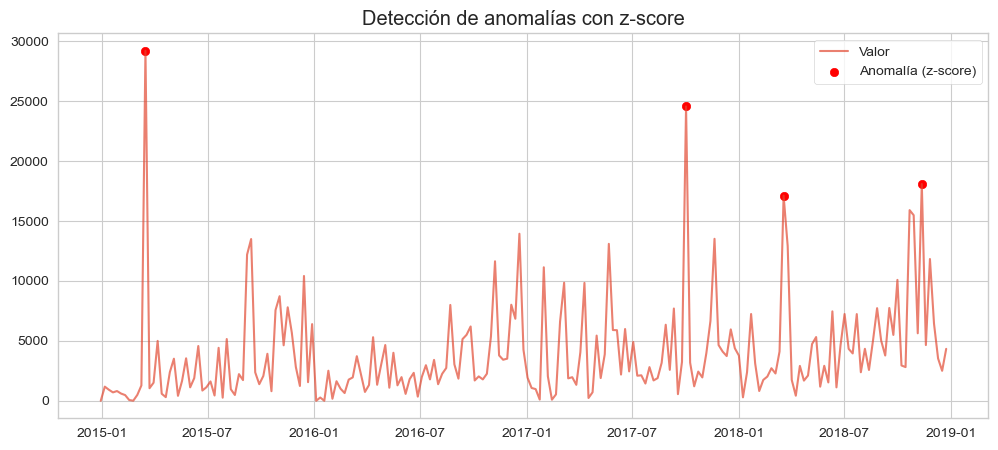


Observaciones con anomalías (z-score > 3):
Category    Furniture  Office Supplies  Technology  Total_ventas  \
pedido_d                                                           
2015-03-16   5318.368         3179.483   29205.814     37703.665   
2017-10-02   1855.160         1995.128   24561.810     28412.098   
2018-03-19   5236.990         3674.502   17118.412     26029.904   
2018-11-12   4854.774         7628.846   18088.827     30572.447   

Category      MA_7_Total  MA_7_Technology  MA_7_Office Supplies  \
pedido_d                                                          
2015-03-16   7446.876857      4588.566286           1123.775857   
2017-10-02  16497.425529      6880.976857           4125.489714   
2018-03-19   9072.306200      4400.281714           2607.770571   
2018-11-12  21779.568171     10137.321429           5917.077286   

Category    MA_7_Furniture   MA_14_Total  MA_14_Technology  ...  \
pedido_d                                                    ...   
2015-03-16

In [394]:
df_ventas_resample_semanal['z_score'] = zscore(df_ventas_resample_semanal['Technology'])
threshold = 3  # umbral típico
df_ventas_resample_semanal['anomaly_z'] = (df_ventas_resample_semanal['z_score'].abs() > threshold).astype(int)
print("Número de anomalías detectadas (z-score):", df_ventas_resample_semanal['anomaly_z'].sum)
      
# Visualizamos en un plot
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Valor', alpha=0.7)
plt.scatter(df_ventas_resample_semanal.index[df_ventas_resample_semanal['anomaly_z'] == 1],
            df_ventas_resample_semanal['Technology'][df_ventas_resample_semanal['anomaly_z'] == 1],
            color='red', label='Anomalía (z-score)')
plt.title("Detección de anomalías con z-score")
plt.legend()
plt.show()

anomalias4 = df_ventas_resample_semanal[df_ventas_resample_semanal['anomaly_z'] == 1]
print("\nObservaciones con anomalías (z-score > {}):".format(threshold))
print(anomalias4)

Vemos que la categoría de Technología tiene picos muy llamativo en marzo con los cambios de temporada donde se suelen anunciar novedades de tecnología o justo antes de las ventas de Black Friday donde dan a conocer lo que se puede regalar durante navidades y se ve claramente en los picos de octubre del 2017 y noviembre de 2018.

__Isolation Forest__

Es un método no supervisado que “aísla” puntos anómalos más rápidamente que puntos normales en un bosque de árboles aleatorios.

Aplicamos Isolationforest para Technology

Anomalías detectadas en Technology: 5


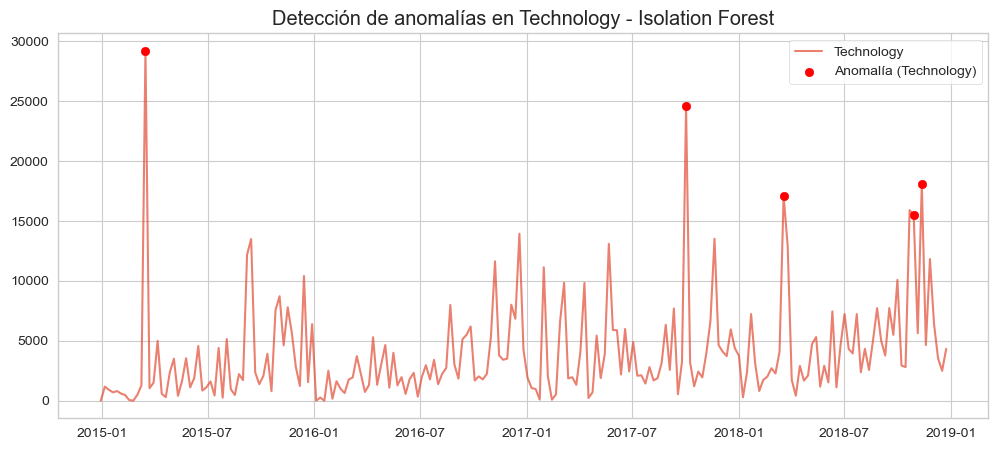

                valor
pedido_d             
2015-03-16  29205.814
2017-10-02  24561.810
2018-03-19  17118.412
2018-10-29  15484.708
2018-11-12  18088.827


In [395]:
df_iforest_tech = pd.DataFrame(df_ventas_resample_semanal['Technology']).dropna()
df_iforest_tech.rename(columns={'Technology': 'valor'}, inplace=True)

X_if_tech = df_iforest_tech[['valor']]

iso_forest_tech = IsolationForest(n_estimators=100, contamination=0.02, random_state=42)
iso_forest_tech.fit(X_if_tech)

df_iforest_tech['anomaly_if'] = iso_forest_tech.predict(X_if_tech)
df_iforest_tech['anomaly_if'] = df_iforest_tech['anomaly_if'].apply(lambda x: 1 if x == -1 else 0)

print("Anomalías detectadas en Technology:", df_iforest_tech['anomaly_if'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_iforest_tech.index, df_iforest_tech['valor'], label='Technology', alpha=0.7)
plt.scatter(df_iforest_tech.index[df_iforest_tech['anomaly_if'] == 1],
            df_iforest_tech['valor'][df_iforest_tech['anomaly_if'] == 1],
            color='red', label='Anomalía (Technology)', zorder=5)
plt.title("Detección de anomalías en Technology - Isolation Forest")
plt.legend()
plt.show()

anomalías_tech = df_iforest_tech[df_iforest_tech['anomaly_if'] == 1]
print(anomalías_tech[['valor']])

Utilizando Isolation forest vemos que hay 5 anomalías en Technology.

Aplicamos Isolationforest para Office Supplies.

Anomalías detectadas en Office Supplies: 5


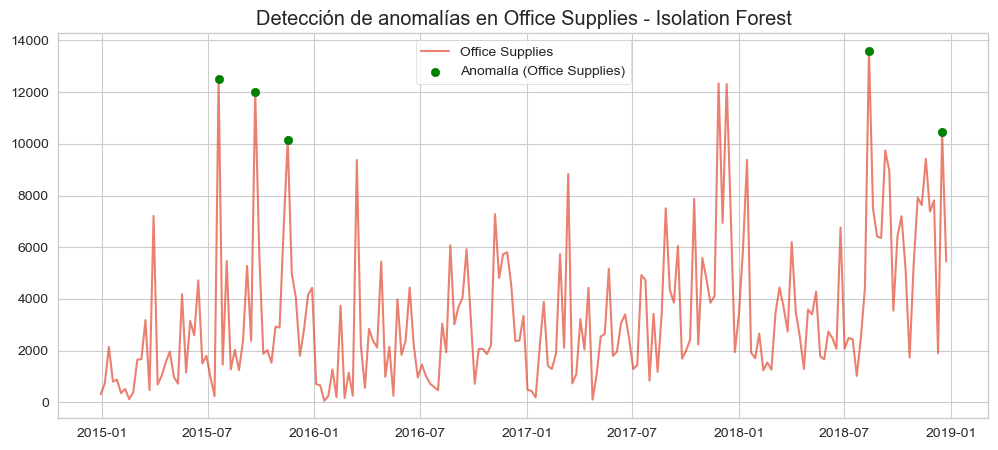

                valor
pedido_d             
2015-07-20  12512.158
2015-09-21  12010.052
2015-11-16  10164.135
2018-08-13  13601.262
2018-12-17  10446.247


In [396]:
df_iforest_office = pd.DataFrame(df_ventas_resample_semanal['Office Supplies']).dropna()
df_iforest_office.rename(columns={'Office Supplies': 'valor'}, inplace=True)

X_if_office = df_iforest_office[['valor']]

iso_forest_office = IsolationForest(n_estimators=100, contamination=0.02, random_state=42)
iso_forest_office.fit(X_if_office)

df_iforest_office['anomaly_if'] = iso_forest_office.predict(X_if_office)
df_iforest_office['anomaly_if'] = df_iforest_office['anomaly_if'].apply(lambda x: 1 if x == -1 else 0)

print("Anomalías detectadas en Office Supplies:", df_iforest_office['anomaly_if'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_iforest_office.index, df_iforest_office['valor'], label='Office Supplies', alpha=0.7)
plt.scatter(df_iforest_office.index[df_iforest_office['anomaly_if'] == 1],
            df_iforest_office['valor'][df_iforest_office['anomaly_if'] == 1],
            color='green', label='Anomalía (Office Supplies)', zorder=5)
plt.title("Detección de anomalías en Office Supplies - Isolation Forest")
plt.legend()
plt.show()

anomalías_office = df_iforest_office[df_iforest_office['anomaly_if'] == 1]
print(anomalías_office[['valor']])



Para serie temporal de Office Supplies vemos que tenemos 5 anomalías detectadas utilizando Isolation Forest.

Aplicamos Isolationforest para Furniture

Anomalías detectadas (Isolation Forest): 5


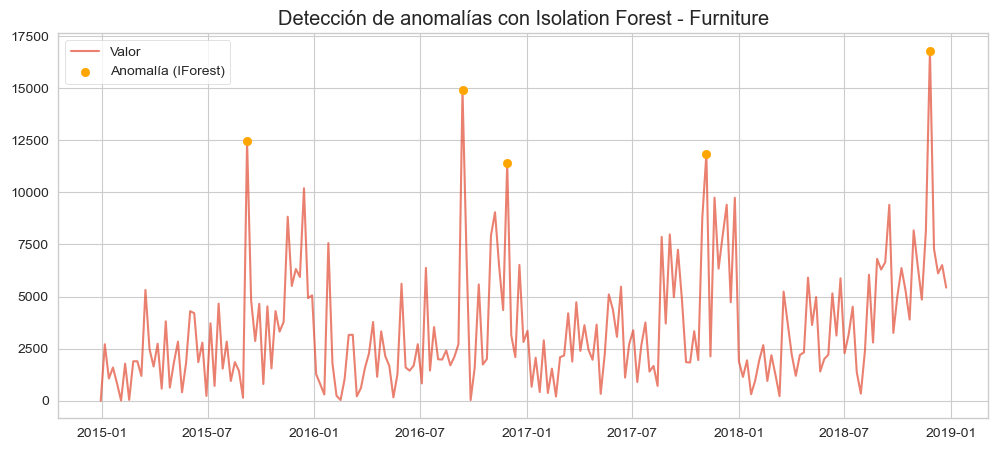

                valor
pedido_d             
2015-09-07  12484.109
2016-09-12  14906.546
2016-11-28  11391.391
2017-11-06  11855.842
2018-11-26  16791.932


In [397]:
df_iforest = pd.DataFrame(df_ventas_resample_semanal['Furniture']).dropna()
df_iforest.rename(columns={'Furniture': 'valor'}, inplace=True)  # Renombramos por comodidad

X_if = df_iforest[['valor']]

iso_forest = IsolationForest(n_estimators=100, contamination=0.02, random_state=42)
iso_forest.fit(X_if)

df_iforest['anomaly_if'] = iso_forest.predict(X_if)
df_iforest['anomaly_if'] = df_iforest['anomaly_if'].apply(lambda x: 1 if x == -1 else 0)

print("Anomalías detectadas (Isolation Forest):", df_iforest['anomaly_if'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_iforest.index, df_iforest['valor'], label='Valor', alpha=0.7)
plt.scatter(df_iforest.index[df_iforest['anomaly_if'] == 1],
            df_iforest['valor'][df_iforest['anomaly_if'] == 1],
            color='orange', label='Anomalía (IForest)', zorder=5)
plt.title("Detección de anomalías con Isolation Forest - Furniture")
plt.legend()
plt.show()

anomalías_fur = df_iforest[df_iforest['anomaly_if'] == 1]
print(anomalías_fur[['valor']])

Para serie temporal de Furniture vemos que tenemos 5 anomalías detectadas utilizando Isolation Forest.

__Modelo Supervisado Sencillo (Regresión Lineal)__

Realizamos un ejercicio de regresión simple para cada serie temporal para detectar anomalías basadas en residuales.

Serie de Furniture

In [398]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.stats import zscore
import matplotlib.pyplot as plt
import pandas as pd

df_furniture = pd.DataFrame(df_ventas_resample_semanal['Furniture']).copy()
df_furniture['lag1'] = df_furniture['Furniture'].shift(1)
df_furniture['lag2'] = df_furniture['Furniture'].shift(2)
df_furniture.dropna(inplace=True)

X_fur = df_furniture[['lag1', 'lag2']]
y_fur = df_furniture['Furniture']

split_fur = int(len(df_furniture) * 0.8)
X_train_fur, X_test_fur = X_fur.iloc[:split_fur], X_fur.iloc[split_fur:]
y_train_fur, y_test_fur = y_fur.iloc[:split_fur], y_fur.iloc[split_fur:]

In [399]:
lr_fur = LinearRegression()
lr_fur.fit(X_train_fur, y_train_fur)

print("\nFurniture - Coeficientes:", lr_fur.coef_)
print("Furniture - Intercepto:", lr_fur.intercept_)



Furniture - Coeficientes: [0.2204045 0.1857103]
Furniture - Intercepto: 1902.3998930862215


MSE Furniture: 7848364.038585873


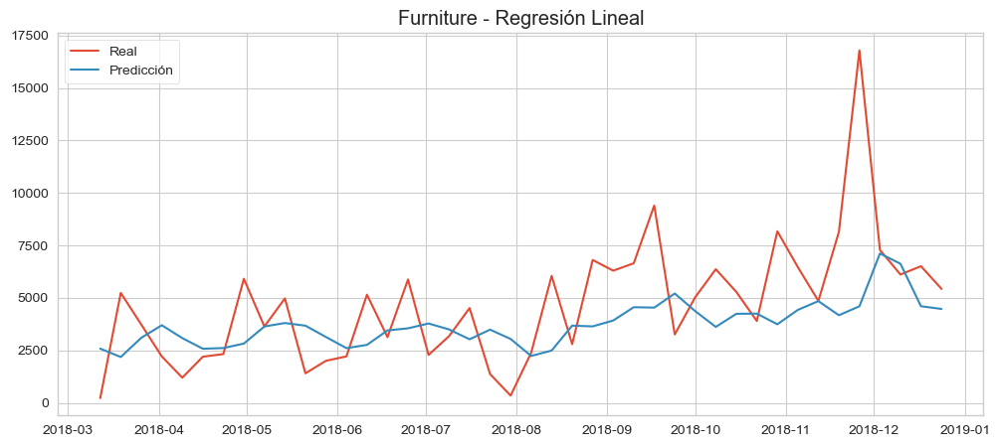

In [400]:
y_pred_fur = lr_fur.predict(X_test_fur)
mse_fur = mean_squared_error(y_test_fur, y_pred_fur)
print("MSE Furniture:", mse_fur)

df_pred_fur = pd.DataFrame({'real': y_test_fur, 'pred': y_pred_fur}, index=y_test_fur.index)
plt.figure(figsize=(12,5))
plt.plot(df_pred_fur.index, df_pred_fur['real'], label='Real')
plt.plot(df_pred_fur.index, df_pred_fur['pred'], label='Predicción')
plt.title('Furniture - Regresión Lineal')
plt.legend()
plt.show()

Anomalías detectadas en Furniture (residuales z-score): 1


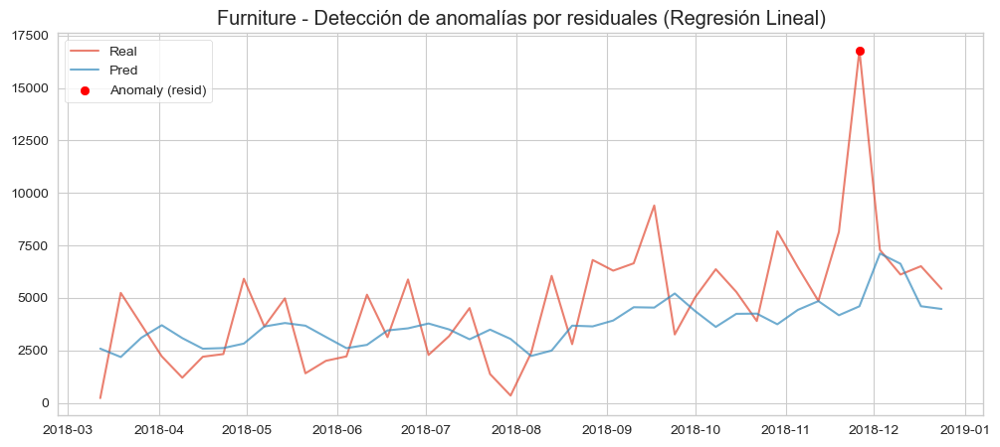

pedido_d
2018-11-26    16791.932
Freq: W-MON, Name: real, dtype: float64


In [401]:
df_pred_fur['resid'] = df_pred_fur['real'] - df_pred_fur['pred']
df_pred_fur['resid_z'] = zscore(df_pred_fur['resid'])

resid_threshold = 3
df_pred_fur['anomaly_resid'] = (df_pred_fur['resid_z'].abs() > resid_threshold).astype(int)

print("Anomalías detectadas en Furniture (residuales z-score):", df_pred_fur['anomaly_resid'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_pred_fur.index, df_pred_fur['real'], label='Real', alpha=0.7)
plt.plot(df_pred_fur.index, df_pred_fur['pred'], label='Pred', alpha=0.7)

anomalies_fur = df_pred_fur[df_pred_fur['anomaly_resid'] == 1]
plt.scatter(anomalies_fur.index, anomalies_fur['real'], color='red', label='Anomaly (resid)', zorder=5)

plt.title("Furniture - Detección de anomalías por residuales (Regresión Lineal)")
plt.legend()
plt.show()
print(anomalies_fur['real'])

Realizando un forecast a través de una regresión lineal y realizando detección de anomalías por residuales vemos que hay un valor anómalo para la serie de Furniture.

Serie de Technology.

In [402]:
df_tech = pd.DataFrame(df_ventas_resample_semanal['Technology']).copy()
df_tech['lag1'] = df_tech['Technology'].shift(1)
df_tech['lag2'] = df_tech['Technology'].shift(2)
df_tech.dropna(inplace=True)

X_tech = df_tech[['lag1', 'lag2']]
y_tech = df_tech['Technology']

split_tech = int(len(df_tech) * 0.8)
X_train_tech, X_test_tech = X_tech.iloc[:split_tech], X_tech.iloc[split_tech:]
y_train_tech, y_test_tech = y_tech.iloc[:split_tech], y_tech.iloc[split_tech:]

In [403]:
lr_tech = LinearRegression()
lr_tech.fit(X_train_tech, y_train_tech)

print("\nTechnology - Coeficientes:", lr_tech.coef_)
print("Technology - Intercepto:", lr_tech.intercept_)


Technology - Coeficientes: [ 0.0965242  -0.05542412]
Technology - Intercepto: 3389.0549303116404


MSE Technology: 23938269.176195666


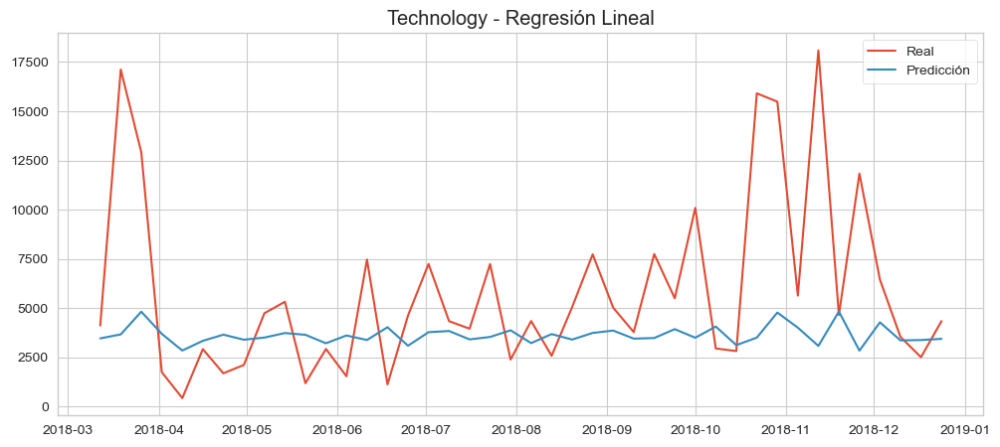

In [404]:
y_pred_tech = lr_tech.predict(X_test_tech)
mse_tech = mean_squared_error(y_test_tech, y_pred_tech)
print("MSE Technology:", mse_tech)

df_pred_tech = pd.DataFrame({'real': y_test_tech, 'pred': y_pred_tech}, index=y_test_tech.index)
plt.figure(figsize=(12,5))
plt.plot(df_pred_tech.index, df_pred_tech['real'], label='Real')
plt.plot(df_pred_tech.index, df_pred_tech['pred'], label='Predicción')
plt.title('Technology - Regresión Lineal')
plt.legend()
plt.show()

Anomalías detectadas en Technology (residuales z-score): 0


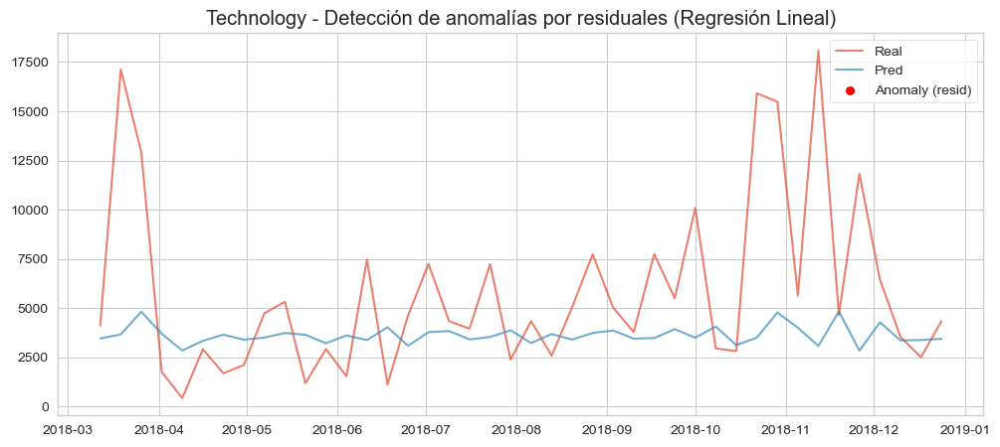

Series([], Freq: W-MON, Name: real, dtype: float64)


In [405]:
df_pred_tech['resid'] = df_pred_tech['real'] - df_pred_tech['pred']
df_pred_tech['resid_z'] = zscore(df_pred_tech['resid'])

df_pred_tech['anomaly_resid'] = (df_pred_tech['resid_z'].abs() > resid_threshold).astype(int)

print("Anomalías detectadas en Technology (residuales z-score):", df_pred_tech['anomaly_resid'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_pred_tech.index, df_pred_tech['real'], label='Real', alpha=0.7)
plt.plot(df_pred_tech.index, df_pred_tech['pred'], label='Pred', alpha=0.7)

anomalies_tech2 = df_pred_tech[df_pred_tech['anomaly_resid'] == 1]
plt.scatter(anomalies_tech2.index, anomalies_tech2['real'], color='red', label='Anomaly (resid)', zorder=5)

plt.title("Technology - Detección de anomalías por residuales (Regresión Lineal)")
plt.legend()
plt.show()
print(anomalies_tech2['real'])

Realizando un forecast a través de una regresión lineal y realizando detección de anomalías por residuales vemos que no hay un valor anómalo para la serie de Furniture.

Serie de Office Supplies.

In [406]:
df_office = pd.DataFrame(df_ventas_resample_semanal['Office Supplies']).copy()
df_office['lag1'] = df_office['Office Supplies'].shift(1)
df_office['lag2'] = df_office['Office Supplies'].shift(2)
df_office.dropna(inplace=True)

X_office = df_office[['lag1', 'lag2']]
y_office = df_office['Office Supplies']

split_office = int(len(df_office) * 0.8)
X_train_office, X_test_office = X_office.iloc[:split_office], X_office.iloc[split_office:]
y_train_office, y_test_office = y_office.iloc[:split_office], y_office.iloc[split_office:]

In [407]:
lr_office = LinearRegression()
lr_office.fit(X_train_office, y_train_office)

print("\nOffice Supplies - Coeficientes:", lr_office.coef_)
print("Office Supplies - Intercepto:", lr_office.intercept_)


Office Supplies - Coeficientes: [0.18266295 0.18746845]
Office Supplies - Intercepto: 1902.373008069746


MSE Office Supplies: 8799879.686574657


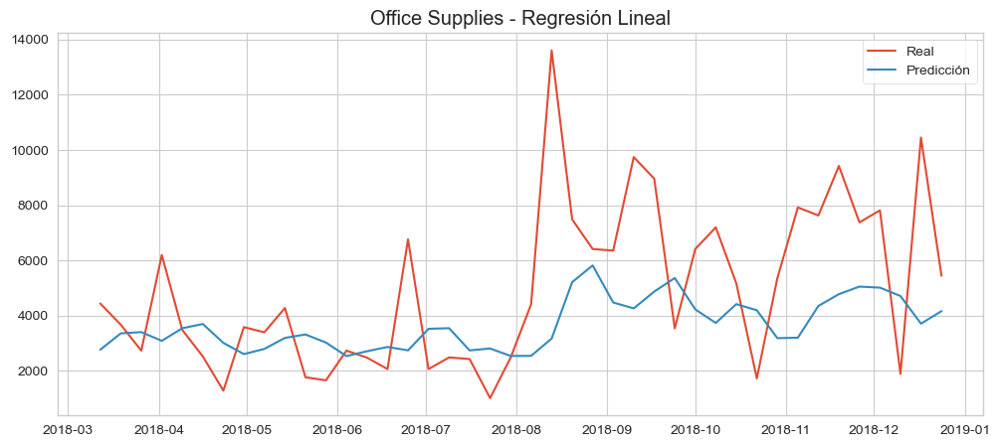

In [408]:
y_pred_office = lr_office.predict(X_test_office)
mse_office = mean_squared_error(y_test_office, y_pred_office)
print("MSE Office Supplies:", mse_office)

df_pred_office = pd.DataFrame({'real': y_test_office, 'pred': y_pred_office}, index=y_test_office.index)
plt.figure(figsize=(12,5))
plt.plot(df_pred_office.index, df_pred_office['real'], label='Real')
plt.plot(df_pred_office.index, df_pred_office['pred'], label='Predicción')
plt.title('Office Supplies - Regresión Lineal')
plt.legend()
plt.show()

Anomalías detectadas en Office Supplies (residuales z-score): 1


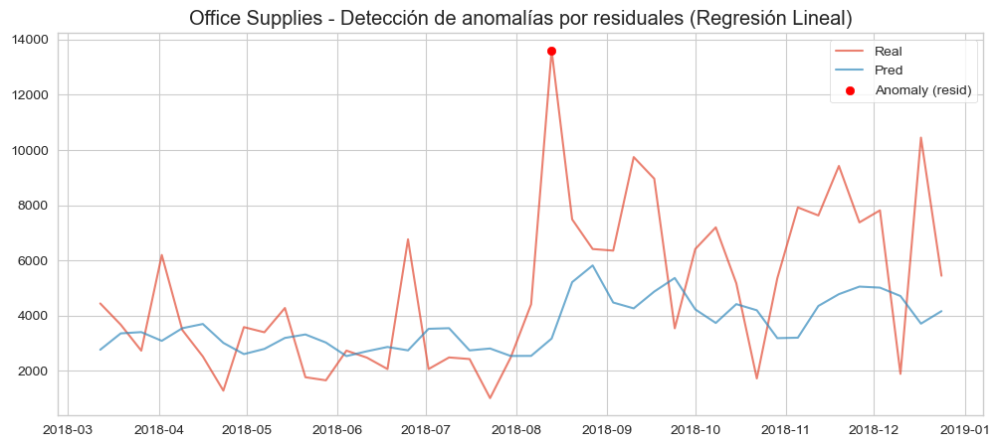

pedido_d
2018-08-13    13601.262
Freq: W-MON, Name: real, dtype: float64


In [409]:
df_pred_office['resid'] = df_pred_office['real'] - df_pred_office['pred']
df_pred_office['resid_z'] = zscore(df_pred_office['resid'])

df_pred_office['anomaly_resid'] = (df_pred_office['resid_z'].abs() > resid_threshold).astype(int)

print("Anomalías detectadas en Office Supplies (residuales z-score):", df_pred_office['anomaly_resid'].sum())

plt.figure(figsize=(12,5))
plt.plot(df_pred_office.index, df_pred_office['real'], label='Real', alpha=0.7)
plt.plot(df_pred_office.index, df_pred_office['pred'], label='Pred', alpha=0.7)

anomalies_office2 = df_pred_office[df_pred_office['anomaly_resid'] == 1]
plt.scatter(anomalies_office2.index, anomalies_office2['real'], color='red', label='Anomaly (resid)', zorder=5)

plt.title("Office Supplies - Detección de anomalías por residuales (Regresión Lineal)")
plt.legend()
plt.show()
print(anomalies_office2['real'])

Realizando un forecast a través de una regresión lineal y realizando detección de anomalías por residuales vemos que hay un valor anómalo para la serie de Office Supplies.

Resumen de los tres métodos de análisis de anomalías para la serie de Furniture.

In [410]:
from scipy.stats import zscore

df_ventas_resample_semanal['z_score_fur'] = zscore(df_ventas_resample_semanal['Furniture'].dropna())
df_ventas_resample_semanal['anomaly_z_fur'] = (df_ventas_resample_semanal['z_score_fur'].abs() > 3).astype(int)

df_compare_fur = pd.DataFrame(index=df_ventas_resample_semanal.index)

df_compare_fur['z_anomaly'] = df_ventas_resample_semanal['anomaly_z_fur'].fillna(0)

df_compare_fur['iforest_anomaly'] = df_iforest['anomaly_if'].reindex(df_compare_fur.index).fillna(0)

df_compare_fur['resid_anomaly'] = 0
df_compare_fur.loc[df_pred_fur.index, 'resid_anomaly'] = df_pred_fur['anomaly_resid'].fillna(0)

df_compare_fur['sum'] = df_compare_fur[['z_anomaly', 'iforest_anomaly', 'resid_anomaly']].sum(axis=1)

df_compare_fur['match_z_if'] = (df_compare_fur['z_anomaly'] == df_compare_fur['iforest_anomaly']).astype(int)

print("\n Furniture - Coincidencias Z-score e Isolation Forest:")
print(f"Coincidencias: {df_compare_fur['match_z_if'].sum()} de {len(df_compare_fur)}")

df_compare_fur['full_match'] = ((df_compare_fur['z_anomaly'] == 1) &
                                (df_compare_fur['iforest_anomaly'] == 1) &
                                (df_compare_fur['resid_anomaly'] == 1)).astype(int)

print("\n Furniture - Coincidencias de los tres métodos:")
print(f"Coincidencias completas: {df_compare_fur['full_match'].sum()} de {len(df_compare_fur)}")

print("\nPrimeras filas del DataFrame comparativo (Furniture):")
print(df_compare_fur.head(10))
print(df_ventas_resample_semanal.loc[df_compare_fur['full_match'] == 1, ['Furniture']])



 Furniture - Coincidencias Z-score e Isolation Forest:
Coincidencias: 207 de 209

 Furniture - Coincidencias de los tres métodos:
Coincidencias completas: 1 de 209

Primeras filas del DataFrame comparativo (Furniture):
            z_anomaly  iforest_anomaly  resid_anomaly  sum  match_z_if  \
pedido_d                                                                 
2014-12-29          0                0              0    0           1   
2015-01-05          0                0              0    0           1   
2015-01-12          0                0              0    0           1   
2015-01-19          0                0              0    0           1   
2015-01-26          0                0              0    0           1   
2015-02-02          0                0              0    0           1   
2015-02-09          0                0              0    0           1   
2015-02-16          0                0              0    0           1   
2015-02-23          0                0  

vemos que solo hay una una coincidencia con los tres métodos.

Resumen de los tres métodos de análisis de anomalías para la serie de Technology.

In [411]:
df_ventas_resample_semanal['z_score_tech'] = zscore(df_ventas_resample_semanal['Technology'].dropna())
df_ventas_resample_semanal['anomaly_z_tech'] = (df_ventas_resample_semanal['z_score_tech'].abs() > 3).astype(int)

df_compare_tech = pd.DataFrame(index=df_ventas_resample_semanal.index)

df_compare_tech['z_anomaly'] = df_ventas_resample_semanal['anomaly_z_tech'].fillna(0)

df_compare_tech['iforest_anomaly'] = df_iforest_tech['anomaly_if'].reindex(df_compare_tech.index).fillna(0)

df_compare_tech['resid_anomaly'] = 0
df_compare_tech.loc[df_pred_tech.index, 'resid_anomaly'] = df_pred_tech['anomaly_resid'].fillna(0)

df_compare_tech['sum'] = df_compare_tech[['z_anomaly', 'iforest_anomaly', 'resid_anomaly']].sum(axis=1)

df_compare_tech['match_z_if'] = (df_compare_tech['z_anomaly'] == df_compare_tech['iforest_anomaly']).astype(int)

print("\n Technology - Coincidencias Z-score e Isolation Forest:")
print(f"Coincidencias: {df_compare_tech['match_z_if'].sum()} de {len(df_compare_tech)}")

df_compare_tech['full_match'] = ((df_compare_tech['z_anomaly'] == 1) &
                                 (df_compare_tech['iforest_anomaly'] == 1) &
                                 (df_compare_tech['resid_anomaly'] == 1)).astype(int)

print("\n Technology - Coincidencias de los tres métodos:")
print(f"Coincidencias completas: {df_compare_tech['full_match'].sum()} de {len(df_compare_tech)}")

print("\nPrimeras filas del DataFrame comparativo (Technology):")
print(df_compare_tech.head(10))


 Technology - Coincidencias Z-score e Isolation Forest:
Coincidencias: 208 de 209

 Technology - Coincidencias de los tres métodos:
Coincidencias completas: 0 de 209

Primeras filas del DataFrame comparativo (Technology):
            z_anomaly  iforest_anomaly  resid_anomaly  sum  match_z_if  \
pedido_d                                                                 
2014-12-29          0                0              0    0           1   
2015-01-05          0                0              0    0           1   
2015-01-12          0                0              0    0           1   
2015-01-19          0                0              0    0           1   
2015-01-26          0                0              0    0           1   
2015-02-02          0                0              0    0           1   
2015-02-09          0                0              0    0           1   
2015-02-16          0                0              0    0           1   
2015-02-23          0                

vemos que no hay coincidencia para los tres métodos analizados de anomalías.

Resumen de los tres métodos de análisis de anomalías para la serie de Office Supplies.

In [412]:
from scipy.stats import zscore

df_ventas_resample_semanal['z_score_office'] = zscore(df_ventas_resample_semanal['Office Supplies'].fillna(method='ffill'))
df_ventas_resample_semanal['anomaly_z_office'] = (df_ventas_resample_semanal['z_score_office'].abs() > 3).astype(int)

df_compare_office = pd.DataFrame(index=df_ventas_resample_semanal.index)
df_compare_office['z_anomaly'] = df_ventas_resample_semanal['anomaly_z_office'].fillna(0)
df_compare_office['iforest_anomaly'] = df_iforest_office['anomaly_if'].reindex(df_compare_office.index).fillna(0)
df_compare_office['resid_anomaly'] = 0
df_compare_office.loc[df_pred_office.index, 'resid_anomaly'] = df_pred_office['anomaly_resid'].fillna(0)

df_compare_office['sum'] = df_compare_office[['z_anomaly', 'iforest_anomaly', 'resid_anomaly']].sum(axis=1)

df_compare_office['match_z_if'] = ((df_compare_office['z_anomaly'] == 1) & (df_compare_office['iforest_anomaly'] == 1)).astype(int)

print("\n Office Supplies - Coincidencias positivas Z-score e Isolation Forest:")
print(f"Coincidencias positivas: {df_compare_office['match_z_if'].sum()} de {len(df_compare_office)}")

df_compare_office['full_match'] = ((df_compare_office['z_anomaly'] == 1) &
                                  (df_compare_office['iforest_anomaly'] == 1) &
                                  (df_compare_office['resid_anomaly'] == 1)).astype(int)

print("\n Office Supplies - Coincidencias completas (los tres métodos):")
print(f"Coincidencias completas: {df_compare_office['full_match'].sum()} de {len(df_compare_office)}")

print("\nPrimeras filas del DataFrame comparativo (Office Supplies):")
print(df_compare_office.head(10))

print("\nValores Office Supplies con coincidencia completa:")
print(df_ventas_resample_semanal.loc[df_compare_office['full_match'] == 1, ['Office Supplies']])



 Office Supplies - Coincidencias positivas Z-score e Isolation Forest:
Coincidencias positivas: 3 de 209

 Office Supplies - Coincidencias completas (los tres métodos):
Coincidencias completas: 1 de 209

Primeras filas del DataFrame comparativo (Office Supplies):
            z_anomaly  iforest_anomaly  resid_anomaly  sum  match_z_if  \
pedido_d                                                                 
2014-12-29          0                0              0    0           0   
2015-01-05          0                0              0    0           0   
2015-01-12          0                0              0    0           0   
2015-01-19          0                0              0    0           0   
2015-01-26          0                0              0    0           0   
2015-02-02          0                0              0    0           0   
2015-02-09          0                0              0    0           0   
2015-02-16          0                0              0    0           

vemos que hay una coincidencia para los tres métodos analizados de anomalías.

Por todo lo anterior a partir de aquí utilizaremos df_ventas_resample_semanal para realizar todos los análisis de los modelos que vengan en adelante, ya que por ciclo de retail y con la estacionalidad, se puede sin ningún problema 

#### __MODELO ARIMA__ ####

__Introducción__

El modelo ARIMA es un modelo autorregresivo integrado de media móvil y tiene tres parámetros (p, d, q) que se usa para analizar las series temporales, la d es la parte de diferenciación de la serie temporal.

La modelización de una serie temporal consiste en determinar un modelo que permita hacer un pronóstico de la variable en un instante de tiempo futuro basándose en los valores pasados.

El modelo ARIMA fue desarrollado a finales del siglo XX, los estadísticos Box y Jenkins contribuyeron de manera fundamental a su desarrollo.

Las siglas ARIMA son la abreviación de AutoRegresive Integrated Moving Average, nombre que proviene de sus tres componentes AR (Autoregresivo), I(Integrado) y MA (Medias Móviles).

Los parámetros de un modelo ARIMA se pueden definir de la siguiente manera:

p: indica el número de observaciones de retraso en el modelo. También se conoce como orden de retraso.

d: se trata del número de datos anteriores que se resta a cada valor. También se conoce como grado de diferenciación.

q: es el tamaño de datos que se utiliza para la media móvil. También se conoce como orden de la media móvil.

Visualizamos la serie temporal para analizar correctamente la serie y aplicar el modelo ARIMA.

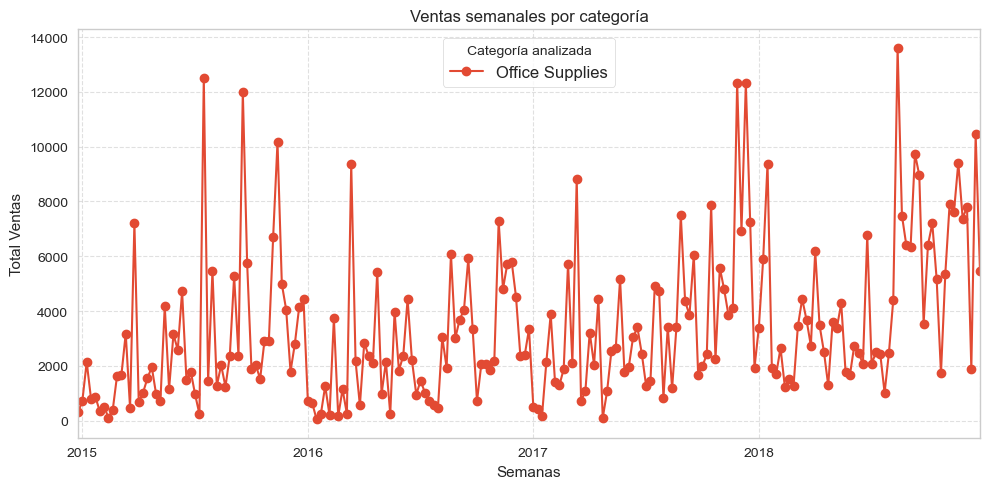

In [413]:
plt.figure(figsize=(10, 9))
df_ventas_resample_semanal["Office Supplies"].plot(kind="line", marker="o", figsize=(10, 5))
plt.title("Ventas semanales por categoría", fontsize=12)
plt.xlabel("Semanas", fontsize=11)
plt.ylabel("Total Ventas", fontsize=11)
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Categoría analizada", fontsize=12)
plt.tight_layout()
plt.show()

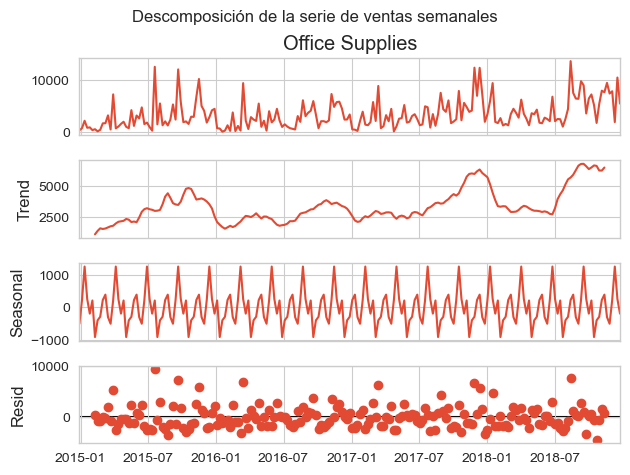

In [414]:
try:
    decomposition_ventas = sm.tsa.seasonal_decompose(df_ventas_resample_semanal["Office Supplies"], model="additive", period=12)
    decomposition_ventas.plot()
    plt.suptitle("Descomposición de la serie de ventas semanales")
    plt.subplots_adjust(top=0.88)  
    plt.show()
except ValueError as e:
    print("Error en la descomposición:", e)

##### __Realización del test de Dickey-Fuller Aumentado__ ####

La prueba de Dickey-Fuller nos da como hipótesis nula que la serie temporal tiene una raiz unitaria, es una característica de las series temporales no estacionarias.

In [415]:
# Prueba de Dickey-Fuller Aumentado
adf_result = adfuller(df_ventas_resample_semanal["Office Supplies"])
print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])

ADF Statistic: -6.604353456154053
p-value: 6.613871906329244e-09


In [416]:
# Sección 3: Test ADF
def adf_test(series):
    result = adfuller(series.dropna(), autolag='AIC')
    labels = ['ADF Statistic','p-value','# Lags Used','Number of Observations Used']
    out = pd.Series(result[0:4], index=labels)
    for key, val in result[4].items():
        out['Critical Value (%s)'%key] = val
    return out

adf_result = adf_test(df_ventas_resample_semanal["Office Supplies"])
print("Test ADF (Office Supplies):\n", adf_result)

Test ADF (Office Supplies):
 ADF Statistic                 -6.604353e+00
p-value                        6.613872e-09
# Lags Used                    1.000000e+00
Number of Observations Used    2.070000e+02
Critical Value (1%)           -3.462342e+00
Critical Value (5%)           -2.875606e+00
Critical Value (10%)          -2.574267e+00
dtype: float64


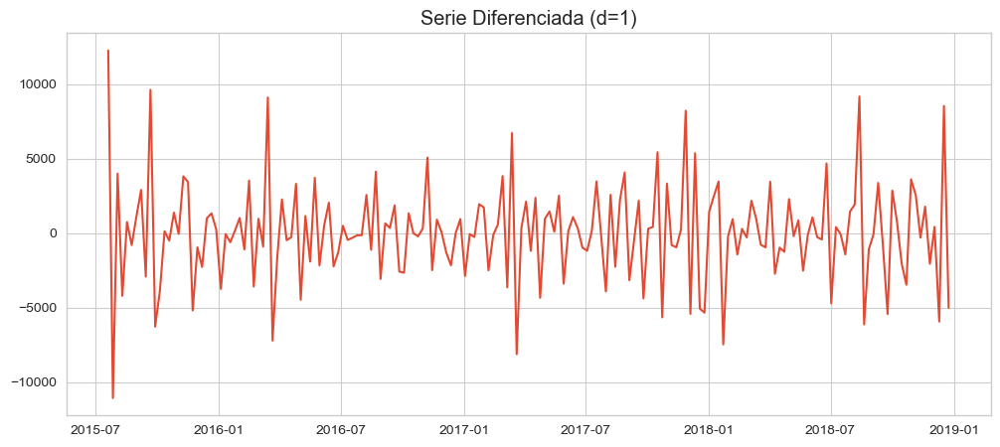

ADF Statistic (Diff1): -9.333446619903997
p-value (Diff1): 9.196443961377667e-16


In [417]:
df_ventas_resample_semanal['Office Supplies_diff'] = df_ventas_resample_semanal["Office Supplies"].diff()
df_ventas_resample_semanal.dropna(inplace=True)

plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies_diff'])
plt.title('Serie Diferenciada (d=1)')
plt.show()

adf_result_diff = adfuller(df_ventas_resample_semanal['Office Supplies_diff'])
print("ADF Statistic (Diff1):", adf_result_diff[0])
print("p-value (Diff1):", adf_result_diff[1])

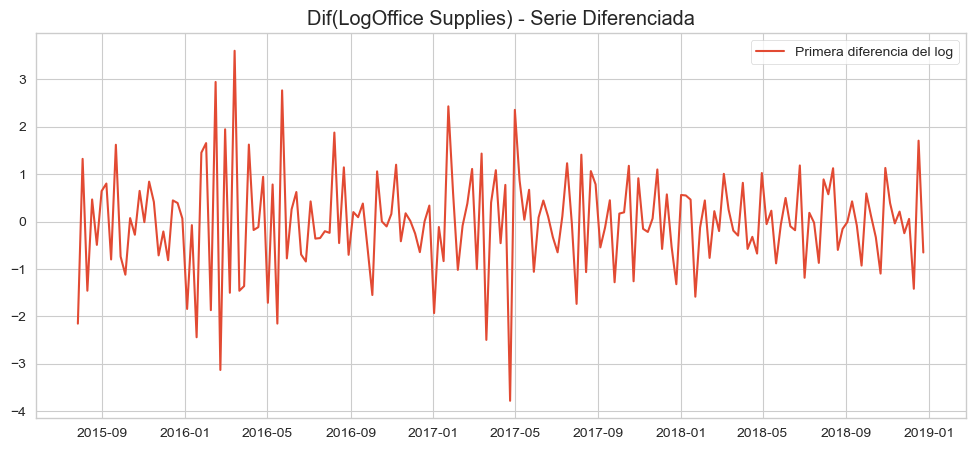

ADF tras diferenciar log:
 ADF Statistic                 -7.332395e+00
p-value                        1.118995e-10
# Lags Used                    8.000000e+00
Number of Observations Used    1.700000e+02
Critical Value (1%)           -3.469413e+00
Critical Value (5%)           -2.878696e+00
Critical Value (10%)          -2.575917e+00
dtype: float64


In [418]:
df_ventas_resample_semanal = df_ventas_resample_semanal.copy()
df_ventas_resample_semanal = df_ventas_resample_semanal[df_ventas_resample_semanal["Office Supplies"] > 0]
df_ventas_resample_semanal['LogOffice Supplies'] = np.log(df_ventas_resample_semanal["Office Supplies"])

# Primera diferencia
df_ventas_resample_semanal['Diff_LogOffice Supplies'] = df_ventas_resample_semanal['LogOffice Supplies'].diff()

# Plot de la serie diferenciada
plt.figure(figsize=(12,5))
plt.plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Diff_LogOffice Supplies'], label='Primera diferencia del log')
plt.title("Dif(LogOffice Supplies) - Serie Diferenciada")
plt.legend()
plt.show()

# Test ADF de la serie diferenciada
adf_diff = adf_test(df_ventas_resample_semanal['Diff_LogOffice Supplies'].dropna())
print("ADF tras diferenciar log:\n", adf_diff)

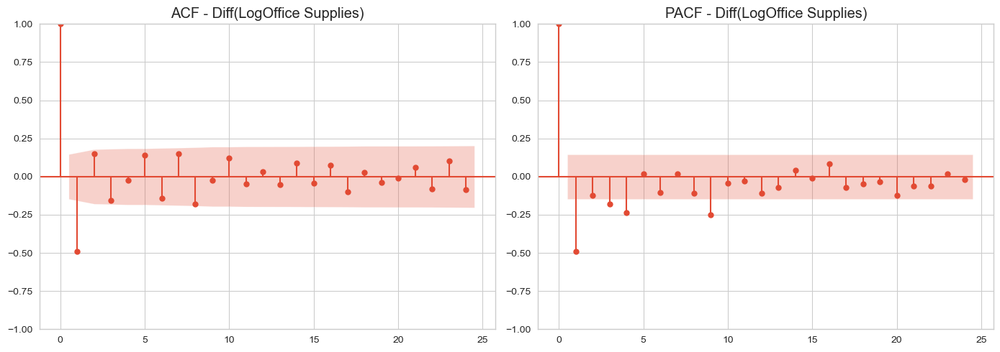

In [419]:
series_diff = df_ventas_resample_semanal['Diff_LogOffice Supplies'].dropna()

plt.figure(figsize=(14,5))

plt.subplot(1,2,1)
plot_acf(series_diff, lags=24, ax=plt.gca(), title="ACF - Diff(LogOffice Supplies)")

plt.subplot(1,2,2)
plot_pacf(series_diff, lags=24, ax=plt.gca(), title="PACF - Diff(LogOffice Supplies)", method='ywm')
plt.tight_layout()
plt.show()


Realizamos un ARIMA con un orden (3,1,1)

In [420]:
import warnings
warnings.filterwarnings('ignore')  # Para no mostrar warnings de statsmodels

# Definimos la serie a modelar: LogPassengers (no la serie ya diferenciada, statsmodels internamente hace dif)
endog_seriesF = df_ventas_resample_semanal['LogOffice Supplies'].dropna()

# Ajustamos con un primer guess: (p,d,q) = (3,1,1)
from statsmodels.tsa.arima.model import ARIMA

model_311 = ARIMA(endog_seriesF, order=(3,1,1))
results_311 = model_311.fit()
print(results_311.summary())


                               SARIMAX Results                                
Dep. Variable:     LogOffice Supplies   No. Observations:                  180
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -225.565
Date:                Tue, 27 May 2025   AIC                            461.130
Time:                        18:41:49   BIC                            477.067
Sample:                    07-20-2015   HQIC                           467.592
                         - 12-24-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2320      0.075      3.086      0.002       0.085       0.379
ar.L2          0.2416      0.070      3.459      0.001       0.105       0.379
ar.L3         -0.0723      0.068     -1.061      0.2

In [421]:
import warnings
warnings.filterwarnings('ignore')  # Para no mostrar warnings de statsmodels

# Definimos la serie a modelar: LogPassengers (no la serie ya diferenciada, statsmodels internamente hace dif)
endog_seriesF = df_ventas_resample_semanal['LogOffice Supplies'].dropna()

# Ajustamos con un primer guess: (p,d,q) = (1,1,1)
from statsmodels.tsa.arima.model import ARIMA

model_111 = ARIMA(endog_seriesF, order=(1,1,1))
results_111 = model_111.fit()
print(results_111.summary())

                               SARIMAX Results                                
Dep. Variable:     LogOffice Supplies   No. Observations:                  180
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -230.139
Date:                Tue, 27 May 2025   AIC                            466.278
Time:                        18:41:49   BIC                            475.841
Sample:                    07-20-2015   HQIC                           470.156
                         - 12-24-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2209      0.073      3.007      0.003       0.077       0.365
ma.L1         -0.9087      0.029    -31.462      0.000      -0.965      -0.852
sigma2         0.7603      0.058     13.179      0.0

In [422]:
aic_values = {}
for p in range(0,4):
    for q in range(0,4):
        try:
            model = ARIMA(endog_seriesF, order=(p,1,q))
            res = model.fit()
            aic_values[(p,1,q)] = res.aic
        except:
            aic_values[(p,1,q)] = np.nan

aic_values_sorted = sorted(aic_values.items(), key=lambda x: x[1])
print("Modelos ordenados por AIC:")
for k,v in aic_values_sorted:
    print(k, "AIC=", v)


Modelos ordenados por AIC:
(0, 1, 3) AIC= 458.57928398989725
(3, 1, 3) AIC= 459.0786933529514
(2, 1, 3) AIC= 459.3495872984814
(2, 1, 1) AIC= 459.9629971519385
(1, 1, 3) AIC= 460.41990985113455
(3, 1, 1) AIC= 461.1299969247307
(2, 1, 2) AIC= 461.2584026863469
(3, 1, 2) AIC= 463.7256249695628
(1, 1, 1) AIC= 466.2784817084301
(0, 1, 1) AIC= 467.8552395561193
(0, 1, 2) AIC= 468.0929269412052
(1, 1, 2) AIC= 471.82030636535376
(3, 1, 0) AIC= 478.41057643562215
(2, 1, 0) AIC= 483.0723739893466
(1, 1, 0) AIC= 483.80543527145664
(0, 1, 0) AIC= 532.7093001247608


In [423]:
bic_values = {}
for p in range(0,4):
    for q in range(0,4):
        try:
            model = ARIMA(endog_seriesF, order=(p,1,q))
            res = model.fit()
            bic_values[(p,1,q)] = res.aic
        except:
            bic_values[(p,1,q)] = np.nan

bic_values_sorted = sorted(bic_values.items(), key=lambda x: x[1])
print("Modelos ordenados por BIC:")
for k,v in bic_values_sorted:
    print(k, "BIC=", v)


Modelos ordenados por BIC:
(0, 1, 3) BIC= 458.57928398989725
(3, 1, 3) BIC= 459.0786933529514
(2, 1, 3) BIC= 459.3495872984814
(2, 1, 1) BIC= 459.9629971519385
(1, 1, 3) BIC= 460.41990985113455
(3, 1, 1) BIC= 461.1299969247307
(2, 1, 2) BIC= 461.2584026863469
(3, 1, 2) BIC= 463.7256249695628
(1, 1, 1) BIC= 466.2784817084301
(0, 1, 1) BIC= 467.8552395561193
(0, 1, 2) BIC= 468.0929269412052
(1, 1, 2) BIC= 471.82030636535376
(3, 1, 0) BIC= 478.41057643562215
(2, 1, 0) BIC= 483.0723739893466
(1, 1, 0) BIC= 483.80543527145664
(0, 1, 0) BIC= 532.7093001247608


Mejor modelo según AIC: (0, 1, 3)
                               SARIMAX Results                                
Dep. Variable:     LogOffice Supplies   No. Observations:                  180
Model:                 ARIMA(0, 1, 3)   Log Likelihood                -225.290
Date:                Tue, 27 May 2025   AIC                            458.579
Time:                        18:41:51   BIC                            471.329
Sample:                    07-20-2015   HQIC                           463.749
                         - 12-24-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7083      0.074     -9.616      0.000      -0.853      -0.564
ma.L2          0.0641      0.088      0.729      0.466      -0.108       0.237
ma.L3         -0.2

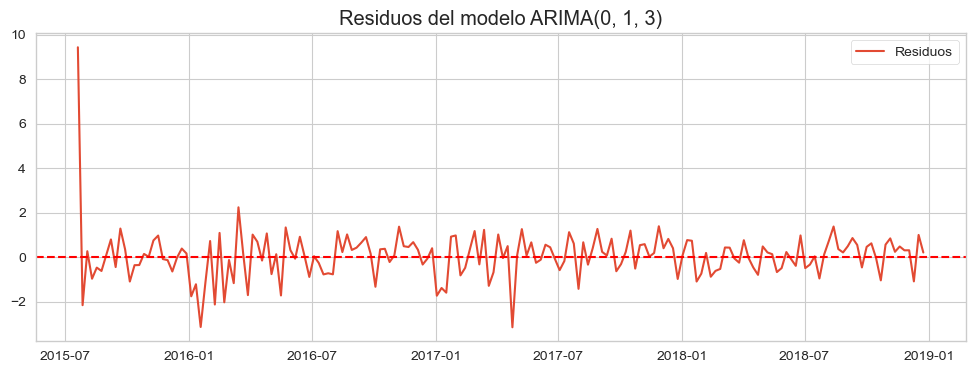

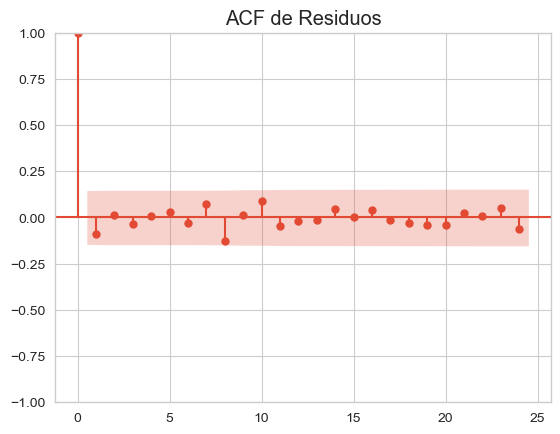

In [424]:
best_order = min(aic_values, key=aic_values.get)
print("Mejor modelo según AIC:", best_order)

best_model = ARIMA(endog_seriesF, order=best_order).fit()
print(best_model.summary())

residuals = best_model.resid

plt.figure(figsize=(12,4))
plt.plot(residuals, label='Residuos')
plt.axhline(y=0, color='r', linestyle='--')
plt.title(f"Residuos del modelo ARIMA{best_order}")
plt.legend()
plt.show()

# ACF de los residuos
plot_acf(residuals, lags=24, title="ACF de Residuos")
plt.show()

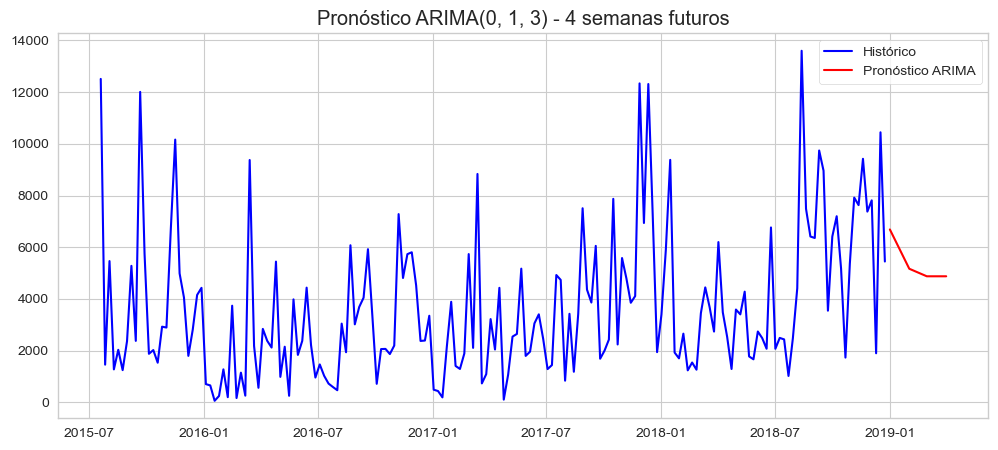

In [425]:
forecast_steps = 4 
forecast_res = best_model.forecast(steps=forecast_steps)

df_forecast = pd.DataFrame({'Forecast_Log': forecast_res})
last_date = df_ventas_resample_semanal.index[-1]
future_dates = pd.date_range(last_date + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='MS')
df_forecast.index = future_dates
df_forecast["Forecast"] = np.exp(df_forecast["Forecast_Log"])
df_final = pd.concat([df_ventas_resample_semanal[['Office Supplies']], df_forecast[['Forecast']]], axis=0)

last_date = df_ventas_resample_semanal.index[-1]
future_dates = pd.date_range(last_date + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='MS')
df_forecast.index = future_dates

df_ventas_resample_semanal['Office Supplies'] = np.exp(df_ventas_resample_semanal['LogOffice Supplies'])

df_final = pd.concat([df_ventas_resample_semanal[['Office Supplies']], df_forecast[['Forecast']]], axis=0)

plt.figure(figsize=(12,5))
plt.plot(df_final.index, df_final['Office Supplies'], label='Histórico', color='blue')
plt.plot(df_final.index, df_final['Forecast'], label='Pronóstico ARIMA', color='red')

plt.title(f"Pronóstico ARIMA{best_order} - 4 semanas futuros")
plt.legend()
plt.show()

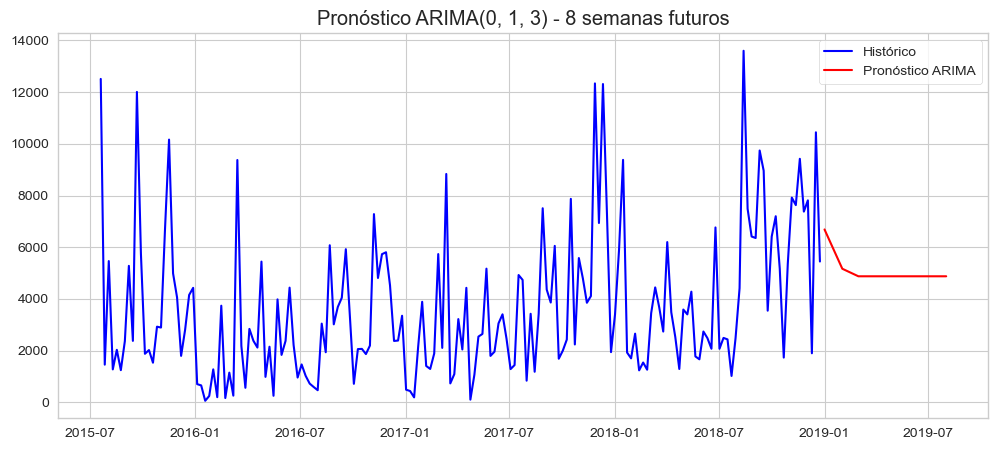

In [426]:
forecast_steps = 8  
forecast_res = best_model.forecast(steps=forecast_steps)

df_forecast = pd.DataFrame({'Forecast_Log': forecast_res})
last_date = df_ventas_resample_semanal.index[-1]
future_dates = pd.date_range(last_date + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='MS')
df_forecast.index = future_dates
df_forecast["Forecast"] = np.exp(df_forecast["Forecast_Log"])
df_final = pd.concat([df_ventas_resample_semanal[['Office Supplies']], df_forecast[['Forecast']]], axis=0)

last_date = df_ventas_resample_semanal.index[-1]
future_dates = pd.date_range(last_date + pd.offsets.MonthBegin(1), periods=forecast_steps, freq='MS')
df_forecast.index = future_dates

df_ventas_resample_semanal['Office Supplies'] = np.exp(df_ventas_resample_semanal['LogOffice Supplies'])

df_final = pd.concat([df_ventas_resample_semanal[['Office Supplies']], df_forecast[['Forecast']]], axis=0)

plt.figure(figsize=(12,5))
plt.plot(df_final.index, df_final['Office Supplies'], label='Histórico', color='blue')
plt.plot(df_final.index, df_final['Forecast'], label='Pronóstico ARIMA', color='red')

plt.title(f"Pronóstico ARIMA{best_order} - 8 semanas futuros")
plt.legend()
plt.show()

In [427]:
train_size = int(len(df_ventas_resample_semanal[['Office Supplies']])*0.8)
train_data = df_ventas_resample_semanal[['Office Supplies']][:train_size]
test_data = df_ventas_resample_semanal[['Office Supplies']][train_size:]

p, d, q = 0, 1, 3
model2 = ARIMA(train_data, order=(p, d, q))
results2 = model2.fit()

start = test_data.index[0]
end = test_data.index[-1]

forecastval = results2.predict(start=start, end=end, dynamic=False)


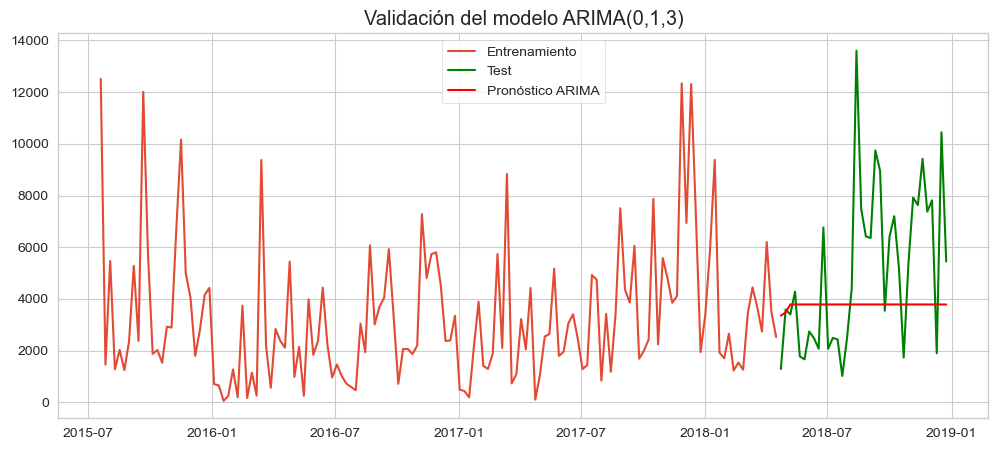

In [428]:
plt.figure(figsize=(12,5))
plt.plot(train_data.index, train_data, label='Entrenamiento')
plt.plot(test_data.index, test_data, label='Test', color='green')
plt.plot(forecastval.index, forecastval, label='Pronóstico ARIMA', color='red')
plt.legend()
plt.title(f"Validación del modelo ARIMA({p},{d},{q})")
plt.show()


In [429]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse_arima = mean_squared_error(test_data, forecastval)
mae_arima = mean_absolute_error(test_data, forecastval)
rmse_arima = np.sqrt(mse_arima)

print(f"ARIMA - RMSE: {rmse_arima:.2f}, MAE: {mae_arima:.2f}")

ARIMA - RMSE: 3336.48, MAE: 2664.12


__SARIMA__

SARIMA (Seasonal AutoRegressive Integrated Moving Average) es un modelo estadístico usado para analizar y predecir series temporales que tienen tendencia y estacionalidad.

Descomposición del nombre SARIMA

SARIMA se compone de dos partes:

ARIMA(p, d, q) → Modelo básico:

AR (Autoregresivo, p): La serie depende de sus valores pasados.

I (Integrado, d): Se usa diferenciación para hacer la serie estacionaria.

MA (Media móvil, q): Usa errores pasados para mejorar la predicción.

Parte estacional (P, D, Q, m) → Para capturar patrones repetitivos en la serie:

P (Orden autorregresivo estacional)

D (Diferenciación estacional)

Q (Orden de media móvil estacional)

m (Periodo estacional) → Ejemplo: 12 para datos mensuales, 4 para datos trimestrales.

In [430]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima = SARIMAX(train_data,
                       order=(0,1,3),
                       seasonal_order=(2,1,1,52), 
                       enforce_stationarity=False,
                       enforce_invertibility=False)
results_sarima = model_sarima.fit()
print(results_sarima.summary())


forecast_sarima = results_sarima.forecast(steps=len(test_data))

                                      SARIMAX Results                                       
Dep. Variable:                      Office Supplies   No. Observations:                  144
Model:             SARIMAX(0, 1, 3)x(2, 1, [1], 52)   Log Likelihood                   0.000
Date:                              Tue, 27 May 2025   AIC                             14.000
Time:                                      18:41:55   BIC                                nan
Sample:                                  07-20-2015   HQIC                               nan
                                       - 04-16-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7230         -0        inf      0.000      -0.723      -0.723
ma.L2         -0.05

Ajustamos el modelo con el mejor modelo con los criterios de AIC y BIC

In [351]:
import itertools
import statsmodels.api as sm

p = q = range(0, 3)   # Autoregresivo y media móvil
d = range(0, 2)       # Diferenciación
s = [12, 26, 52]          # Prueba diferentes periodos estacionales

seasonal_pdq = list(itertools.product(p, d, q, s))

best_aic = float("inf")
best_bic = float("inf")
best_order_aic = None
best_order_bic = None

for param_seasonal in seasonal_pdq:
    try:
        model = sm.tsa.statespace.SARIMAX(train_data,
                                          order=(2,1,1),  # Puedes optimizar también estos parámetros
                                          seasonal_order=param_seasonal,
                                          enforce_stationarity=False,
                                          enforce_invertibility=False)
        results = model.fit()
        
        aic = results.aic
        bic = results.bic

        print(f"Probando {param_seasonal} - AIC: {aic} - BIC: {bic}")

        if aic < best_aic:
            best_aic = aic
            best_order_aic = param_seasonal
        
        if bic < best_bic:
            best_bic = bic
            best_order_bic = param_seasonal

    except:
        continue

print(f"\nMejor seasonal_order según AIC: {best_order_aic} con AIC {best_aic}")
print(f"Mejor seasonal_order según BIC: {best_order_bic} con BIC {best_bic}")

Probando (0, 0, 0, 12) - AIC: 2618.226751048838 - BIC: 2630.0217906103508
Probando (0, 0, 0, 26) - AIC: 2618.226751048838 - BIC: 2630.0217906103508
Probando (0, 0, 0, 52) - AIC: 2618.226751048838 - BIC: 2630.0217906103508
Probando (0, 0, 1, 12) - AIC: 2380.4610240971624 - BIC: 2394.760086118971
Probando (0, 0, 1, 26) - AIC: 2122.5255234554115 - BIC: 2136.2501840972277
Probando (0, 0, 1, 52) - AIC: 1642.5793194387963 - BIC: 1655.022501287457
Probando (0, 0, 2, 12) - AIC: 2159.234086840238 - BIC: 2175.8071304490245
Probando (0, 0, 2, 26) - AIC: 1643.7669925744178 - BIC: 1658.6988107928107
Probando (0, 0, 2, 52) - AIC: 703.898402685444 - BIC: 713.5639101613093
Probando (0, 1, 0, 12) - AIC: 2471.127820624077 - BIC: 2482.5670702415237
Probando (0, 1, 0, 26) - AIC: 2203.3657102469815 - BIC: 2214.3454387604347
Probando (0, 1, 0, 52) - AIC: 1679.8022512367825 - BIC: 1689.756796715711
Probando (0, 1, 1, 12) - AIC: 2177.7505437273903 - BIC: 2191.561413401379
Probando (0, 1, 1, 26) - AIC: 1652.13

__Modelo SARIMA (0,1,2)(0,1,1,52)__

In [303]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima = SARIMAX(train_data,
                       order=(0,1,2),
                       seasonal_order=(0,1,1,52),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
results_sarima = model_sarima.fit()
print(results_sarima.summary())

forecast_sarima = results_sarima.forecast(steps=len(test_data))

                                      SARIMAX Results                                       
Dep. Variable:                      Office Supplies   No. Observations:                  144
Model:             SARIMAX(0, 1, 2)x(0, 1, [1], 52)   Log Likelihood                -338.190
Date:                              Tue, 27 May 2025   AIC                            684.380
Time:                                      17:46:40   BIC                            690.714
Sample:                                  07-20-2015   HQIC                           686.591
                                       - 04-16-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7124      0.343     -2.077      0.038      -1.385      -0.040
ma.L2         -0.14

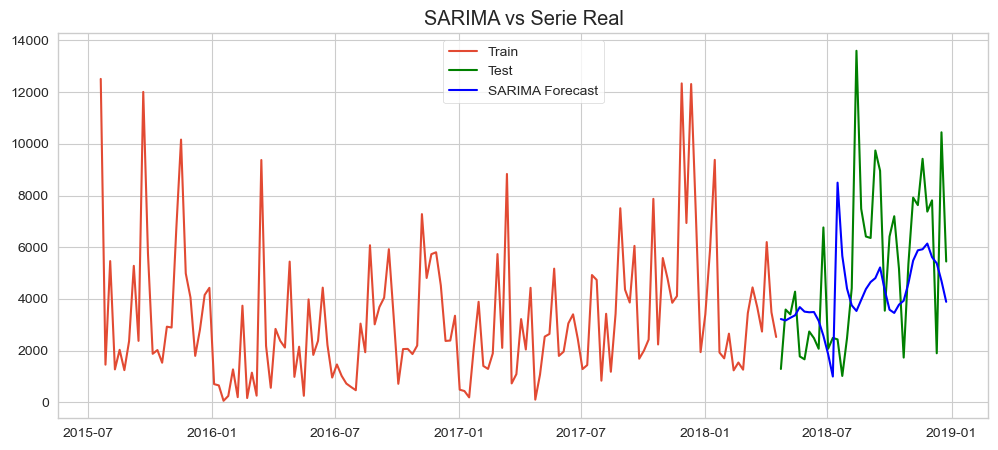

In [304]:
# Gráfico comparativo
plt.figure(figsize=(12,5))
plt.plot(train_data.index, train_data, label='Train')
plt.plot(test_data.index, test_data, label='Test', color='g')
plt.plot(test_data.index, forecast_sarima, label='SARIMA Forecast', color='b')
plt.title("SARIMA vs Serie Real")
plt.legend()
plt.show()


In [305]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse_arima = mean_squared_error(test_data, forecastval)
mae_arima = mean_absolute_error(test_data, forecastval)
rmse_arima = np.sqrt(mse_arima) 

mse_sarima1 = mean_squared_error(test_data, forecast_sarima)
mae_sarima1 = mean_absolute_error(test_data, forecast_sarima)
rmse_sarima1 = np.sqrt(mse_sarima1) 

print(f"ARIMA - RMSE: {rmse_arima:.2f}, MAE: {mae_arima:.2f}")
print(f"SARIMA - RMSE: {rmse_sarima1:.2f}, MAE: {mae_sarima1:.2f}")


ARIMA - RMSE: 3336.48, MAE: 2664.12
SARIMA - RMSE: 3168.55, MAE: 2467.50


__Comparación por el criterio de AIC y BIC de un ARIMA simple y del Modelo SARIMA__

Vamos a iterar durante horas para seleccionar el mejor modelo y ver si mejoramos la estimación. Realizar una prueba en bruto eligiendo cuidadosamente los Hiperparámetros con todo el análisis anterior.

In [355]:
import itertools
import statsmodels.api as sm
import pandas as pd

p = q = range(0, 3)  
d = range(0, 2)      
P = Q = range(0, 3)  
D = range(0, 2)      
s = [12, 26, 52]     

pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, s))

best_models = []
train_size = int(len(df_ventas_resample_semanal[['Office Supplies']])*0.8)
train_data = df_ventas_resample_semanal[['Office Supplies']][:train_size]
test_data = df_ventas_resample_semanal[['Office Supplies']][train_size:]
for order in pdq:
    for seasonal_order in seasonal_pdq:
        try:
            model = SARIMAX(train_data,
                            order=order,
                            seasonal_order=seasonal_order,
                            enforce_stationarity=False,
                            enforce_invertibility=False)
            results = model.fit()

            aic = results.aic
            bic = results.bic

            
            best_models.append((order, seasonal_order, aic, bic))

            print(f"Probando SARIMA{order}x{seasonal_order} - AIC: {aic:.2f} - BIC: {bic:.2f}")

        except Exception as e:
            print(f"Error en SARIMA{order}x{seasonal_order}: {e}")
            continue

results_df = pd.DataFrame(best_models, columns=['Order', 'Seasonal_Order', 'AIC', 'BIC'])

best_aic_models = results_df.nsmallest(10, 'AIC')
best_bic_models = results_df.nsmallest(10, 'BIC')

print("\n Top 10 modelos por AIC:")
print(best_aic_models)

print("\n Top 10 modelos por BIC:")
print(best_bic_models)


best_order_aic = best_aic_models.iloc[0]['Order']
best_seasonal_order_aic = best_aic_models.iloc[0]['Seasonal_Order']
print(f"\n Mejor modelo según AIC: SARIMA{best_order_aic}x{best_seasonal_order_aic}")


best_order_bic = best_bic_models.iloc[0]['Order']
best_seasonal_order_bic = best_bic_models.iloc[0]['Seasonal_Order']
print(f"\n Mejor modelo según BIC: SARIMA{best_order_bic}x{best_seasonal_order_bic}")


Probando SARIMA(0, 0, 0)x(0, 0, 0, 12) - AIC: 2785.00 - BIC: 2787.96
Probando SARIMA(0, 0, 0)x(0, 0, 0, 26) - AIC: 2785.00 - BIC: 2787.96
Probando SARIMA(0, 0, 0)x(0, 0, 0, 52) - AIC: 2785.00 - BIC: 2787.96
Probando SARIMA(0, 0, 0)x(0, 0, 1, 12) - AIC: 2508.24 - BIC: 2513.99
Probando SARIMA(0, 0, 0)x(0, 0, 1, 26) - AIC: 2260.12 - BIC: 2265.65
Probando SARIMA(0, 0, 0)x(0, 0, 1, 52) - AIC: 1741.46 - BIC: 1746.48
Probando SARIMA(0, 0, 0)x(0, 0, 2, 12) - AIC: 2255.79 - BIC: 2264.13
Probando SARIMA(0, 0, 0)x(0, 0, 2, 26) - AIC: 1734.19 - BIC: 1741.72
Probando SARIMA(0, 0, 0)x(0, 0, 2, 52) - AIC: 752.48 - BIC: 757.47
Probando SARIMA(0, 0, 0)x(0, 1, 0, 12) - AIC: 2507.88 - BIC: 2510.75
Probando SARIMA(0, 0, 0)x(0, 1, 0, 26) - AIC: 2232.58 - BIC: 2235.34
Probando SARIMA(0, 0, 0)x(0, 1, 0, 52) - AIC: 1707.77 - BIC: 1710.28
Probando SARIMA(0, 0, 0)x(0, 1, 1, 12) - AIC: 2215.50 - BIC: 2221.05
Probando SARIMA(0, 0, 0)x(0, 1, 1, 26) - AIC: 1699.69 - BIC: 1704.71
Probando SARIMA(0, 0, 0)x(0, 1, 1, 5

__Modelo SARIMA (0,0,0)(0,1,1,52)__

In [309]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima2 = SARIMAX(train_data,
                       order=(0,0,0),
                       seasonal_order=(0,1,1,52),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
results_sarima2 = model_sarima2.fit()
print(results_sarima2.summary())

forecast_sarima2 = results_sarima2.forecast(steps=len(test_data))

                                 SARIMAX Results                                  
Dep. Variable:            Office Supplies   No. Observations:                  144
Model:             SARIMAX(0, 1, [1], 52)   Log Likelihood                -373.299
Date:                    Tue, 27 May 2025   AIC                            750.597
Time:                            18:31:38   BIC                            753.924
Sample:                        07-20-2015   HQIC                           751.791
                             - 04-16-2018                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.S.L52      -0.1422      0.367     -0.388      0.698      -0.861       0.576
sigma2      1.206e+07   2.24e+06      5.388      0.000    7.67e+06    1.64e+07
Ljung-Box (L1) (Q): 

__Modelo SARIMA (0,1,2)(0,1,1,52)__

In [310]:
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima3 = SARIMAX(train_data,
                       order=(0,1,2),
                       seasonal_order=(0,1,1,52),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
results_sarima3 = model_sarima3.fit()
print(results_sarima3.summary())

forecast_sarima3 = results_sarima3.forecast(steps=len(test_data))

                                      SARIMAX Results                                       
Dep. Variable:                      Office Supplies   No. Observations:                  144
Model:             SARIMAX(0, 1, 2)x(0, 1, [1], 52)   Log Likelihood                -338.190
Date:                              Tue, 27 May 2025   AIC                            684.380
Time:                                      18:31:43   BIC                            690.714
Sample:                                  07-20-2015   HQIC                           686.591
                                       - 04-16-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7124      0.343     -2.077      0.038      -1.385      -0.040
ma.L2         -0.14

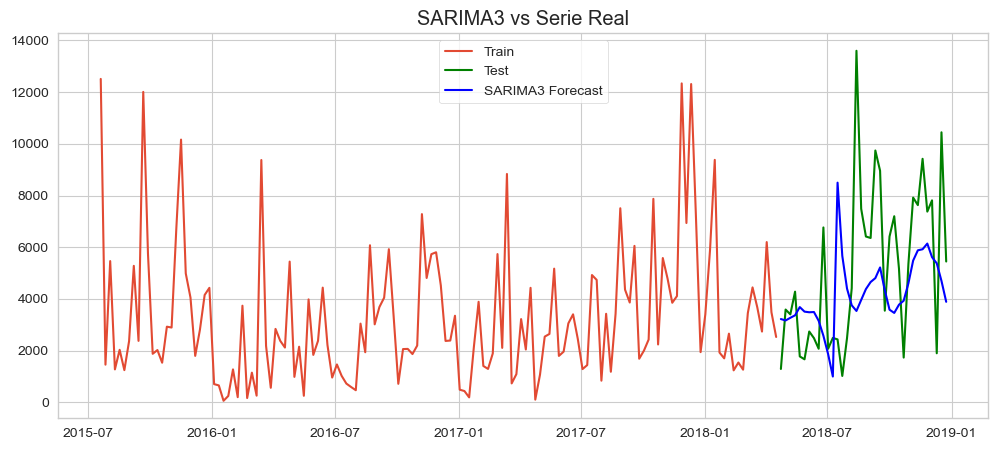

In [311]:

plt.figure(figsize=(12,5))
plt.plot(train_data.index, train_data, label='Train')
plt.plot(test_data.index, test_data, label='Test', color='g')
plt.plot(test_data.index, forecast_sarima3, label='SARIMA3 Forecast', color='b')
plt.title("SARIMA3 vs Serie Real")
plt.legend()
plt.show()



In [312]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mse_arima = mean_squared_error(test_data, forecastval)
rmse_arima= np.sqrt(mse_arima)
mae_arima = mean_absolute_error(test_data, forecastval)
mape_arima = mean_absolute_percentage_error(test_data, forecastval)

mse_sarima1 = mean_squared_error(test_data, forecast_sarima)
rmse_sarima1 = np.sqrt(mse_sarima1)
mae_sarima1 = mean_absolute_error(test_data, forecast_sarima)
mape_sarima = mean_absolute_percentage_error(test_data, forecast_sarima)

mse_sarima3 = mean_squared_error(test_data, forecast_sarima3)
rmse_sarima3 = np.sqrt(mse_sarima3)
mae_sarima3 = mean_absolute_error(test_data, forecast_sarima3)
mape_sarima3 = mean_absolute_percentage_error(test_data, forecast_sarima3)

print(f"ARIMA - RMSE: {rmse_arima:.2f}, MAE: {mae_arima:.2f}" )
print(f"SARIMA - RMSE: {rmse_sarima1:.2f}, MAE: {mae_sarima1:.2f}")
print(f"SARIMA3 - RMSE: {rmse_sarima3:.2f}, MAE: {mae_sarima3:.2f}")

ARIMA - RMSE: 3336.48, MAE: 2664.12
SARIMA - RMSE: 3168.55, MAE: 2467.50
SARIMA3 - RMSE: 3168.55, MAE: 2467.50


#### __Modelos supervisados aplicados a series temporales.__ ####

##### __Random forest Regressor__ #####

El Random Forest Regressor es un algoritmo de aprendizaje automático basado en la técnica de ensemble learning. Se utiliza para tareas de regresión y funciona construyendo múltiples árboles de decisión y promediando sus predicciones para mejorar la precisión y reducir el sobreajuste.

Bagging (bootstrap Aggregating): El mecanismo de funcionamiento es que se crean múltiples subconjuntos aleatorios del conjunto de datos de entrenamiento con reemplazo, es decir que se vuelve a repetir el valor.
La predicción final es el promedio de los árboles (regresión).
A la hora de realizar el ajuste hay que tener en cuenta los siguientes hiperparámetros importantes:

Hiperparámetros importantes:

n_estimators: Número de árboles en el bosque.

n_estimators: [50, 100, 200, 400, 600, 800, 1000]

max_depth: Profundidad máxima de cada árbol (controla la complejidad).

max_depth: [5, 10, 20, 40, 60, 80, 100, 1000]

min_samples_split: Mínimo de muestras necesarias para dividir un nodo.

min_samples_split: [2, 5, 10, 15, 20, 30, 40, 100]

min_samples_leaf: Muestras mínimas necesarias en una hoja.

min_samples_leaf: [1, 2, 4, 5, 7, 10, 20, 30]

max_features: Número de características consideradas en cada división.

max_features: ['sqrt', 'log2']


 Top 10 Modelos probados:
                                                 params  mean_test_score  \
385   {'max_depth': 5, 'max_features': 'sqrt', 'min_...      1774.130728   
329   {'max_depth': 5, 'max_features': 'sqrt', 'min_...      1774.130728   
4585  {'max_depth': 80, 'max_features': 'sqrt', 'min...      1774.130728   
4529  {'max_depth': 80, 'max_features': 'sqrt', 'min...      1774.130728   
4473  {'max_depth': 60, 'max_features': 'log2', 'min...      1774.130728   
1281  {'max_depth': 10, 'max_features': 'sqrt', 'min...      1774.130728   
4417  {'max_depth': 60, 'max_features': 'log2', 'min...      1774.130728   
4361  {'max_depth': 60, 'max_features': 'log2', 'min...      1774.130728   
4305  {'max_depth': 60, 'max_features': 'log2', 'min...      1774.130728   
4641  {'max_depth': 80, 'max_features': 'sqrt', 'min...      1774.130728   

      mean_train_score  rank_test_score  
385        1710.445417                1  
329        1710.445417                1  
4585      

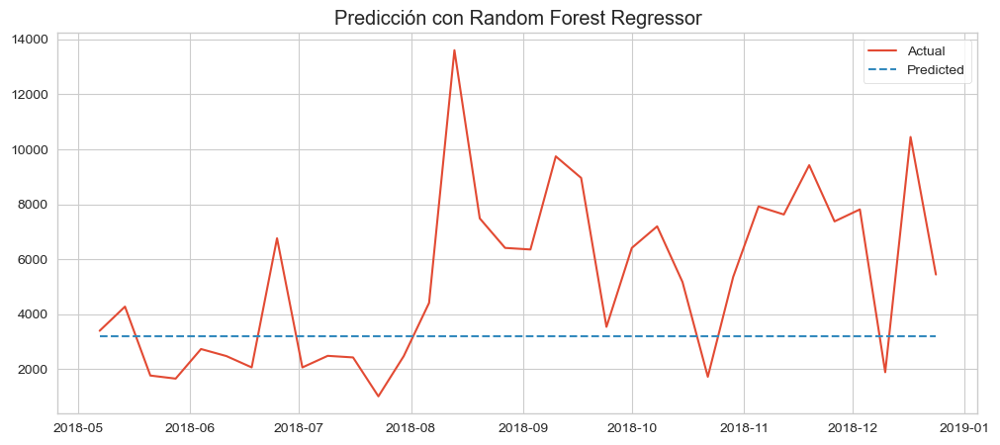

In [360]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

def create_lag_features(data, lags=12):
    for lag in range(1, lags + 1):
        data[f'lag_{lag}'] = data['Office Supplies'].shift(lag)
    return data

df = create_lag_features(df)
df = df.dropna() 

train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

X_train, y_train = train.drop(columns=['Office Supplies']), train['Office Supplies']
X_test, y_test = test.drop(columns=['Office Supplies']), test['Office Supplies']


rf = RandomForestRegressor(random_state=42)


param_grid = {
    'n_estimators': [50, 100, 200, 400, 600, 800, 1000],
    'max_depth': [5, 10, 20, 40, 60, 80, 100, 1000],
    'min_samples_split': [2, 5, 10, 15, 20, 30, 40, 100],
    'min_samples_leaf': [1, 2, 4, 5, 7, 10, 20, 30],
    'max_features': ['sqrt', 'log2']
}

tscv = TimeSeriesSplit(n_splits=3)
grid_search = GridSearchCV(rf, param_grid, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1, return_train_score=True)
grid_search.fit(X_train, y_train)

results = pd.DataFrame(grid_search.cv_results_)

results = results[['params', 'mean_test_score', 'mean_train_score', 'rank_test_score']]
results['mean_test_score'] = -results['mean_test_score']  # Convertir a MAE positivo
results['mean_train_score'] = -results['mean_train_score']

results = results.sort_values(by='mean_test_score')

print("\n Top 10 Modelos probados:")
print(results.head(10))

best_rf = grid_search.best_estimator_

y_pred = best_rf.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'\n Mejor Modelo - MAE: {mae:.2f}, RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted', linestyle='dashed')
plt.title("Predicción con Random Forest Regressor")
plt.legend()
plt.show()



 Mejor Modelo - MAE: 2894.49, RMSE: 3715.27


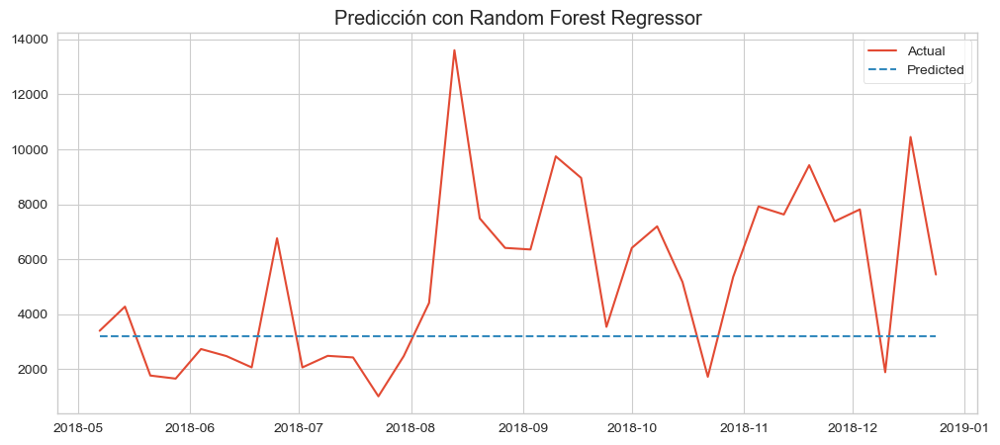

In [361]:
y_pred = best_rf.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'\n Mejor Modelo - MAE: {mae:.2f}, RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(test.index, y_test, label='Actual')
plt.plot(test.index, y_pred, label='Predicted', linestyle='dashed')
plt.title("Predicción con Random Forest Regressor")
plt.legend()
plt.show()


In [362]:
import pandas as pd

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 0)

results_df = pd.DataFrame(results)
print(results_df[['params', 'mean_test_score', 'mean_train_score', 'rank_test_score']])


                                                                                                               params  \
385    {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 20, 'min_samples_split': 100, 'n_estimators': 50}   
329    {'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 100, 'n_estimators': 50}   
4585   {'max_depth': 80, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 100, 'n_estimators': 50}   
4529   {'max_depth': 80, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 100, 'n_estimators': 50}   
4473  {'max_depth': 60, 'max_features': 'log2', 'min_samples_leaf': 30, 'min_samples_split': 100, 'n_estimators': 50}   
...                                                                                                               ...   
6734  {'max_depth': 1000, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}   
4942    {'max_depth': 80, 'max_f

##### __Gradient Boosting__ #####

El Gradient Boosting es una técnica de aprendizaje automático que se utiliza para el análisis de la regresión. Funciona mediante la creación de árboles de decisión secuenciales. Cada árbol de decisión se enfoca en corregir los errores del modelo anterior. Al combinar estos modelos débiles, Gradient Boosting crea un modelo más fuerte y preciso que puede ser utilizado para tareas de regresión como la que queremos utilizar.

n_estimators_list Controla cuántos árboles se crean en el modelo.

n_estimators_list = [100, 200, 500, 1000]

learning_rate_list Determina cuánto contribuye cada árbol nuevo a la predicción final. Valores bajos evitan el sobreajuste pero requieren más árboles.

learning_rate_list = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

max_depth_list controla profundidad máxima de los árboles.

max_depth_list = [3, 5, 7, 9, 11, 13, 14]

subsample_list Reduce el sobreajuste al entrenar cada árbol con un subconjunto aleatorio. Un valor de 1.0 usa todos los datos; valores más bajos reducen el sobreajuste.

subsample_list = [0.7, 0.8, 1.0]

min_samples_split_list Controla la profundidad y complejidad de los árboles. Evita que se creen nodos demasiado pequeños y mejora la generalización.

min_samples_split_list = [2, 5, 10, 20, 30]

In [363]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])


def create_lag_features(data, lags=52):
    X, y = [], []
    for i in range(len(data) - lags):
        X.append(data[i:i+lags])
        y.append(data[i+lags])
    return np.array(X), np.array(y)

lags = 52
X, y = create_lag_features(df['Office Supplies'].values, lags)


train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

n_estimators_list = [100, 200, 500, 1000]
learning_rate_list = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
max_depth_list = [3, 5, 7, 9, 11, 13, 14]
subsample_list = [0.7, 0.8, 1.0]
min_samples_split_list = [2, 5, 10, 20, 30]

best_mae = float('inf')
best_model = None
best_params = {}

for n_estimators in n_estimators_list:
    for learning_rate in learning_rate_list:
        for max_depth in max_depth_list:
            for subsample in subsample_list:
                for min_samples_split in min_samples_split_list:
                    print(f" Probando GB({n_estimators}, {learning_rate}, {max_depth}, {subsample}, {min_samples_split})")
                    
                    model = GradientBoostingRegressor(
                        n_estimators=n_estimators,
                        learning_rate=learning_rate,
                        max_depth=max_depth,
                        subsample=subsample,
                        min_samples_split=min_samples_split,
                        random_state=42
                    )

                    model.fit(X_train, y_train)
                    y_pred = model.predict(X_test)
                    
                    y_pred_real = scaler.inverse_transform(y_pred.reshape(-1, 1))
                    y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
                    
                    mae = mean_absolute_error(y_test_real, y_pred_real)
                    print(f"🔹 MAE: {mae:.4f}")
                    
                    if mae < best_mae:
                        best_mae = mae
                        best_model = model
                        best_params = {
                            'n_estimators': n_estimators,
                            'learning_rate': learning_rate,
                            'max_depth': max_depth,
                            'subsample': subsample,
                            'min_samples_split': min_samples_split
                        }

print(f"\n Mejor modelo encontrado: {best_params}, MAE: {best_mae:.4f}")


 Probando GB(100, 0.01, 3, 0.7, 2)
🔹 MAE: 2806.6698
 Probando GB(100, 0.01, 3, 0.7, 5)
🔹 MAE: 2829.6294
 Probando GB(100, 0.01, 3, 0.7, 10)
🔹 MAE: 2837.0679
 Probando GB(100, 0.01, 3, 0.7, 20)
🔹 MAE: 2853.2973
 Probando GB(100, 0.01, 3, 0.7, 30)
🔹 MAE: 2860.2513
 Probando GB(100, 0.01, 3, 0.8, 2)
🔹 MAE: 2877.0903
 Probando GB(100, 0.01, 3, 0.8, 5)
🔹 MAE: 2878.2582
 Probando GB(100, 0.01, 3, 0.8, 10)
🔹 MAE: 2901.9879
 Probando GB(100, 0.01, 3, 0.8, 20)
🔹 MAE: 2916.9994
 Probando GB(100, 0.01, 3, 0.8, 30)
🔹 MAE: 2914.3287
 Probando GB(100, 0.01, 3, 1.0, 2)
🔹 MAE: 2829.4688
 Probando GB(100, 0.01, 3, 1.0, 5)
🔹 MAE: 2841.8129
 Probando GB(100, 0.01, 3, 1.0, 10)
🔹 MAE: 2861.0572
 Probando GB(100, 0.01, 3, 1.0, 20)
🔹 MAE: 2891.9945
 Probando GB(100, 0.01, 3, 1.0, 30)
🔹 MAE: 2957.8846
 Probando GB(100, 0.01, 5, 0.7, 2)
🔹 MAE: 2786.2758
 Probando GB(100, 0.01, 5, 0.7, 5)
🔹 MAE: 2752.9267
 Probando GB(100, 0.01, 5, 0.7, 10)
🔹 MAE: 2807.9670
 Probando GB(100, 0.01, 5, 0.7, 20)
🔹 MAE: 2818.4216
 


Evaluación del Mejor Gradient Boosting:
MAE: 2117.18
RMSE: 3050.96


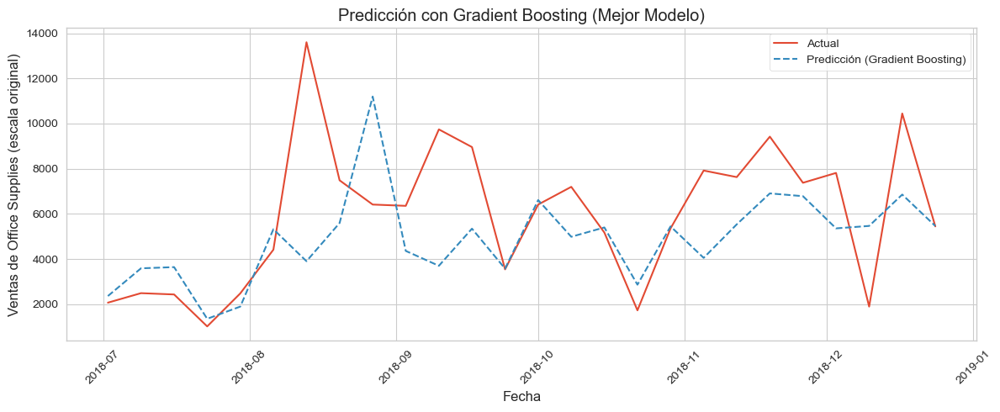

In [436]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])

def create_lag_features(data, lags=52):
    X, y = [], []
    for i in range(len(data) - lags):
        X.append(data[i:i+lags])
        y.append(data[i+lags])
    return np.array(X), np.array(y)

lags = 52

X, y = create_lag_features(df['Office Supplies'].values, lags)

train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]


fechas_y = df.index[lags:]
fechas_y_test = fechas_y[train_size:]


best_model = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.5,
    max_depth=3,
    subsample=0.7,
    min_samples_split=20,
    random_state=42
)
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)
y_pred_real = scaler.inverse_transform(y_pred.reshape(-1, 1))
y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))

mae = mean_absolute_error(y_test_real, y_pred_real)
rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))

print(f'\nEvaluación del Mejor Gradient Boosting:')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(fechas_y_test, y_test_real, label='Actual')
plt.plot(fechas_y_test, y_pred_real, label='Predicción (Gradient Boosting)', linestyle='dashed')
plt.title("Predicción con Gradient Boosting (Mejor Modelo)")
plt.xlabel("Fecha")
plt.ylabel("Ventas de Office Supplies (escala original)")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


##### __MLP Multi-Layer Perceptron__ #####

Los MLP es una red neuronal artificial ampliamente utilizada para resolver tareas de clasificación y regresión. MLP consta de capas densas totalmente conectadas que transforman los datos de entrada de una dimensión a otra. Se llama "multicapa" porque contiene una capa de entrada, una o más capas ocultas y una capa de salida. 

En un primer momento tenemos que normalizar los datos con MinMaxScaler para mejorar la convergencia del MLP. 

Creamos características de retraso (lags) para convertir la serie en un problema supervisado. 

Definimos un MLP con 2 capas ocultas de 50 neuronas cada una. Además hacemos una prueba con un modelo algo más complejo y profundo con capas más profundas (100,100,50) 

Entrenamos el modelo y hacemos predicciones. Desescalamos los valores para interpretarlos correctamente. 


In [365]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])

def create_lag_features(data, lags=52):
    for lag in range(1, lags + 1):
        data[f'lag_{lag}'] = data['Office Supplies'].shift(lag)
    return data

df = create_lag_features(df)
df = df.dropna()

train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

X_train, y_train = train.drop(columns=['Office Supplies']), train['Office Supplies']
X_test, y_test = test.drop(columns=['Office Supplies']), test['Office Supplies']

param_grid = {
    'hidden_layer_sizes': [(50, ), (100,), (50, 50), (100, 50)],  # Diferentes configuraciones de capas
    'activation': ['relu', 'tanh', 'logistic'],  # Funciones de activación
    'solver': ['adam', 'sgd'],  # Algoritmos de optimización
    'alpha': [0.0001, 0.001, 0.01],  # Regularización
    'learning_rate': ['constant', 'adaptive'],  # Estrategia de aprendizaje
    'max_iter': [500]  # Iteraciones fijas para cada modelo
}


tscv = TimeSeriesSplit(n_splits=3)


mlp = MLPRegressor(random_state=42)

grid_search = GridSearchCV(mlp, param_grid, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

results = pd.DataFrame(grid_search.cv_results_)
results = results[['params', 'mean_test_score']]
results['mean_test_score'] = -results['mean_test_score']  # Convertimos en MAE positivo

results = results.sort_values(by='mean_test_score')

print("\n Top 10 Modelos probados:")
print(results.head(10))

best_model = grid_search.best_estimator_

print(f"\n Mejor modelo encontrado: {grid_search.best_params_}")


 Top 10 Modelos probados:
                                                                                                                                          params  \
136    {'activation': 'logistic', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'max_iter': 500, 'solver': 'adam'}   
138    {'activation': 'logistic', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'adaptive', 'max_iter': 500, 'solver': 'adam'}   
122   {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'adaptive', 'max_iter': 500, 'solver': 'adam'}   
120   {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'max_iter': 500, 'solver': 'adam'}   
104  {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'max_iter': 500, 'solver': 'adam'}   
106  {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50), 'lea


 Evaluación del Mejor Modelo:
MAE: 3554.15
RMSE: 4385.84


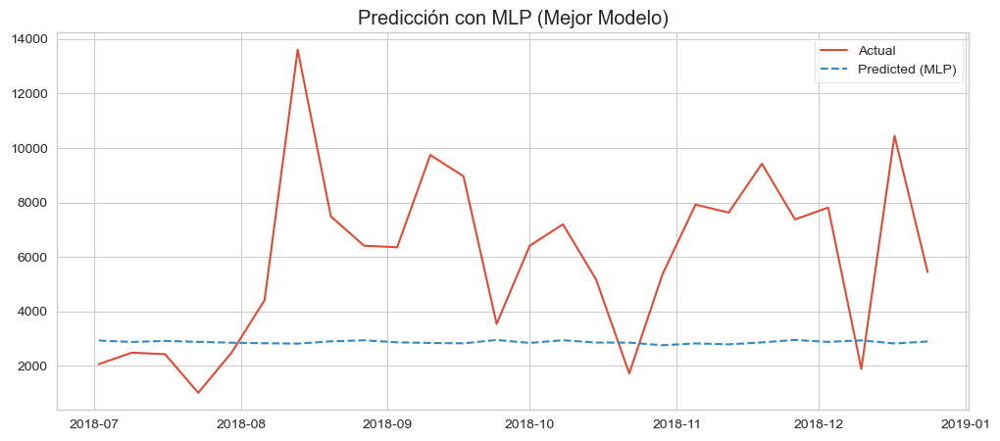

In [366]:
y_pred = best_model.predict(X_test)

y_test_real = scaler.inverse_transform(y_test.values.reshape(-1, 1))
y_pred_real = scaler.inverse_transform(y_pred.reshape(-1, 1))


mae = mean_absolute_error(y_test_real, y_pred_real)
rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))

print(f'\n Evaluación del Mejor Modelo:')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(test.index, y_test_real, label='Actual')
plt.plot(test.index, y_pred_real, label='Predicted (MLP)', linestyle='dashed')
plt.title("Predicción con MLP (Mejor Modelo)")
plt.legend()
plt.show()

In [367]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])

def create_lag_features(data, lags=12):
    for lag in range(1, lags + 1):
        data[f'lag_{lag}'] = data['Office Supplies'].shift(lag)
    return data

df = create_lag_features(df)
df = df.dropna()


train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

X_train, y_train = train.drop(columns=['Office Supplies']), train['Office Supplies']
X_test, y_test = test.drop(columns=['Office Supplies']), test['Office Supplies']

param_grid = {
    'hidden_layer_sizes': [(50, ), (100,), (50, 50), (100, 50), (100,100,50)],  # Diferentes configuraciones de capas
    'activation': ['relu', 'tanh', 'logistic'],  # Funciones de activación
    'solver': ['adam', 'sgd'],  # Algoritmos de optimización
    'alpha': [0.0001, 0.001, 0.01],  # Regularización
    'learning_rate': ['constant', 'adaptive'],  # Estrategia de aprendizaje
    'max_iter': [1000000]  # Iteraciones fijas para cada modelo
}

tscv = TimeSeriesSplit(n_splits=3)

mlp = MLPRegressor(random_state=42)

grid_search = GridSearchCV(mlp, param_grid, cv=tscv, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

results = pd.DataFrame(grid_search.cv_results_)
results = results[['params', 'mean_test_score']]
results['mean_test_score'] = -results['mean_test_score']  

results = results.sort_values(by='mean_test_score')


print("\n Top 10 Modelos probados:")
print(results.head(10))

best_model = grid_search.best_estimator_

print(f"\n Mejor modelo encontrado: {grid_search.best_params_}")


 Top 10 Modelos probados:
                                                                                                                                               params  \
17   {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 100, 50), 'learning_rate': 'constant', 'max_iter': 1000000, 'solver': 'sgd'}   
37    {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100, 100, 50), 'learning_rate': 'constant', 'max_iter': 1000000, 'solver': 'sgd'}   
57     {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (100, 100, 50), 'learning_rate': 'constant', 'max_iter': 1000000, 'solver': 'sgd'}   
39    {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (100, 100, 50), 'learning_rate': 'adaptive', 'max_iter': 1000000, 'solver': 'sgd'}   
19   {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 100, 50), 'learning_rate': 'adaptive', 'max_iter': 1000000, 'solver': 'sgd'}   
59     {'activation': 'relu', 'alpha': 0.01, 'hidden_la


 Evaluación del Mejor Modelo:
MAE: 2513.93
RMSE: 3260.02


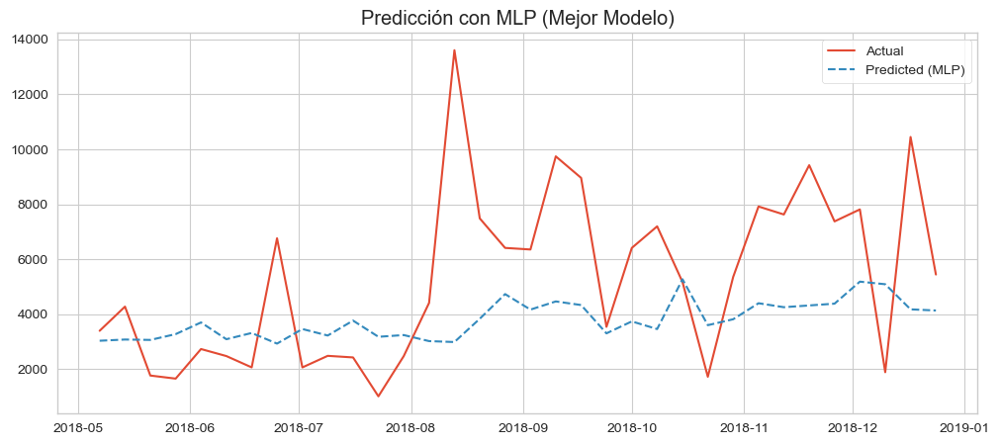

In [368]:
y_pred = best_model.predict(X_test)

y_test_real = scaler.inverse_transform(y_test.values.reshape(-1, 1))
y_pred_real = scaler.inverse_transform(y_pred.reshape(-1, 1))

mae = mean_absolute_error(y_test_real, y_pred_real)
rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))

print(f'\n Evaluación del Mejor Modelo:')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(test.index, y_test_real, label='Actual')
plt.plot(test.index, y_pred_real, label='Predicted (MLP)', linestyle='dashed')
plt.title("Predicción con MLP (Mejor Modelo)")
plt.legend()
plt.show()

##### __LSTM Long short-term memory__ #####

Las redes de memoria a corto y largo plazo, generalmente llamadas «LSTM», son un tipo especial de RNR, capaces de aprender dependencias a largo plazo.

In [369]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()


scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])

def create_sequences(data, lags=12):
    X, y = [], []
    for i in range(len(data) - lags):
        X.append(data[i:i+lags])
        y.append(data[i+lags])
    return np.array(X), np.array(y)

lags = 12
X, y = create_sequences(df['Office Supplies'].values, lags)


train_size = int(len(X) * 0.8)
X_train, y_train = X[:train_size], y[:train_size]
X_test, y_test = X[train_size:], y[train_size:]

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

fechas = df.index[lags:] 
fechas_test = fechas[train_size:]

lstm_units = [50, 100, 200]
learning_rates = [0.001, 0.01, 0.1]
best_mae = float('inf')
best_model = None
best_params = {}

for units in lstm_units:
    for lr in learning_rates:
        print(f" Probando LSTM({units}) con LR={lr}")
        
        model = Sequential([
            LSTM(units, activation='relu', return_sequences=False, input_shape=(lags, 1)),
            Dense(1)
        ])
        model.compile(optimizer=Adam(learning_rate=lr), loss='mae')
        model.fit(X_train, y_train, epochs=50, batch_size=8, verbose=0)
        
        y_pred = model.predict(X_test)
        y_pred_real = scaler.inverse_transform(y_pred)
        y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
        
        mae = mean_absolute_error(y_test_real, y_pred_real)
        print(f" MAE: {mae:.4f}")
        
        if mae < best_mae:
            best_mae = mae
            best_model = model
            best_params = {'units': units, 'lr': lr}

print(f"\n Mejor modelo: {best_params}, MAE: {best_mae:.4f}")

 Probando LSTM(50) con LR=0.001
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
 MAE: 2531.8812
 Probando LSTM(50) con LR=0.01
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
 MAE: 2553.3356
 Probando LSTM(50) con LR=0.1
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/stepWARNING:tensorflow:6 out of the last 6 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002180F567B00> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

 Evaluación del Mejor LSTM:
MAE: 2180.43
RMSE: 3030.76


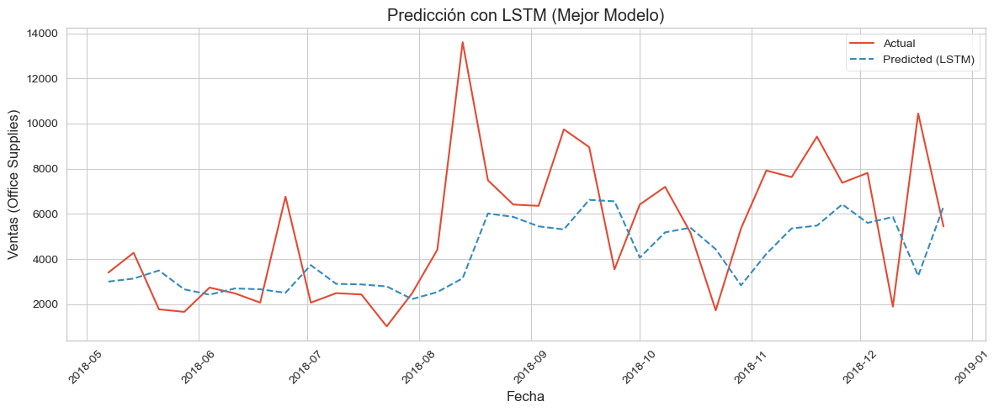

In [370]:
y_pred = best_model.predict(X_test)

y_test_real = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_real = scaler.inverse_transform(y_pred)

rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))
print(f'\n Evaluación del Mejor LSTM:')
print(f'MAE: {best_mae:.2f}')
print(f'RMSE: {rmse:.2f}')

plt.figure(figsize=(12, 5))
plt.plot(fechas_test, y_test_real, label='Actual')
plt.plot(fechas_test, y_pred_real, label='Predicted (LSTM)', linestyle='dashed')
plt.title("Predicción con LSTM (Mejor Modelo)")
plt.xlabel("Fecha")
plt.ylabel("Ventas (Office Supplies)")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

##### __GRU Gated Recurrent Units__ #####

Los GRU son un mecanismo de compuerta en redes neuronales recurrentes. La GRU es como una memoria a largo plazo 
con un mecanismo de compuerta para introducir u olvidar ciertas características, pero carece de vector de contexto o compuerta de salida, lo que resulta que utiliza menos parámetros que la LSTM.

In [371]:
from tensorflow.keras.layers import GRU
from sklearn.preprocessing import MinMaxScaler

scaler_y = MinMaxScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1))  
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1))        

gru_units = [50, 100]
learning_rates = [0.001, 0.01]
best_mae_gru = float('inf')
best_model_gru = None
best_params_gru = {}

for units in gru_units:
    for lr in learning_rates:
        print(f" Probando GRU({units}) con LR={lr}")
        
        model = Sequential([
            GRU(units, activation='relu', return_sequences=False, input_shape=(lags, 1)),
            Dense(1)
        ])
        model.compile(optimizer=Adam(learning_rate=lr), loss='mae')
        model.fit(X_train, y_train_scaled, epochs=50, batch_size=8, verbose=0)
        
        y_pred_scaled = model.predict(X_test)

        # Invertir la transformación solo en la variable objetivo
        y_pred_real = scaler_y.inverse_transform(y_pred_scaled)
        y_test_real = scaler_y.inverse_transform(y_test_scaled)

        mae = mean_absolute_error(y_test_real, y_pred_real)
        print(f" MAE: {mae:.4f}")
        
        if mae < best_mae_gru:
            best_mae_gru = mae
            best_model_gru = model
            best_params_gru = {'units': units, 'lr': lr}

print(f"\n Mejor modelo GRU: {best_params_gru}, MAE: {best_mae_gru:.4f}")

 Probando GRU(50) con LR=0.001
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
 MAE: 0.1722
 Probando GRU(50) con LR=0.01
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
 MAE: 0.1936
 Probando GRU(100) con LR=0.001
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
 MAE: 0.1842
 Probando GRU(100) con LR=0.01
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
 MAE: 0.1854

 Mejor modelo GRU: {'units': 50, 'lr': 0.001}, MAE: 0.1722


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  

 Evaluación del Mejor GRU:
MAE:  0.17
RMSE: 0.24


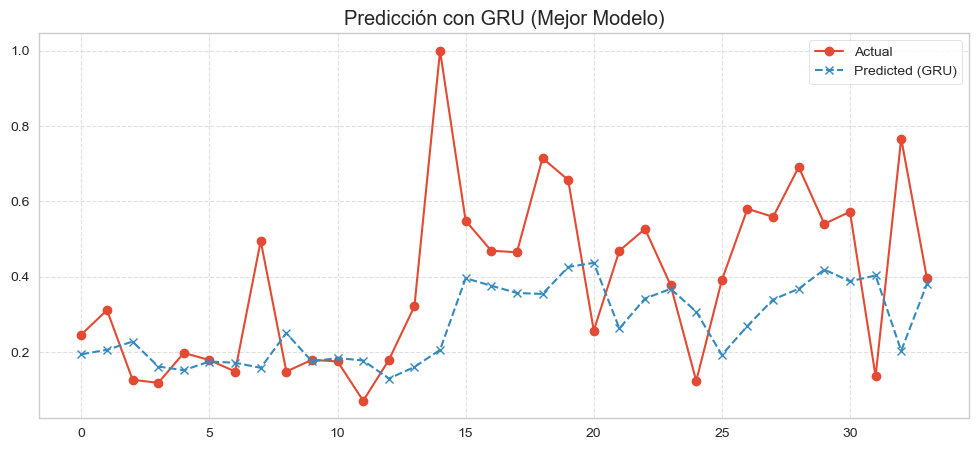

In [372]:
y_pred_scaled = best_model_gru.predict(X_test)

y_test_real = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))  # Desescalamos `y_test`
y_pred_real = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))  # Desescalamos `y_pred`

rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))
mae = mean_absolute_error(y_test_real, y_pred_real)

print(f'\n Evaluación del Mejor GRU:')
print(f'MAE:  {mae:,.2f}')
print(f'RMSE: {rmse:,.2f}')


plt.figure(figsize=(12, 5))
plt.plot(y_test_real, label='Actual', marker='o')
plt.plot(y_pred_real, label='Predicted (GRU)', linestyle='dashed', marker='x')
plt.title("Predicción con GRU (Mejor Modelo)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()


Usando el DataFrame 'df_ventas_resample_semanal' existente.
Forma de X_train: (136, 10, 1)
Forma de y_train: (136,)
Forma de X_test: (34, 10, 1)
Forma de y_test: (34,)
Número de lags: 10

Datos X e y escalados.
Forma de X_train_scaled: (136, 10, 1)
Forma de y_train_scaled: (136, 1)
Forma de X_test_scaled: (34, 10, 1)
Forma de y_test_scaled: (34, 1)

Iniciando búsqueda de hiperparámetros...

Probando GRU(50) con LR=0.001
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
🔹 MAE (escala original): 2337.3652

Probando GRU(50) con LR=0.01
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
🔹 MAE (escala original): 2639.6188

Probando GRU(100) con LR=0.001
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
🔹 MAE (escala original): 2433.2984

Probando GRU(100) con LR=0.01
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
🔹 MAE (escala original): 2354.8586

--- Búsqueda Finalizada ---
Mejor modelo GRU encontrado: {'units': 50, 'lr': 0.001}
Mejor MAE (escala original) durante la búsqueda: 2337.3652

Evaluando el mejor modelo GRU en el conjun

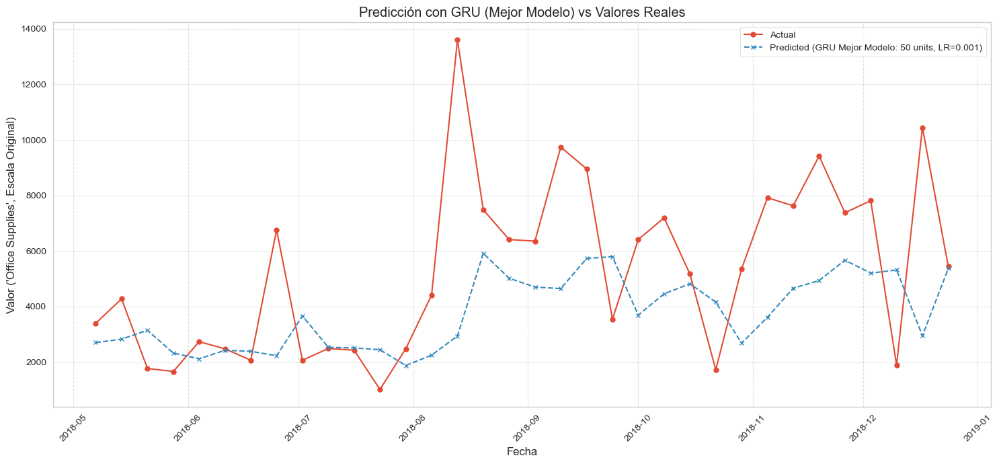


Proceso completado.


In [373]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

try:
    df_ventas_resample_semanal # Intenta acceder a la variable
    print("Usando el DataFrame 'df_ventas_resample_semanal' existente.")
except NameError:
    print("Creando un DataFrame dummy para demostración.")
    dates = pd.date_range(start='2020-01-01', periods=100, freq='W')
    # Simular datos de ventas con alguna tendencia y estacionalidad + ruido
    furniture_sales = np.linspace(10, 100, 100) + 10 * np.sin(np.linspace(0, 10 * np.pi, 100)) + np.random.randn(100) * 5
    furniture_sales = np.maximum(0, furniture_sales) # Asegurar valores no negativos
    df_ventas_resample_semanal = pd.DataFrame({'Office Supplies': OfficeSupplies_sales}, index=dates)

# Extraer la serie temporal que nos interesa
series = df_ventas_resample_semanal[['Office Supplies']].values # Convertir a NumPy array

# Definir el número de lags (ventanas de tiempo)
lags = 10 # Puedes ajustar este valor

# Función para crear el conjunto de datos X (lags) y y (target)
def create_dataset(series, lags=1):
    X, y = [], []
    for i in range(len(series) - lags):
        # X es la ventana de 'lags' valores anteriores
        X.append(series[i:(i + lags), 0]) # [:, 0] porque series es (n_samples, 1)
        # y es el valor inmediatamente siguiente a la ventana
        y.append(series[i + lags, 0])
    # Reshape X para que sea [samples, lags, features] donde features es 1
    return np.array(X), np.array(y)

# Crear los conjuntos de datos con lags
X, y = create_dataset(series, lags)

# Dividir en conjuntos de entrenamiento y prueba (ej. 80% train, 20% test)
train_size = int(len(X) * 0.8)
test_size = len(X) - train_size

X_train, X_test = X[0:train_size], X[train_size:len(X)]
y_train, y_test = y[0:train_size], y[train_size:len(y)]

# Ajustar la forma de X para el modelo GRU: [samples, lags, features]
# Nuestras X ya deberían tener esta forma con create_dataset, pero verificamos
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

print(f"Forma de X_train: {X_train.shape}")
print(f"Forma de y_train: {y_train.shape}")
print(f"Forma de X_test: {X_test.shape}")
print(f"Forma de y_test: {y_test.shape}")
print(f"Número de lags: {lags}")


# --- 2. Escalado de Datos ---
# Escalamos X y y por separado usando MinMaxScaler diferentes.

# Escalado de las características de entrada (X)
# Necesitamos aplanar X para que el scaler lo procese y luego volver a darle la forma original
scaler_X = MinMaxScaler()
# Aplanar: de (samples, lags, 1) a (samples * lags, 1)
X_train_reshaped = X_train.reshape(-1, X_train.shape[-1])
X_test_reshaped = X_test.reshape(-1, X_test.shape[-1])

# Ajustar el scaler a los datos de entrenamiento aplanados y transformar
X_train_scaled_reshaped = scaler_X.fit_transform(X_train_reshaped)
X_test_scaled_reshaped = scaler_X.transform(X_test_reshaped) # Solo transformar en test

# Volver a dar forma a los datos X escalados: de (samples * lags, 1) a (samples, lags, 1)
X_train_scaled = X_train_scaled_reshaped.reshape(X_train.shape)
X_test_scaled = X_test_scaled_reshaped.reshape(X_test.shape)


# Escalado de la variable objetivo (y)
# Usamos un scaler diferente para y
scaler_y = MinMaxScaler()
# y_train y y_test ya tienen la forma (-1, 1) después del reshape
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1))

print("\nDatos X e y escalados.")
print(f"Forma de X_train_scaled: {X_train_scaled.shape}")
print(f"Forma de y_train_scaled: {y_train_scaled.shape}")
print(f"Forma de X_test_scaled: {X_test_scaled.shape}")
print(f"Forma de y_test_scaled: {y_test_scaled.shape}")


# --- 3. Búsqueda de Hiperparámetros para GRU ---

# Definir hiperparámetros a probar
gru_units = [50, 100]
learning_rates = [0.001, 0.01]

best_mae_gru = float('inf')
best_model_gru = None
best_params_gru = {}

print("\nIniciando búsqueda de hiperparámetros...")

# Bucle anidado para probar combinaciones de hiperparámetros
for units in gru_units:
    for lr in learning_rates:
        print(f"\nProbando GRU({units}) con LR={lr}")

        # Definir el modelo secuencial
        model = Sequential([
            # La capa GRU espera entrada con shape (lags, número_de_características)
            # En nuestro caso, features es 1
            GRU(units, activation='relu', return_sequences=False, input_shape=(lags, 1)),
            Dense(1) # Capa de salida para predecir un solo valor
        ])

        # Compilar el modelo
        optimizer = Adam(learning_rate=lr)
        model.compile(optimizer=optimizer, loss='mae') # Usamos MAE como loss

        # Entrenar el modelo con datos escalados
        # verbose=0 para no mostrar la salida de entrenamiento de cada época en el bucle
        history = model.fit(X_train_scaled, y_train_scaled, epochs=50, batch_size=8, verbose=0)

        # Hacer predicciones en el conjunto de prueba (la salida es escalada)
        y_pred_scaled = model.predict(X_test_scaled)

        # --- Desescalar las predicciones y los valores reales de prueba ---
        # Esto es CRUCIAL para calcular el error en la escala original y seleccionar el mejor modelo
        # Usamos scaler_y porque fue el que se ajustó a la variable objetivo original
        y_pred_real_temp = scaler_y.inverse_transform(y_pred_scaled)
        # y_test_scaled ya está en la escala [0,1], la desescalamos para compararla
        y_test_real_temp = scaler_y.inverse_transform(y_test_scaled)

        # Calcular el MAE en la escala original para comparar modelos
        mae = mean_absolute_error(y_test_real_temp, y_pred_real_temp)
        print(f"🔹 MAE (escala original): {mae:.4f}")

        # Actualizar el mejor modelo si el MAE actual es menor
        if mae < best_mae_gru:
            best_mae_gru = mae
            best_model_gru = model # Guardamos el modelo actual
            best_params_gru = {'units': units, 'lr': lr} # Guardamos los parámetros

print(f"\n--- Búsqueda Finalizada ---")
print(f"Mejor modelo GRU encontrado: {best_params_gru}")
print(f"Mejor MAE (escala original) durante la búsqueda: {best_mae_gru:.4f}")


# --- 4. Evaluación Final con el Mejor Modelo ---

print("\nEvaluando el mejor modelo GRU en el conjunto de prueba...")

# Predicción con el mejor modelo encontrado (la salida es escalada)
# Usamos X_test_scaled, ya que el modelo fue entrenado con datos escalados
y_pred_scaled_best = best_model_gru.predict(X_test_scaled)

# --- Desescalar las predicciones y los valores reales de prueba para la evaluación final ---
# Usamos scaler_y porque fue el que se ajustó a la variable objetivo original
# Usamos reshape(-1, 1) porque inverse_transform espera una entrada 2D
y_test_real_final = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))
y_pred_real_final = scaler_y.inverse_transform(y_pred_scaled_best.reshape(-1, 1))

# --- Evaluación final del mejor modelo en la escala original ---
rmse = np.sqrt(mean_squared_error(y_test_real_final, y_pred_real_final))
mae = mean_absolute_error(y_test_real_final, y_pred_real_final)

# Imprimir resultados con el formato solicitado
print(f'\n--- Evaluación del Mejor GRU (Escala Original) ---')
print(f'MAE:  {mae:,.2f}')
print(f'RMSE: {rmse:,.2f}')


# Para plotear, necesitamos el índice de tiempo correspondiente a X_test
# Asegúrate de que df_ventas_resample_semanal tiene un índice de tiempo
test_dates = df_ventas_resample_semanal.index[train_size + lags : train_size + lags + len(y_test_real_final)]


plt.figure(figsize=(15, 7)) # Tamaño de gráfico más grande
plt.plot(test_dates, y_test_real_final, label='Actual', marker='o', markersize=5, linestyle='-')
plt.plot(test_dates, y_pred_real_final, label=f'Predicted (GRU Mejor Modelo: {best_params_gru["units"]} units, LR={best_params_gru["lr"]})',
         linestyle='--', marker='x', markersize=5)
plt.title("Predicción con GRU (Mejor Modelo) vs Valores Reales")
plt.xlabel("Fecha") # Etiqueta del eje X como Fecha
plt.ylabel("Valor ('Office Supplies', Escala Original)") # Etiqueta del eje Y indicando la escala original
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.xticks(rotation=45) # Rotar etiquetas del eje X para que no se solapen
plt.tight_layout() # Ajustar el diseño para evitar recortes
plt.show()

print("\nProceso completado.")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step  

--- Evaluación del Mejor GRU (Escala Original) ---
MAE:  2,337.37
RMSE: 3,212.98


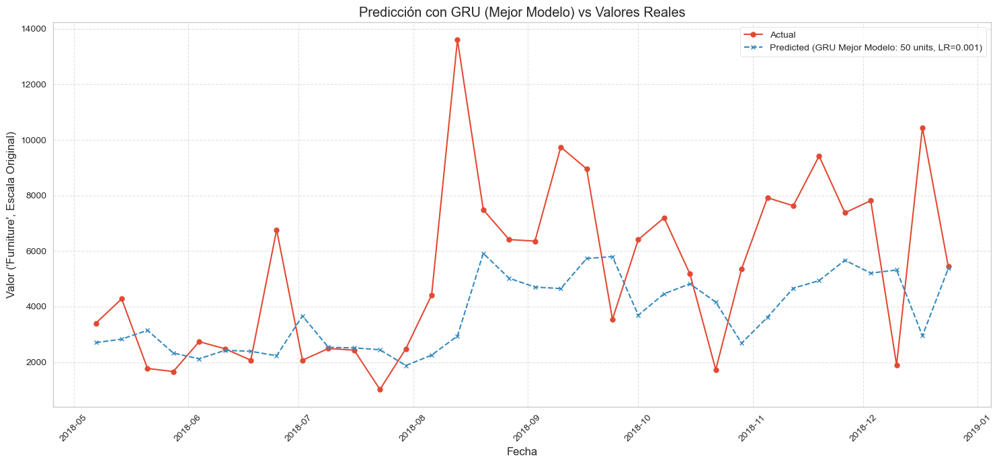


Proceso completado.


In [374]:

# Predicción con el mejor modelo encontrado (la salida es escalada)
# Usamos X_test_scaled, ya que el modelo fue entrenado con datos escalados
y_pred_scaled_best = best_model_gru.predict(X_test_scaled)

# --- Desescalar las predicciones y los valores reales de prueba para la evaluación final ---
# Usamos scaler_y porque fue el que se ajustó a la variable objetivo original
# Usamos reshape(-1, 1) porque inverse_transform espera una entrada 2D
y_test_real_final = scaler_y.inverse_transform(y_test_scaled.reshape(-1, 1))
y_pred_real_final = scaler_y.inverse_transform(y_pred_scaled_best.reshape(-1, 1))

# --- Evaluación final del mejor modelo en la escala original ---
rmse = np.sqrt(mean_squared_error(y_test_real_final, y_pred_real_final))
mae = mean_absolute_error(y_test_real_final, y_pred_real_final)

# Imprimir resultados con el formato solicitado
print(f'\n--- Evaluación del Mejor GRU (Escala Original) ---')
print(f'MAE:  {mae:,.2f}')
print(f'RMSE: {rmse:,.2f}')


# --- 5. Visualización de Predicción vs Valores Reales (Escala Original) ---


# Para plotear, necesitamos el índice de tiempo correspondiente a X_test
# Asegúrate de que df_ventas_resample_semanal tiene un índice de tiempo
test_dates = df_ventas_resample_semanal.index[train_size + lags : train_size + lags + len(y_test_real_final)]


plt.figure(figsize=(15, 7)) # Tamaño de gráfico más grande
plt.plot(test_dates, y_test_real_final, label='Actual', marker='o', markersize=5, linestyle='-')
plt.plot(test_dates, y_pred_real_final, label=f'Predicted (GRU Mejor Modelo: {best_params_gru["units"]} units, LR={best_params_gru["lr"]})',
         linestyle='--', marker='x', markersize=5)
plt.title("Predicción con GRU (Mejor Modelo) vs Valores Reales")
plt.xlabel("Fecha") # Etiqueta del eje X como Fecha
plt.ylabel("Valor ('Furniture', Escala Original)") # Etiqueta del eje Y indicando la escala original
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.xticks(rotation=45) # Rotar etiquetas del eje X para que no se solapen
plt.tight_layout() # Ajustar el diseño para evitar recortes
plt.show()

print("\nProceso completado.")

In [375]:
# --- Código para verificar el estado del scaler y los datos originales ---
print("\n--- Verificación de Escala ---")
print(f"Min y_train original: {y_train.min()}")
print(f"Max y_train original: {y_train.max()}")

# El scaler aprende min_[0] y scale_[0] de la primera característica (la única en este caso)
# MinMax Scaler escala a: scaled_value = (original_value - min) / (max - min)
# Escala aprendida = max - min
# Min aprendido = min
# El scaler almacena 'min_' y 'scale_' (que es max - min)
print(f"Scaler aprendió min: {scaler_y.min_[0]:.4f}")
print(f"Scaler aprendió scale (max-min): {scaler_y.scale_[0]:.4f}")
print(f"Scaler aprendió max (min + scale): {(scaler_y.min_[0] + scaler_y.scale_[0]):.4f}")

# Imprimir los primeros valores de y_test_scaled
print(f"Primeros 5 valores de y_test_scaled: {y_test_scaled[:5].flatten()}")

# Imprimir los primeros valores de y_test_real_final (desescalados) justo antes del plot
# Asegúrate de que estas líneas estén después de calcular y_test_real_final y y_pred_real_final
# justo antes de plt.figure(...)
# print(f"Primeros 5 valores de y_test_real_final (desescalados): {y_test_real_final[:5].flatten()}")
# print(f"Primeros 5 valores de y_pred_real_final (desescalados): {y_pred_real_final[:5].flatten()}")

print("--- Fin Verificación ---")
# --------------------------------------------------------------------


--- Verificación de Escala ---
Min y_train original: 56.78
Max y_train original: 12338.674000000003
Scaler aprendió min: -0.0046
Scaler aprendió scale (max-min): 0.0001
Scaler aprendió max (min + scale): -0.0045
Primeros 5 valores de y_test_scaled: [0.27224905 0.34379274 0.13977567 0.13067724 0.21823605]
--- Fin Verificación ---


##### __Modelo TBATS__ #####

TBATS es un modelo avanzado de series temporales que combina varias técnicas para manejar tendencias complejas, estacionalidades múltiples y efectos de calendario. 

diseñado para trabajar con datos de frecuencia irregular o con múltiples ciclos estacionales.

TBATS es un acrónimo que describe los componentes clave del modelo:

T: Box-Cox Transformation → Aplica una transformación para estabilizar la varianza de la serie.

B: Trend with Damping → Modela la tendencia de la serie con un parámetro de amortiguación para evitar explosiones exponenciales.

A: ARMA Errors → Añade un modelo ARMA a los residuos para capturar dependencias temporales.

T: Seasonality modeled with Trigonometric Functions → Usa funciones trigonométricas para capturar patrones estacionales complejos.

S: Multiple Seasonalities → Puede manejar múltiples patrones estacionales simultáneamente (por ejemplo, diarios, semanales y anuales).


 Evaluación del modelo TBATS:
MAE: 1910.89
RMSE: 2619.40


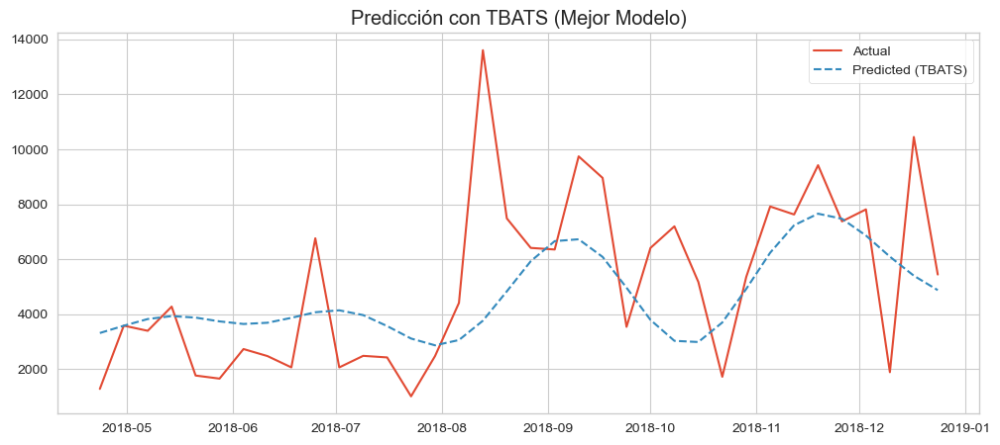

In [376]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tbats import TBATS, BATS
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Asegurar que los datos estén ordenados temporalmente
df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

# Normalización (opcional, TBATS no siempre la necesita)
scaler = MinMaxScaler()
df['Office Supplies'] = scaler.fit_transform(df[['Office Supplies']])

# Separar en conjunto de entrenamiento y prueba
train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

# Inicializar modelo TBATS
tbats_model = TBATS(seasonal_periods=[52])  # Como los datos son semanales, probamos con estacionalidad anual

# Ajustar modelo a los datos de entrenamiento
fitted_model = tbats_model.fit(train['Office Supplies'])

# Predicción
y_pred = fitted_model.forecast(steps=len(test))

# Desescalar predicciones y valores reales
y_pred_real = scaler.inverse_transform(y_pred.reshape(-1, 1))
y_test_real = scaler.inverse_transform(test['Office Supplies'].values.reshape(-1, 1))

# Evaluación
mae = mean_absolute_error(y_test_real, y_pred_real)
rmse = np.sqrt(mean_squared_error(y_test_real, y_pred_real))

print(f'\n Evaluación del modelo TBATS:')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

# Graficar resultados
plt.figure(figsize=(12, 5))
plt.plot(test.index, y_test_real, label='Actual')
plt.plot(test.index, y_pred_real, label='Predicted (TBATS)', linestyle='dashed')
plt.title("Predicción con TBATS (Mejor Modelo)")
plt.legend()
plt.show()

##### __Modelo Prophet__ #####

El modelo Prophet está diseñado específicamente para la predicción de series temporales. Se basa en la descomposición de la serie en tendencia, estacionalidad y efectos de eventos especiales.

01:44:05 - cmdstanpy - INFO - Chain [1] start processing
01:44:05 - cmdstanpy - INFO - Chain [1] done processing



Últimas fechas en test['ds']:
175   2018-11-26
176   2018-12-03
177   2018-12-10
178   2018-12-17
179   2018-12-24
Name: ds, dtype: datetime64[ns]

Últimas fechas en forecast['ds']:
175   2018-11-26
176   2018-12-03
177   2018-12-10
178   2018-12-17
179   2018-12-24
Name: ds, dtype: datetime64[ns]

NaN en y (valores reales): 0
NaN en yhat (predicciones): 0

 Evaluación del modelo Prophet:
MAE: 2192.82
RMSE: 2889.93


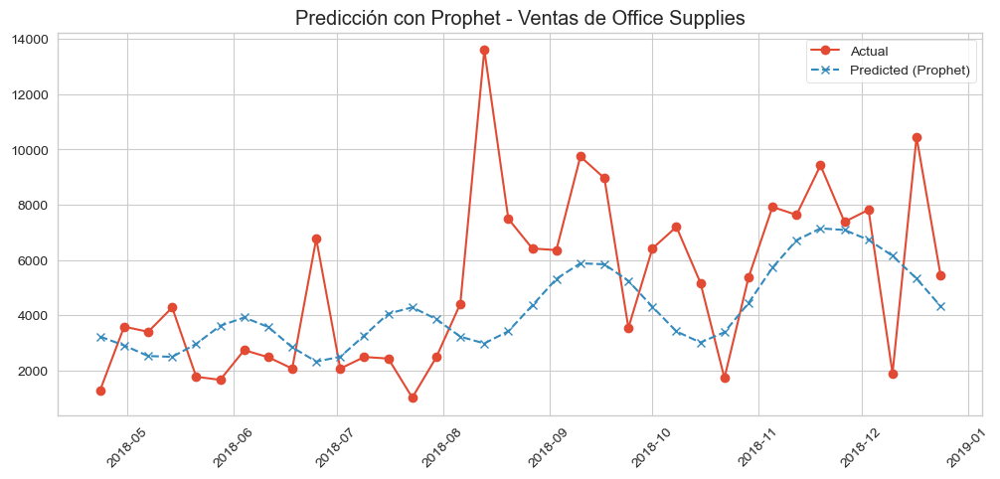

In [377]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Asegurar que los datos estén ordenados temporalmente
df = df_ventas_resample_semanal[['Office Supplies']].copy()
df = df.dropna()

# Renombrar columnas para Prophet ('ds' -> fecha, 'y' -> variable a predecir)
df_prophet = df.reset_index().rename(columns={'pedido_d': 'ds', 'Office Supplies': 'y'})

# Asegurar que 'ds' es tipo datetime
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])

# Separar en conjunto de entrenamiento y prueba (80% - 20%)
train_size = int(len(df_prophet) * 0.8)
train, test = df_prophet.iloc[:train_size], df_prophet.iloc[train_size:]

# Definir modelo Prophet con estacionalidad semanal y anual
model = Prophet(
    yearly_seasonality=True,  
    weekly_seasonality=True,  
    daily_seasonality=False   
)

# Ajustar el modelo con datos de entrenamiento
model.fit(train)

# Crear un dataframe de predicciones para las fechas futuras con semanas que inician en lunes
future = model.make_future_dataframe(periods=len(test), freq='W-MON')

# Generar predicciones
forecast = model.predict(future)

# Convertir las fechas a datetime para evitar desajustes
forecast['ds'] = pd.to_datetime(forecast['ds'])
test['ds'] = pd.to_datetime(test['ds'])

# Verificar que ahora las fechas coinciden
print("\nÚltimas fechas en test['ds']:")
print(test['ds'].tail())

print("\nÚltimas fechas en forecast['ds']:")
print(forecast['ds'].tail())

# Unir las predicciones con los datos de prueba usando merge
forecast_test = test.merge(forecast[['ds', 'yhat']], on='ds', how='left')

# Verificar NaN antes de calcular métricas
print(f"\nNaN en y (valores reales): {forecast_test['y'].isna().sum()}")
print(f"NaN en yhat (predicciones): {forecast_test['yhat'].isna().sum()}")

# Eliminar filas con NaN en las predicciones
forecast_test = forecast_test.dropna(subset=['y', 'yhat'])

# Evaluación del modelo
mae = mean_absolute_error(forecast_test['y'], forecast_test['yhat'])
rmse = np.sqrt(mean_squared_error(forecast_test['y'], forecast_test['yhat']))

print(f'\n Evaluación del modelo Prophet:')
print(f'MAE: {mae:.2f}')
print(f'RMSE: {rmse:.2f}')

# Graficar resultados
plt.figure(figsize=(12, 5))
plt.plot(test['ds'], test['y'], label='Actual', marker='o')
plt.plot(test['ds'], forecast_test['yhat'], label='Predicted (Prophet)', linestyle='dashed', marker='x')
plt.title("Predicción con Prophet - Ventas de Office Supplies")
plt.legend()
plt.xticks(rotation=45)
plt.show()

## __Análisis de causalidad__ ##

In [378]:
# Para Granger Causality
from statsmodels.tsa.stattools import grangercausalitytests
# Para VAR
from statsmodels.tsa.api import VAR

Exploramos de nuevo las series temporales para analizar qué series podrían tener mayor correlación

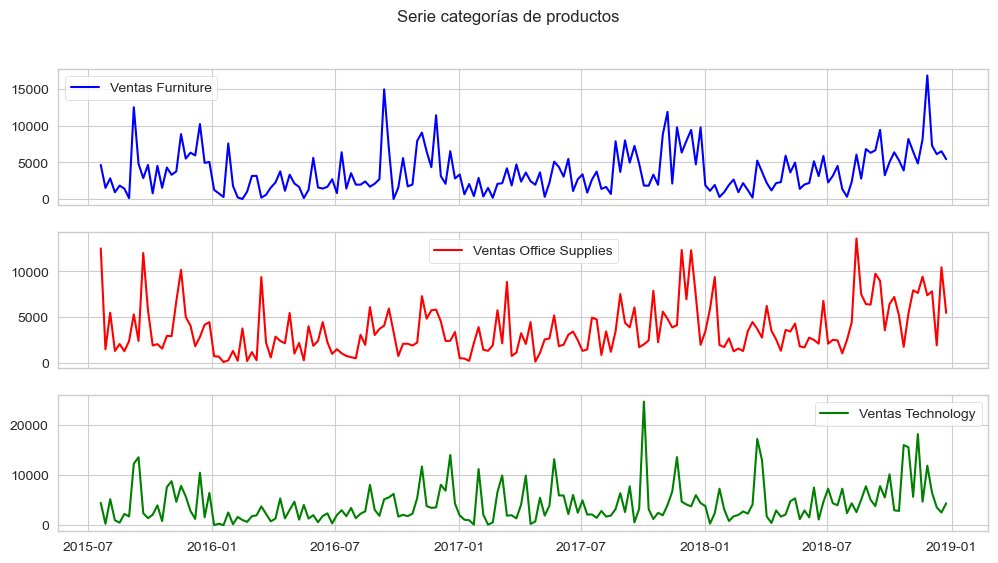

In [379]:
# Visualización
fig, ax = plt.subplots(3,1, figsize=(12,6), sharex=True)
ax[0].plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Furniture'], label='Ventas Furniture', color='blue')
ax[0].legend()
ax[1].plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Office Supplies'], label='Ventas Office Supplies', color='red')
ax[1].legend()
ax[2].plot(df_ventas_resample_semanal.index, df_ventas_resample_semanal['Technology'], label='Ventas Technology', color='green')
ax[2].legend()
plt.suptitle("Serie categorías de productos")
plt.show()

A simple vista, vemos que la serie de ventas Furniture y de Ventas Office Supplies tienen una cierta semejanza y es posible que compartan ciclo de vida del producto, ciclo de calendario comercial de retail, ya que son productos muy similares y tienen cierta correlación, analizando las series. 

Para corroborar dicha afirmación, vamos a utilizar el test de Granger para analizar la causalidad que pudiera darse entre ambas series.

__Análisis de Causalidad en la serie de Furniture y Office Supplies.__

In [380]:
max_lag = 10
# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Furniture', 'Office Supplies']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4498  , p=0.0120  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=6.5598  , p=0.0104  , df=1
likelihood ratio test: chi2=6.4424  , p=0.0111  , df=1
parameter F test:         F=6.4498  , p=0.0120  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1391  , p=0.0068  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=10.5753 , p=0.0051  , df=2
likelihood ratio test: chi2=10.2731 , p=0.0059  , df=2
parameter F test:         F=5.1391  , p=0.0068  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6357  , p=0.0141  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=11.3561 , p=0.0099  , df=3
likelihood ratio test: chi2=11.0067 , p=0.0117  , df=3
parameter F test:         F=3.6357  , p=0.0141  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.0369  , p=0.0189  

{1: ({'ssr_ftest': (6.449818643364124, 0.01196174426769958, 176.0, 1),
   'ssr_chi2test': (6.559758733876013, 0.010431050788912787, 1),
   'lrtest': (6.442420116731228, 0.01114267415087941, 1),
   'params_ftest': (6.44981864336405, 0.011961744267700062, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (5.139140227606009, 0.006790258121972236, 173.0, 2),
   'ssr_chi2test': (10.57534058397537, 0.005053519781771785, 2),
   'lrtest': (10.27310295392681, 0.005877924962060323, 2),
   'params_ftest': (5.139140227607675, 0.006790258121961597, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (3.6356727644487026, 0.014082995280055377, 170.0, 3),
   'ssr_chi2test': (11.35613081130742, 0.00994807406960735, 3),
   'lrtest': (11.006700950776576, 0.011689696130603597, 3),
   'params_ftest': (3.6356727645596436, 0.014082995278023785, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0

En este primer análisis realizamos el test de causalidad de Furniture sobre Office Supplies, por lo que vamos a realizar un análisis de si nuestra intuición con la gráfica anterior es correcta.

Hemos realizado el test de Granger y observamos que los p-valor para lags 1,2,3,4,5 son muy significativos, ya que p-valor<0,05. Lo que sí observamos que para lag 6 ya no es tan significativa, para el lag 7 vuelve a tener cierta significancia y a partir de ahí deja de tener significancia.

Por lo que podemos afirmar que puede existir causalidad y se podría estimar un modelo con los lags de las otras variables.

Realizamos ahora el mismo análisis pero con la variable de Office Supplies como variable dependiente. Vamos a analizar si hay o no causalidad respecto a la variable de Furniture.

__Análisis de Causalidad en la serie de Office Supplies y Furniture.__

In [381]:
max_lag = 10

# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Office Supplies', 'Furniture']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0187 , p=0.0018  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=10.1895 , p=0.0014  , df=1
likelihood ratio test: chi2=9.9100  , p=0.0016  , df=1
parameter F test:         F=10.0187 , p=0.0018  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.8774  , p=0.0225  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=7.9788  , p=0.0185  , df=2
likelihood ratio test: chi2=7.8052  , p=0.0202  , df=2
parameter F test:         F=3.8774  , p=0.0225  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2464  , p=0.0234  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=10.1403 , p=0.0174  , df=3
likelihood ratio test: chi2=9.8604  , p=0.0198  , df=3
parameter F test:         F=3.2464  , p=0.0234  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9597  , p=0.1030  

{1: ({'ssr_ftest': (10.018683977585901, 0.0018263134193915566, 176.0, 1),
   'ssr_chi2test': (10.189456999931116, 0.0014124590219467186, 1),
   'lrtest': (9.909999396933472, 0.0016438317236413145, 1),
   'params_ftest': (10.018683977585818, 0.0018263134193916382, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (3.8773555119905043, 0.022528659125928052, 173.0, 2),
   'ssr_chi2test': (7.978835620049824, 0.018510487603724656, 2),
   'lrtest': (7.805180732507324, 0.02018954533447075, 2),
   'params_ftest': (3.8773555119919427, 0.022528659125897042, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (3.2464144510114297, 0.023351170643060564, 170.0, 3),
   'ssr_chi2test': (10.140271020512172, 0.017410651317627653, 3),
   'lrtest': (9.860442642829184, 0.019790445954762412, 3),
   'params_ftest': (3.246414451076457, 0.0233511706410905, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
   

In [382]:
model_var = VAR(df_ventas_resample_semanal[['Furniture','Office Supplies']].dropna())
results_var = model_var.fit(maxlags=10, ic='aic')
print(results_var.summary())

# Ver información de las ecuaciones
results_var.test_causality('Furniture', ['Office Supplies'], kind='f')
results_var.test_causality('Office Supplies', ['Furniture'], kind='f')

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 27, May, 2025
Time:                     01:44:06
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    31.6532
Nobs:                     177.000    HQIC:                   31.5039
Log likelihood:          -3267.38    FPE:                4.34251e+13
AIC:                      31.4020    Det(Omega_mle):     4.01838e+13
--------------------------------------------------------------------
Results for equation Furniture
                        coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------
const                   1276.562461       440.529103            2.898           0.004
L1.Furniture               0.150470         0.080252            1.875           0.061
L1.Office Supplies         0.160606 

Hemos realizado el test de Granger y observamos que los p-valor para lags 1,2,3 son muy significativos, ya que p-valor<0,05. Lo que sí observamos que para resto de lags no es tan significativa.

Por lo que podemos afirmar que puede existir causalidad en los primeros lags y se podría estimar un modelo con los lags de las otras variables.

__Análisis de Causalidad en la serie de Furniture y Technology.__

In [383]:
max_lag = 10
# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Furniture', 'Technology']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6246  , p=0.4304  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=0.6352  , p=0.4254  , df=1
likelihood ratio test: chi2=0.6341  , p=0.4259  , df=1
parameter F test:         F=0.6246  , p=0.4304  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7336  , p=0.1797  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=3.5674  , p=0.1680  , df=2
likelihood ratio test: chi2=3.5321  , p=0.1710  , df=2
parameter F test:         F=1.7336  , p=0.1797  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8993  , p=0.4428  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=2.8091  , p=0.4220  , df=3
likelihood ratio test: chi2=2.7871  , p=0.4256  , df=3
parameter F test:         F=0.8993  , p=0.4428  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.3212  , p=0.2641  

{1: ({'ssr_ftest': (0.6245919935548868, 0.4304095431248709, 176.0, 1),
   'ssr_chi2test': (0.6352384479904815, 0.4254403021707661, 1),
   'lrtest': (0.6341139348010074, 0.42585029890602355, 1),
   'params_ftest': (0.6245919935548988, 0.43040954312486357, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (1.7336063231531944, 0.17970066226653653, 173.0, 2),
   'ssr_chi2test': (3.567421104292123, 0.16801356611642038, 2),
   'lrtest': (3.532143102475402, 0.1710034493171321, 2),
   'params_ftest': (1.7336063231532317, 0.17970066226653353, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (0.8993383412291096, 0.4428382991854384, 170.0, 3),
   'ssr_chi2test': (2.809109759956807, 0.4220024831019139, 3),
   'lrtest': (2.7870516028488055, 0.4256358918267086, 3),
   'params_ftest': (0.8993383412290369, 0.4428382991854747, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0.

Hemos realizado el test de Granger y observamos que los p-valor>0,05 no es muy significativa por lo que no se observa Causalidad

__Análisis de Causalidad en la serie de Technology y Furniture.__

In [384]:
max_lag = 10
# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Technology', 'Furniture']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8182  , p=0.0169  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=5.9173  , p=0.0150  , df=1
likelihood ratio test: chi2=5.8216  , p=0.0158  , df=1
parameter F test:         F=5.8182  , p=0.0169  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0977  , p=0.0182  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=8.4323  , p=0.0148  , df=2
likelihood ratio test: chi2=8.2386  , p=0.0163  , df=2
parameter F test:         F=4.0977  , p=0.0182  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.5307  , p=0.0589  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=7.9048  , p=0.0480  , df=3
likelihood ratio test: chi2=7.7334  , p=0.0519  , df=3
parameter F test:         F=2.5307  , p=0.0589  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9182  , p=0.1097  

{1: ({'ssr_ftest': (5.818150655151836, 0.016889141717473993, 176.0, 1),
   'ssr_chi2test': (5.917323677682834, 0.01499271559190609, 1),
   'lrtest': (5.8216206352894915, 0.015830352418294263, 1),
   'params_ftest': (5.818150655151876, 0.016889141717473726, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (4.097696050293036, 0.018249859309378395, 173.0, 2),
   'ssr_chi2test': (8.432253143955613, 0.014755689054070913, 2),
   'lrtest': (8.238617660513682, 0.01625574603984765, 2),
   'params_ftest': (4.097696050293102, 0.018249859309377087, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (2.5307388047164654, 0.05887611147204499, 170.0, 3),
   'ssr_chi2test': (7.9048370900261355, 0.04801992743261877, 3),
   'lrtest': (7.733407190936759, 0.05185498243210538, 3),
   'params_ftest': (2.530738804716774, 0.05887611147202033, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0.,

Hemos realizado el test de Granger y observamos que los p-valor<0,05 para lags 1,2 son muy significativos, ya que p-valor<0,05. Podría haber Causalidad en los primeros retardos, pero habiendo analizado la serie alrevés en el punto 7.3. observamos que puede ser causalidad que hayamos tenido esos p-valores en los dos primeros retardos. 

Lo que sí observamos que para resto de lags no es tan significativa.

In [385]:
model_var = VAR(df_ventas_resample_semanal[['Technology','Furniture']].dropna())
results_var = model_var.fit(maxlags=10, ic='aic')
print(results_var.summary())

# Ver información de las ecuaciones
results_var.test_causality('Furniture', ['Technology'], kind='f')
results_var.test_causality('Technology', ['Furniture'], kind='f')

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 27, May, 2025
Time:                     01:44:06
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    32.4590
Nobs:                     178.000    HQIC:                   32.3527
Log likelihood:          -3368.08    FPE:                1.04504e+14
AIC:                      32.2802    Det(Omega_mle):     9.88717e+13
--------------------------------------------------------------------
Results for equation Technology
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const              2587.209670       567.919866            4.556           0.000
L1.Technology         0.125818         0.079267            1.587           0.112
L1.Furniture          0.220042         0.106962        

__Análisis de Causalidad en la serie de Office Supplies y Technology.__

In [386]:
max_lag = 10
# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Office Supplies', 'Technology']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3967 , p=0.0005  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=12.6080 , p=0.0004  , df=1
likelihood ratio test: chi2=12.1838 , p=0.0005  , df=1
parameter F test:         F=12.3967 , p=0.0005  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.0437 , p=0.0001  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=20.6681 , p=0.0000  , df=2
likelihood ratio test: chi2=19.5536 , p=0.0001  , df=2
parameter F test:         F=10.0437 , p=0.0001  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.8449  , p=0.0002  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=21.3804 , p=0.0001  , df=3
likelihood ratio test: chi2=20.1844 , p=0.0002  , df=3
parameter F test:         F=6.8449  , p=0.0002  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.8203  , p=0.0011  

{1: ({'ssr_ftest': (12.396741837285427, 0.0005476961065389426, 176.0, 1),
   'ssr_chi2test': (12.60804993678461, 0.0003840890057958897, 1),
   'lrtest': (12.18382708441186, 0.00048205640525375326, 1),
   'params_ftest': (12.396741837285452, 0.0005476961065389365, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (10.043746439624403, 7.46886319262414e-05, 173.0, 2),
   'ssr_chi2test': (20.668056257261778, 3.2507877004343095e-05, 2),
   'lrtest': (19.553624434232006, 5.675242239632257e-05, 2),
   'params_ftest': (10.043746439624426, 7.46886319262398e-05, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (6.844934080991445, 0.00022143635468938676, 170.0, 3),
   'ssr_chi2test': (21.380352923567397, 8.776292852515362e-05, 3),
   'lrtest': (20.18444806936077, 0.00015543817641091472, 3),
   'params_ftest': (6.844934080991437, 0.00022143635468938898, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1.

Hemos realizado el test de Granger y observamos que los p-valor<0,05 para los 9 primeros lags son muy significativos, ya que p-valor<0,05. Podría haber Causalidad entre ambas series temporales

Lo que sí observamos que para lag 10 no es tan significativa.

__Análisis de Causalidad en la serie de Technology y Office Supplies.__

In [387]:
max_lag = 10
# Granger tests: La función requiere un array con la forma [Y, X]
# Por convención, el primer col es la variable "dependiente".
# Queremos ver si 'precio' Granger causa 'ventas'.

data_for_test = df_ventas_resample_semanal[['Technology', 'Furniture']].dropna()  # [Y=ventas, X=precio]
grangercausalitytests(data_for_test, maxlag=max_lag, addconst=True, verbose=True)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8182  , p=0.0169  , df_denom=176, df_num=1
ssr based chi2 test:   chi2=5.9173  , p=0.0150  , df=1
likelihood ratio test: chi2=5.8216  , p=0.0158  , df=1
parameter F test:         F=5.8182  , p=0.0169  , df_denom=176, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0977  , p=0.0182  , df_denom=173, df_num=2
ssr based chi2 test:   chi2=8.4323  , p=0.0148  , df=2
likelihood ratio test: chi2=8.2386  , p=0.0163  , df=2
parameter F test:         F=4.0977  , p=0.0182  , df_denom=173, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.5307  , p=0.0589  , df_denom=170, df_num=3
ssr based chi2 test:   chi2=7.9048  , p=0.0480  , df=3
likelihood ratio test: chi2=7.7334  , p=0.0519  , df=3
parameter F test:         F=2.5307  , p=0.0589  , df_denom=170, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9182  , p=0.1097  

{1: ({'ssr_ftest': (5.818150655151836, 0.016889141717473993, 176.0, 1),
   'ssr_chi2test': (5.917323677682834, 0.01499271559190609, 1),
   'lrtest': (5.8216206352894915, 0.015830352418294263, 1),
   'params_ftest': (5.818150655151876, 0.016889141717473726, 176.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (4.097696050293036, 0.018249859309378395, 173.0, 2),
   'ssr_chi2test': (8.432253143955613, 0.014755689054070913, 2),
   'lrtest': (8.238617660513682, 0.01625574603984765, 2),
   'params_ftest': (4.097696050293102, 0.018249859309377087, 173.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (2.5307388047164654, 0.05887611147204499, 170.0, 3),
   'ssr_chi2test': (7.9048370900261355, 0.04801992743261877, 3),
   'lrtest': (7.733407190936759, 0.05185498243210538, 3),
   'params_ftest': (2.530738804716774, 0.05887611147202033, 170.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0.,

Hemos realizado el test de Granger y observamos que los p-valor para los 2 primeros lags son muy significativos, ya que p-valor<0,05. Podría haber Causalidad entre ambas series temporales en los primero lags de la serie temporal, ya que observamos que en el punto 7.5. sería muy fuerte para los 9 primeros lags

Lo que sí observamos que para lag 3 en adelante no es tan significativa.

In [388]:
model_var = VAR(df_ventas_resample_semanal[['Technology','Office Supplies']].dropna())
results_var = model_var.fit(maxlags=10, ic='aic')
print(results_var.summary())

# Ver información de las ecuaciones
results_var.test_causality('Office Supplies', ['Technology'], kind='f')
results_var.test_causality('Technology', ['Office Supplies'], kind='f')

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Tue, 27, May, 2025
Time:                     01:44:06
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    32.2716
Nobs:                     178.000    HQIC:                   32.1653
Log likelihood:          -3351.40    FPE:                8.66448e+13
AIC:                      32.0928    Det(Omega_mle):     8.19748e+13
--------------------------------------------------------------------
Results for equation Technology
                        coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------
const                   2475.461305       592.989186            4.175           0.000
L1.Technology              0.164340         0.075406            2.179           0.029
L1.Office Supplies         0.219528

__Redes convolucionales__

In [389]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping


# Extraer la serie y eliminar nulos
serie = df_ventas_resample_semanal["Office Supplies"].dropna()

# Parámetros
n_lags = 52   # Semanas anteriores como input
horizon = 1   # Predicción de 1 semana adelante

# Crear función para generar ventanas de datos
def crear_dataset_ventanas(serie, n_lags, horizon):
    X, y = [], []
    for i in range(n_lags, len(serie) - horizon + 1):
        X.append(serie[i - n_lags:i])
        y.append(serie[i:i + horizon])
    return np.array(X), np.array(y)

# Normalizar la serie
scaler = StandardScaler()
serie_scaled = scaler.fit_transform(serie.values.reshape(-1, 1)).flatten()

# Crear ventanas
X, y = crear_dataset_ventanas(serie_scaled, n_lags=n_lags, horizon=horizon)

# Dividir en entrenamiento y prueba (80/20)
train_size = int(0.8 * len(X))

# Fechas para graficar (desde n_lags + horizon - 1 hasta el final)
fechas = serie.index[n_lags + horizon - 1:]
fechas_test = fechas[train_size:]

# Redimensionar para CNN: (samples, timesteps, features)
X = X.reshape((X.shape[0], X.shape[1], 1))

# Dividir X y y en train/test
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]



In [390]:
model = Sequential([
    Conv1D(filters=64,  # Aumentar capacidad (de 32 a 64)
           kernel_size=5,  # Ventana más ancha (de 3 a 5)
           activation='relu',
           input_shape=(n_lags, 1)),
    Conv1D(filters=32,  # Mayor capacidad (de 16 a 32)
           kernel_size=3,
           activation='relu'),
    Flatten(),
    Dense(32, activation='relu'),  # Más neuronas (de 16 a 32)
    Dense(horizon)
])

# Optimizador con learning rate más bajo y clipvalue
optimizer = Adam(learning_rate=0.0001,  # Reducir LR (de 0.001)
                 clipvalue=0.5)  # Nuevo: limita gradientes

# Usar Huber loss en lugar de MSE (mejor para picos)
model.compile(optimizer=optimizer, loss='huber')  # Cambiado de 'mse'

# Entrenamiento más largo con EarlyStopping
history = model.fit(
    X_train, y_train,
    epochs=200,  # Más épocas (de 50)
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[EarlyStopping(patience=20)],  # Detiene si no mejora
    verbose=1
) 

Epoch 1/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2972 - val_loss: 0.7591
Epoch 2/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3346 - val_loss: 0.7993
Epoch 3/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3081 - val_loss: 0.8292
Epoch 4/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2277 - val_loss: 0.8430
Epoch 5/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2802 - val_loss: 0.8410
Epoch 6/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3059 - val_loss: 0.8257
Epoch 7/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2125 - val_loss: 0.8183
Epoch 8/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2485 - val_loss: 0.8268
Epoch 9/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2794 - val_loss: 0.8143
Epoch 10/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2234 - val_loss: 0.8167
Epoch 11/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.2345 - val_loss: 0.8143
Epoch 12/200
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.2525 - val_loss: 0.8077


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
MAE  (Error absoluto medio): 3395.58
RMSE (Raíz del error cuadrático medio): 4261.37


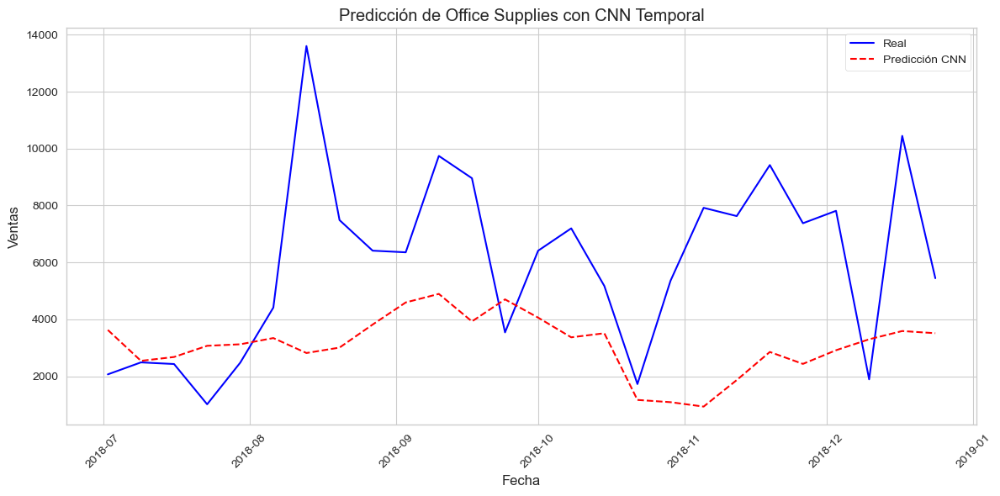

In [391]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Predecir
y_pred_scaled = model.predict(X_test)

# Invertir escalado
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_inv = scaler.inverse_transform(y_pred_scaled)

# Calcular métricas
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
mape = np.mean(np.abs((y_test_inv - y_pred_inv) / y_test_inv)) * 100

# Imprimir resultados
print(f"MAE  (Error absoluto medio): {mae:.2f}")
print(f"RMSE (Raíz del error cuadrático medio): {rmse:.2f}")


# Graficar resultados
plt.figure(figsize=(12, 6))
plt.plot(fechas_test, y_test_inv, label='Real', color='blue')
plt.plot(fechas_test, y_pred_inv, label='Predicción CNN', color='red', linestyle='--')
plt.title('Predicción de Office Supplies con CNN Temporal')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


__Redes convolución+LSTM__

Epoch 1/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0612 - val_loss: 0.0718
Epoch 2/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0288 - val_loss: 0.0432
Epoch 3/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0360 - val_loss: 0.0483
Epoch 4/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0305 - val_loss: 0.0568
Epoch 5/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0390 - val_loss: 0.0524
Epoch 6/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0298 - val_loss: 0.0534
Epoch 7/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0301 - val_loss: 0.0499
Epoch 8/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0370 - val_loss: 0.0510
Epoch 9/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0347 - val_loss: 0.0542
Epoch 10/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0388 - val_loss: 0.0555
Epoch 11/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0324 - val_loss: 0.0555
Epoch 12/300
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0375 - val_loss: 0.0493


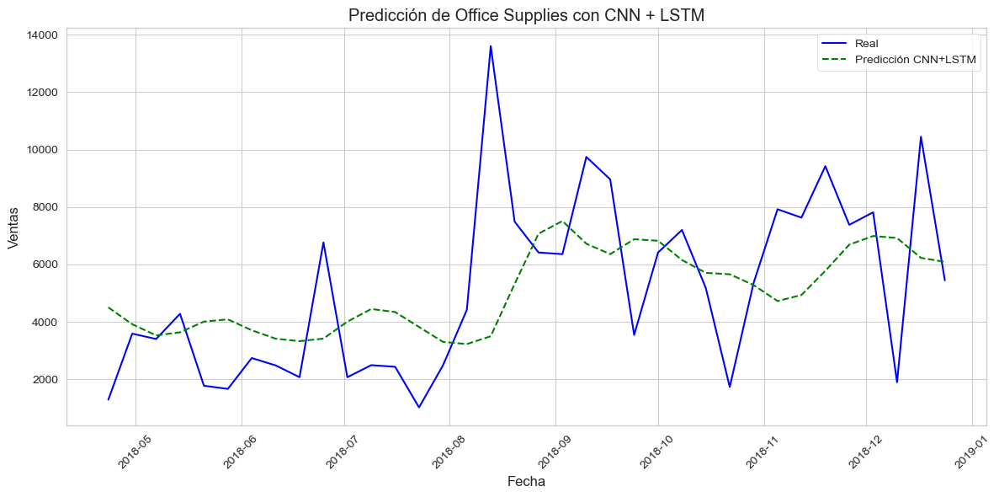

In [395]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Serie de ventas original con fechas
serie = df_ventas_resample_semanal["Office Supplies"].dropna()

# Normalizar los datos
scaler = MinMaxScaler()
ventas_scaled = scaler.fit_transform(serie.values.reshape(-1, 1))

# Horizon = 1
def crear_secuencias_cnn_lstm(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

n_steps = 4  # semanas anteriores para predecir la siguiente
X, y = crear_secuencias_cnn_lstm(ventas_scaled, n_steps)

# EXTRAER LAS FECHAS CORRESPONDIENTES A LOS DATOS DE y (los targets)
# Las fechas empiezan desde la posición n_steps porque la primera predicción usa los primeros n_steps datos.
fechas = serie.index[n_steps:]  # mismas posiciones que y

# Reshape para CNN + LSTM: (muestras, pasos, 1)
X = X.reshape((X.shape[0], X.shape[1], 1))

# División en entrenamiento y test (80%-20%)
split = int(len(X) * 0.8)
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]
fechas_test = fechas[split:]  # fechas correspondientes a test

# Construcción del modelo CNN + LSTM
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, 1)))
model.add(Dropout(0.2))
model.add(LSTM(50, activation='tanh'))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', patience=300, restore_best_weights=True)

# Entrenamiento
history = model.fit(
    X_train, y_train,
    epochs=300,
    batch_size=16,
    validation_data=(X_test, y_test),
    callbacks=[early_stop],
    verbose=1
)

# Predicción
y_pred_scaled = model.predict(X_test)

# Invertir el escalado
y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_inv = scaler.inverse_transform(y_pred_scaled)

# Métricas
mae = mean_absolute_error(y_test_inv, y_pred_inv)
rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
mape_abs = np.abs((y_test_inv - y_pred_inv) / y_test_inv)
mape = np.mean(mape_abs) * 100
mape_valor_absoluto = np.mean(mape_abs)

# Imprimir métricas
print(f"MAE  (Error absoluto medio): {mae:.2f}")
print(f"RMSE (Raíz del error cuadrático medio): {rmse:.2f}")

# Gráfico con fechas reales
plt.figure(figsize=(12, 6))
plt.plot(fechas_test, y_test_inv, label='Real', color='blue')
plt.plot(fechas_test, y_pred_inv, label='Predicción CNN+LSTM', color='green', linestyle='--')
plt.title('Predicción de Office Supplies con CNN + LSTM')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


__Holdrick Prescott__

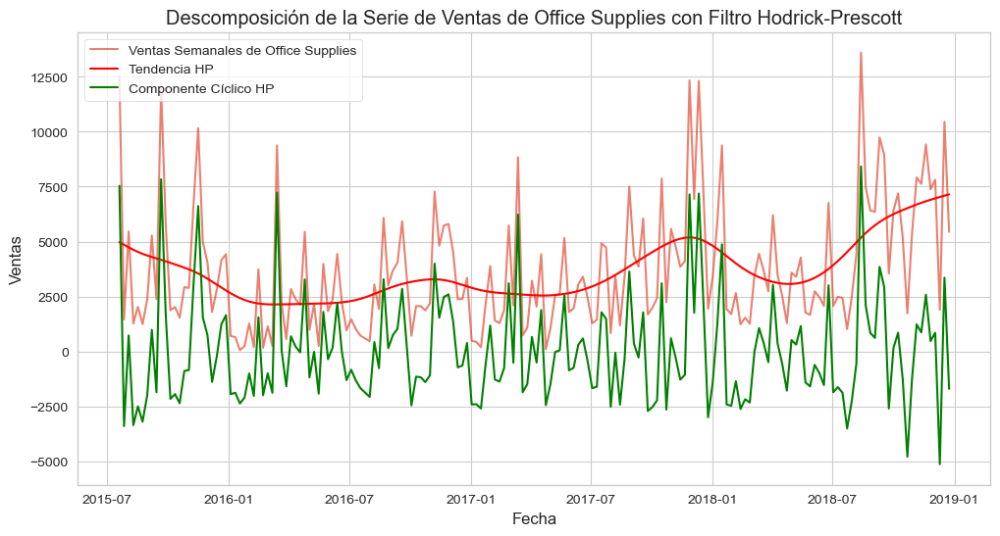


Análisis del Componente Cíclico:
Media del componente cíclico: -0.0000
Desviación estándar del componente cíclico: 2413.0030
Valor máximo del componente cíclico: 8418.4335 en la fecha: 2018-08-13 00:00:00
Valor mínimo del componente cíclico: -5133.7953 en la fecha: 2018-12-10 00:00:00

Periodos de Expansión (Componente Cíclico Positivo):
pedido_d
2015-07-20    7538.909692
2015-08-03     726.333165
2015-09-07     980.554528
2015-09-21    7839.652594
2015-09-28    1641.794157
                 ...     
2018-11-12     863.669560
2018-11-19    2583.310387
2018-11-26     472.832134
2018-12-03     845.537998
2018-12-17    3356.295324
Name: Ciclo, Length: 77, dtype: float64

Periodos de Contracción (Componente Cíclico Negativo):
pedido_d
2015-07-27   -3397.951662
2015-08-10   -3356.097926
2015-08-17   -2500.552990
2015-08-24   -3200.212525
2015-08-31   -2000.992180
                 ...     
2018-10-15   -1263.019586
2018-10-22   -4793.961016
2018-10-29   -1248.557190
2018-12-10   -5133.795343

In [396]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Supongamos que ya tienes tu DataFrame df_ventas_resample_semanal cargado
# y la columna 'Furniture' contiene tus datos de ventas semanales.

# Aplicar el filtro de Hodrick-Prescott
ciclo, tendencia = sm.tsa.filters.hpfilter(df_ventas_resample_semanal["Office Supplies"], lamb=1600)

# Crear un nuevo DataFrame para visualizar los resultados
df_hp = pd.DataFrame({'Ventas': df_ventas_resample_semanal["Office Supplies"], 'Tendencia': tendencia, 'Ciclo': ciclo})

# Visualizar la serie original, la tendencia y el componente cíclico
plt.figure(figsize=(12, 6))
plt.plot(df_hp.index, df_hp['Ventas'], label='Ventas Semanales de Office Supplies', alpha=0.7)
plt.plot(df_hp.index, df_hp['Tendencia'], label='Tendencia HP', color='red')
plt.plot(df_hp.index, df_hp['Ciclo'], label='Componente Cíclico HP', color='green')
plt.title('Descomposición de la Serie de Ventas de Office Supplies con Filtro Hodrick-Prescott')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

# Análisis del Componente Cíclico
print("\nAnálisis del Componente Cíclico:")
print(f"Media del componente cíclico: {df_hp['Ciclo'].mean():.4f}")
print(f"Desviación estándar del componente cíclico: {df_hp['Ciclo'].std():.4f}")
print(f"Valor máximo del componente cíclico: {df_hp['Ciclo'].max():.4f} en la fecha: {df_hp['Ciclo'].idxmax()}")
print(f"Valor mínimo del componente cíclico: {df_hp['Ciclo'].min():.4f} en la fecha: {df_hp['Ciclo'].idxmin()}")

# Puedes realizar análisis adicionales, como identificar periodos de expansión y contracción
# basados en los valores positivos y negativos del componente cíclico.

# Ejemplo de identificación de periodos (simplificado)
periodos_expansion = df_hp[df_hp['Ciclo'] > 0]
periodos_contraccion = df_hp[df_hp['Ciclo'] < 0]

print("\nPeriodos de Expansión (Componente Cíclico Positivo):")
print(periodos_expansion['Ciclo'])

print("\nPeriodos de Contracción (Componente Cíclico Negativo):")
print(periodos_contraccion['Ciclo'])

Prueba con Lamb a 10000

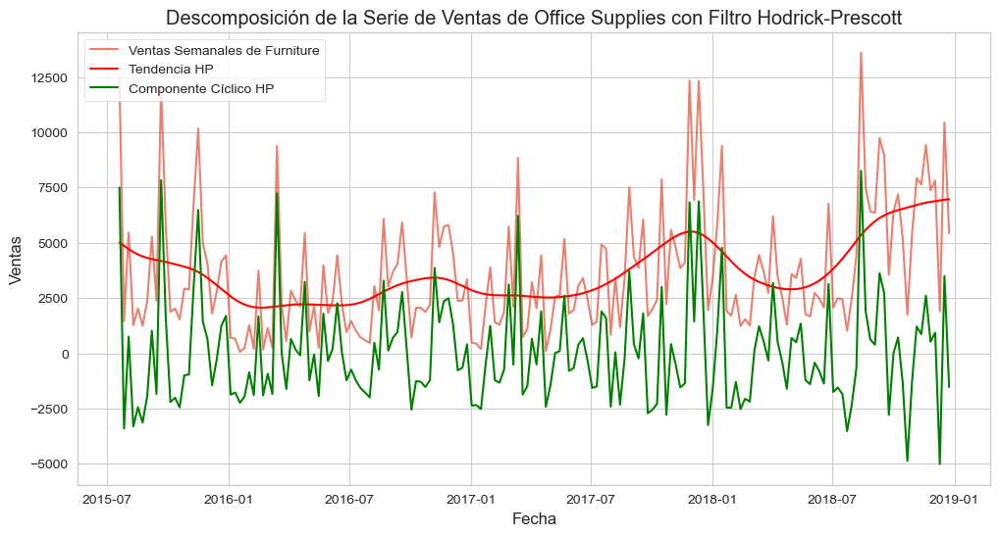


Análisis del Componente Cíclico:
Media del componente cíclico: -0.0000
Desviación estándar del componente cíclico: 2382.9085
Valor máximo del componente cíclico: 8254.0498 en la fecha: 2018-08-13 00:00:00
Valor mínimo del componente cíclico: -5018.6037 en la fecha: 2018-12-10 00:00:00

Periodos de Expansión (Componente Cíclico Positivo):
pedido_d
2015-07-20    7497.072894
2015-08-03     750.385676
2015-09-07    1017.893817
2015-09-21    7832.484457
2015-09-28    1614.002765
                 ...     
2018-11-12     865.483540
2018-11-19    2610.192817
2018-11-26     527.448772
2018-12-03     929.922884
2018-12-17    3501.702851
Name: Ciclo, Length: 81, dtype: float64

Periodos de Contracción (Componente Cíclico Negativo):
pedido_d
2015-07-27   -3404.514045
2015-08-10   -3308.617643
2015-08-17   -2439.843683
2015-08-24   -3137.446351
2015-08-31   -1946.827752
                 ...     
2018-10-15   -1362.706116
2018-10-22   -4864.433401
2018-10-29   -1293.490713
2018-12-10   -5018.603678

In [397]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Supongamos que ya tienes tu DataFrame df_ventas_resample_semanal cargado
# y la columna 'Furniture' contiene tus datos de ventas semanales.

# Aplicar el filtro de Hodrick-Prescott
ciclo, tendencia = sm.tsa.filters.hpfilter(df_ventas_resample_semanal["Office Supplies"], lamb=800)

# Crear un nuevo DataFrame para visualizar los resultados
df_hp = pd.DataFrame({'Ventas': df_ventas_resample_semanal["Office Supplies"], 'Tendencia': tendencia, 'Ciclo': ciclo})

# Visualizar la serie original, la tendencia y el componente cíclico
plt.figure(figsize=(12, 6))
plt.plot(df_hp.index, df_hp['Ventas'], label='Ventas Semanales de Furniture', alpha=0.7)
plt.plot(df_hp.index, df_hp['Tendencia'], label='Tendencia HP', color='red')
plt.plot(df_hp.index, df_hp['Ciclo'], label='Componente Cíclico HP', color='green')
plt.title('Descomposición de la Serie de Ventas de Office Supplies con Filtro Hodrick-Prescott')
plt.xlabel('Fecha')
plt.ylabel('Ventas')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

# Análisis del Componente Cíclico
print("\nAnálisis del Componente Cíclico:")
print(f"Media del componente cíclico: {df_hp['Ciclo'].mean():.4f}")
print(f"Desviación estándar del componente cíclico: {df_hp['Ciclo'].std():.4f}")
print(f"Valor máximo del componente cíclico: {df_hp['Ciclo'].max():.4f} en la fecha: {df_hp['Ciclo'].idxmax()}")
print(f"Valor mínimo del componente cíclico: {df_hp['Ciclo'].min():.4f} en la fecha: {df_hp['Ciclo'].idxmin()}")

# Puedes realizar análisis adicionales, como identificar periodos de expansión y contracción
# basados en los valores positivos y negativos del componente cíclico.

# Ejemplo de identificación de periodos (simplificado)
periodos_expansion = df_hp[df_hp['Ciclo'] > 0]
periodos_contraccion = df_hp[df_hp['Ciclo'] < 0]

print("\nPeriodos de Expansión (Componente Cíclico Positivo):")
print(periodos_expansion['Ciclo'])

print("\nPeriodos de Contracción (Componente Cíclico Negativo):")
print(periodos_contraccion['Ciclo'])

Análisis espectral

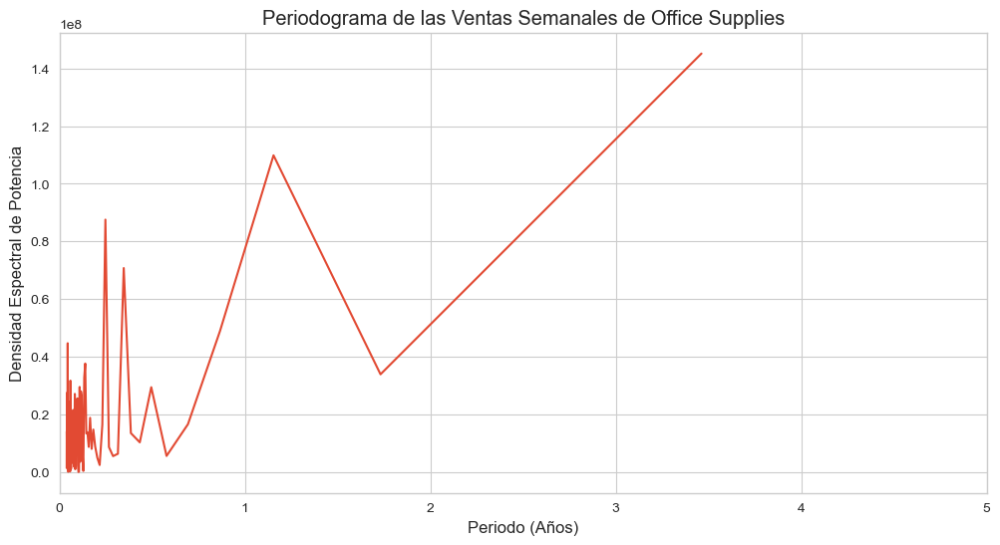


Los 5 picos principales en el espectro de potencia son:
Periodo: 3.46 años (180.00 semanas), Potencia: 1.45e+08
Periodo: 1.15 años (60.00 semanas), Potencia: 1.10e+08
Periodo: 0.25 años (12.86 semanas), Potencia: 8.76e+07
Periodo: 0.35 años (18.00 semanas), Potencia: 7.08e+07
Periodo: 0.87 años (45.00 semanas), Potencia: 4.89e+07


In [398]:
import pandas as pd
import numpy as np
from scipy.signal import periodogram
import matplotlib.pyplot as plt

# Obtener la serie temporal
ventas_semanales = df_ventas_resample_semanal["Office Supplies"].dropna()

# Calcular el periodograma
fs = 1  # Frecuencia de muestreo (1 observación por semana)
frequencies, power_spectrum = periodogram(ventas_semanales, fs)

# Convertir frecuencias a periodos (en semanas)
periods = 1 / frequencies
periods_in_years = periods / 52  # Aproximación de periodos en años

# Visualizar el periodograma
plt.figure(figsize=(12, 6))
plt.plot(periods_in_years, power_spectrum)
plt.title('Periodograma de las Ventas Semanales de Office Supplies')
plt.xlabel('Periodo (Años)')
plt.ylabel('Densidad Espectral de Potencia')
plt.xlim(0, 5)  # Limitar el eje x para enfocarse en periodos más relevantes
plt.grid(True)
plt.show()

# Identificar los picos principales en el espectro de potencia
top_n = 5  # Mostrar los 5 picos más importantes
top_indices = np.argsort(power_spectrum)[::-1][0:top_n]
top_periods_years = periods_in_years[top_indices]
top_power = power_spectrum[top_indices]

print("\nLos {} picos principales en el espectro de potencia son:".format(top_n))
for i in range(top_n):
    print(f"Periodo: {top_periods_years[i]:.2f} años ({top_periods_years[i] * 52:.2f} semanas), Potencia: {top_power[i]:.2e}")